In [1]:
!pip install tabpfn --no-index --find-links=file:///kaggle/input/pypi-iarc-packages/
!mkdir -p /opt/conda/lib/python3.10/site-packages/tabpfn/models_diff
!cp -r /kaggle/input/pypi-iarc-packages/prior_diff_real_checkpoint_n_0_epoch_100.cpkt/prior_diff_real_checkpoint_n_0_epoch_100.cpkt /opt/conda/lib/python3.10/site-packages/tabpfn/models_diff/

Looking in links: file:///kaggle/input/pypi-iarc-packages/
Processing /kaggle/input/pypi-iarc-packages/tabpfn-0.1.9-py3-none-any.whl


In [2]:
import numpy as np
import pandas as pd
import joblib
import optuna
from functools import partial

import xgboost as xgb
import lightgbm as lgb

# custom modules
from preproc import load_data,scale_data
#from calibration1 import (
#    calibrate_probs as calibrate_probs1,
#    optimize_calibration as optimize_calibration1
#)
from calibration2 import calibrate_probs,optimize_calibration

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
def balanced_logloss_(y_pred, y_true, eps=1e-7):
    n0 = np.sum(1-y_true)
    n1 = np.sum(y_true)
    p1 = np.clip(y_pred, eps, 1-eps)
    p0 = 1-p1
    log_loss0 = - np.sum((1-y_true) * np.log(p0)) / (n0+eps)
    log_loss1 = - np.sum(y_true * np.log(p1)) / (n1+eps)
    return (log_loss0 + log_loss1)/2


def compute_overall_metric(oof_dfs:list) -> float:
    all_metrics = [
        balanced_logloss_(oof.pred_proba.values, oof.Class.values)
        for oof in oof_dfs
    ]
    return np.mean(all_metrics)


def calibrate_oof(oof_dfs, calib_params):
    oof_dfs_calibrated = list()
    
    for oof in oof_dfs:
        oof = oof.copy(deep=True)
        calib_p1 = calibrate_probs(
            oof.pred_proba.values,
            **calib_params
        )
        oof["pred_proba"] = calib_p1
        oof_dfs_calibrated.append(oof)
        
    return oof_dfs_calibrated

In [4]:
# notebook parameter

CALIBRATE_FIRST = False

***
# load data and predictions

### 1. `lgbm-gbrt`

In [5]:
models_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/models.pkl")
calib_params_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/calib_params.pkl")
oof_dfs_m01 = joblib.load("/kaggle/input/iarc-lgbm-gbrt-bagging-balanced/oof_dataframes.pkl")

In [6]:
compute_overall_metric(oof_dfs_m01)

0.24033928714260183

In [7]:
oof_dfs_calib_m01 = calibrate_oof(oof_dfs_m01, calib_params_m01)
compute_overall_metric(oof_dfs_calib_m01)

0.22139398049564257

In [8]:
%%time
train,test,input_cols = load_data()

predicted_probs = [
    model.predict(test[input_cols]) 
    for model in models_m01
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m01)
predicted_probs_m01 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 195 ms, sys: 8.16 ms, total: 203 ms
Wall time: 177 ms


### 2. `lgbm-linear`

In [9]:
models_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/models.pkl")
calib_params_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/calib_params.pkl")
oof_dfs_m02 = joblib.load("/kaggle/input/iarc-lgbm-linear-bagging-balanced/oof_dataframes.pkl")

In [10]:
compute_overall_metric(oof_dfs_m02)

0.23776284612591142

In [11]:
oof_dfs_calib_m02 = calibrate_oof(oof_dfs_m02, calib_params_m02)
compute_overall_metric(oof_dfs_calib_m02)

0.21870748528950434

In [12]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(test[input_cols])
    for model in models_m02
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m02)
predicted_probs_m02 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 220 ms, sys: 7.65 ms, total: 228 ms
Wall time: 178 ms


### 3. `catboost`

In [13]:
models_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/models.pkl")
calib_params_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/calib_params.pkl")
oof_dfs_m03 = joblib.load("/kaggle/input/iarc-catboost-weight-balanced/oof_dataframes.pkl")

In [14]:
compute_overall_metric(oof_dfs_m03)

0.2633244023340282

In [15]:
oof_dfs_calib_m03 = calibrate_oof(oof_dfs_m03, calib_params_m03)
compute_overall_metric(oof_dfs_calib_m03)

0.22835158860669114

In [16]:
%%time
train,test,input_cols = load_data()

predicted_probs = [
    model.predict(test[input_cols], prediction_type="Probability")[:,1]
    for model in models_m03
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m03)
predicted_probs_m03 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 293 ms, sys: 28.5 ms, total: 322 ms
Wall time: 317 ms


### 4. `tabpfn`

In [17]:
models_m04 = joblib.load("/kaggle/input/iarc-tabpfn/models.pkl")
calib_params_m04 = joblib.load("/kaggle/input/iarc-tabpfn/calib_params.pkl")
oof_dfs_m04 = joblib.load("/kaggle/input/iarc-tabpfn/oof_dataframes.pkl")

In [18]:
compute_overall_metric(oof_dfs_m04)

0.3900050155836857

In [19]:
oof_dfs_calib_m04 = calibrate_oof(oof_dfs_m04, calib_params_m04)
compute_overall_metric(oof_dfs_calib_m04)

0.28839025101520327

In [20]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols, impute_only=True)

predicted_probs = [
    model.predict_proba(test[input_cols])[:,1] 
    for model in models_m04
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m04)
predicted_probs_m04 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 2min 48s, sys: 3.91 s, total: 2min 52s
Wall time: 1min 44s


### 5. `multiout-mlp`

In [21]:
models_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/models.pkl")
calib_params_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/calib_params.pkl")
oof_dfs_m05 = joblib.load("/kaggle/input/iarc-multiout-tf-mlp/oof_dataframes.pkl")

/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZTVN10tenso

In [22]:
compute_overall_metric(oof_dfs_m05)

0.30563847176445524

In [23]:
oof_dfs_calib_m05 = calibrate_oof(oof_dfs_m05, calib_params_m05)
compute_overall_metric(oof_dfs_calib_m05)

0.2904142458122567

In [24]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(test[input_cols].values, verbose=0)[0][:,1:].sum(axis=1)
    for model in models_m05
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m05)
predicted_probs_m05 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 7.56 s, sys: 109 ms, total: 7.67 s
Wall time: 7.82 s


### 6. `xgb-gblinear`

In [25]:
models_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/models.pkl")
calib_params_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/calib_params.pkl")
oof_dfs_m06 = joblib.load("/kaggle/input/iarc-xgb-gblinear/oof_dataframes.pkl")

[22:34:03] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[22:34:03] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[22:34:03] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, pl

In [26]:
compute_overall_metric(oof_dfs_m06)

0.37894304572238047

In [27]:
oof_dfs_calib_m06 = calibrate_oof(oof_dfs_m06, calib_params_m06)
compute_overall_metric(oof_dfs_calib_m06)

0.36502436920847003

In [28]:
%%time
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

predicted_probs = [
    model.predict(xgb.DMatrix(test[input_cols]))
    for model in models_m06
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m06)
predicted_probs_m06 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test,scaler

CPU times: user 297 ms, sys: 3.83 ms, total: 300 ms
Wall time: 326 ms


### 7. xgb-gbtree

In [29]:
models_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/models.pkl")
calib_params_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/calib_params.pkl")
oof_dfs_m07 = joblib.load("/kaggle/input/iarc-xgb-gbtree/oof_dataframes.pkl")

[22:34:03] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[22:34:04] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.

[22:34:04] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, pl

In [30]:
compute_overall_metric(oof_dfs_m07)

0.27239995042577647

In [31]:
oof_dfs_calib_m07 = calibrate_oof(oof_dfs_m07, calib_params_m07)
compute_overall_metric(oof_dfs_calib_m07)

0.22564184381208174

In [32]:
%%time
train,test,ianput_cols = load_data()

predicted_probs = [
    model.predict(xgb.DMatrix(test[input_cols]))
    for model in models_m07
]
predicted_probs = np.mean(predicted_probs, axis=0)

if CALIBRATE_FIRST:
    predicted_probs = calibrate_probs(predicted_probs, **calib_params_m07)
predicted_probs_m07 = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)

del train,test

CPU times: user 303 ms, sys: 1.92 ms, total: 305 ms
Wall time: 310 ms


***
# stacking model training

In [33]:
# models to consider

if not CALIBRATE_FIRST:
    print("using non calibrated")
    oof_all = [
        oof_dfs_m01,
        oof_dfs_m02,
        oof_dfs_m03,
        oof_dfs_m04,
        oof_dfs_m05,
        oof_dfs_m06,
        oof_dfs_m07,
    ]
else:
    print("using calibrated")
    oof_all = [
        oof_dfs_calib_m01,
        oof_dfs_calib_m02,
        oof_dfs_calib_m03,
        oof_dfs_calib_m04,
        oof_dfs_calib_m05,
        oof_dfs_calib_m06,
        oof_dfs_calib_m07,
    ]

for _oof_dfs in oof_all:
    print(compute_overall_metric(_oof_dfs))

using non calibrated
0.24033928714260183
0.23776284612591142
0.2633244023340282
0.3900050155836857
0.30563847176445524
0.37894304572238047
0.27239995042577647


In [34]:
train,test,input_cols = load_data()
train,test,scaler = scale_data(train, test, input_cols)

In [35]:
repeated_cv_split = joblib.load("/kaggle/input/iarc-data-split/repeated_5fold_cv_split_4validation.pkl")
print(len(repeated_cv_split))

# number of repetitions to use
REPETITIONS = 10

10


In [36]:
pct = train.Class.value_counts(normalize=True)
scale_pos_weight = pct[0]/pct[1]
print("scale_pos_weight:", scale_pos_weight)

cnt = train.Class.value_counts(normalize=False)
neg_bagging_fraction = cnt[1]/cnt[0]
print("neg_bagging_fraction:", neg_bagging_fraction)

scale_pos_weight: 4.712962962962963
neg_bagging_fraction: 0.21218074656188604


In [37]:
model_params = {
    'objective': 'binary',
    'metric': 'None',
    'learning_rate': 0.005,
    'bagging_freq': 1,
    'seed': 2112,
    'first_metric_only': False,
    'feature_pre_filter': False,
    'verbosity': -1,
    'linear_tree': True,

    'pos_bagging_fraction': 1,
    'neg_bagging_fraction': 0.21218074656188604,
    'feature_fraction': 0.2,
    'lambda_l1': 0.0001437589546476402,
    'lambda_l2': 578.8091722402969,
    'linear_lambda': 0.1035063748587335,
    'min_data_in_leaf': 32,
    'min_gain_to_split': 1.4153735720248304e-09,
    'num_iterations': 948,
    'path_smooth': 1.6901822292416246e-05,
    'max_bin': 7,
    'num_leaves': 31
}

In [38]:
def include_oof_preds(train, input_cols, oof_all, repeat_nbr):
    train = train.copy()
    input_cols = input_cols.tolist().copy()
    n_models = len(oof_all)
    
    for i in range(n_models):
        _oof = oof_all[i][repeat_nbr][["Id","pred_proba"]].rename({"pred_proba":f"pm{i+1}"}, axis=1)
        train = pd.merge(train, _oof)
        input_cols.append(f"pm{i+1}")
        
    return train,input_cols

In [39]:
def balanced_logloss(y_pred: np.ndarray, data: lgb.Dataset):
    y_true = data.get_label()
    return 'balanced_logloss', balanced_logloss_(y_pred, y_true), False 

import matplotlib.pyplot as plt

REPEAT NUMBER: 1/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.579317


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.431708
[300]	valid_0's balanced_logloss: 0.36286
[400]	valid_0's balanced_logloss: 0.321982
[500]	valid_0's balanced_logloss: 0.300806
[600]	valid_0's balanced_logloss: 0.292524
[700]	valid_0's balanced_logloss: 0.288234
[800]	valid_0's balanced_logloss: 0.287607
[900]	valid_0's balanced_logloss: 0.290737


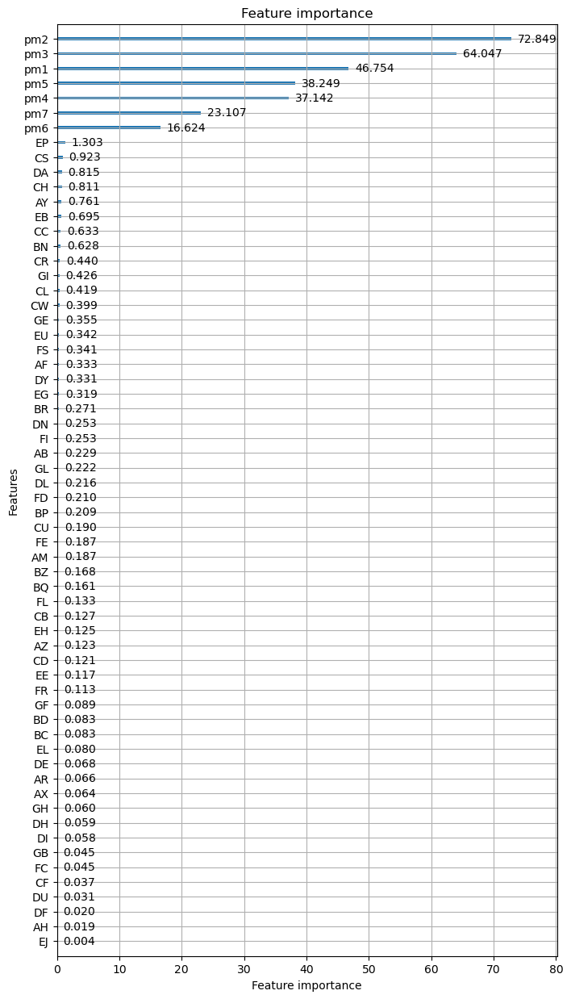

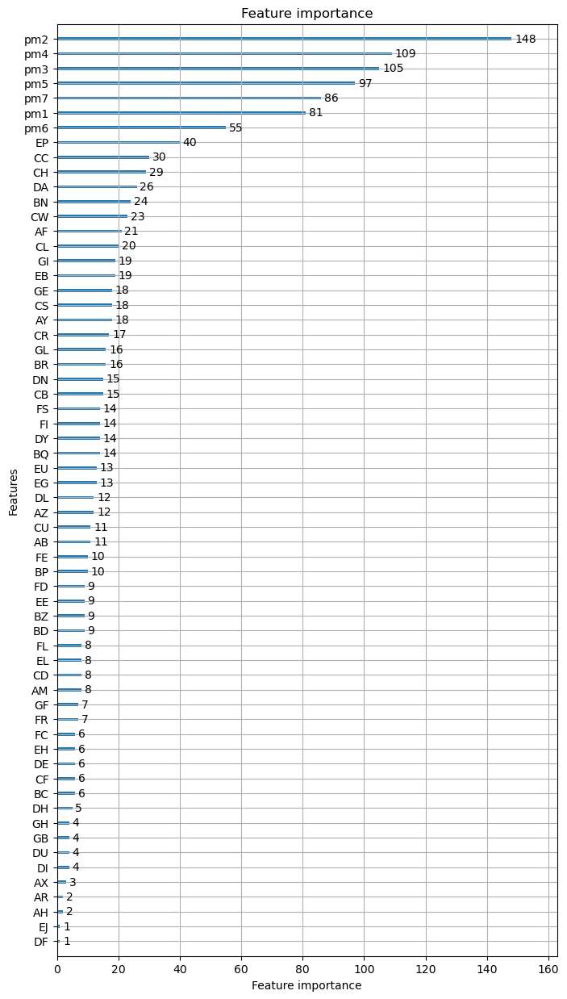

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.543838


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.396881
[300]	valid_0's balanced_logloss: 0.330443
[400]	valid_0's balanced_logloss: 0.296586
[500]	valid_0's balanced_logloss: 0.281749
[600]	valid_0's balanced_logloss: 0.274163
[700]	valid_0's balanced_logloss: 0.272637
[800]	valid_0's balanced_logloss: 0.271833
[900]	valid_0's balanced_logloss: 0.271848


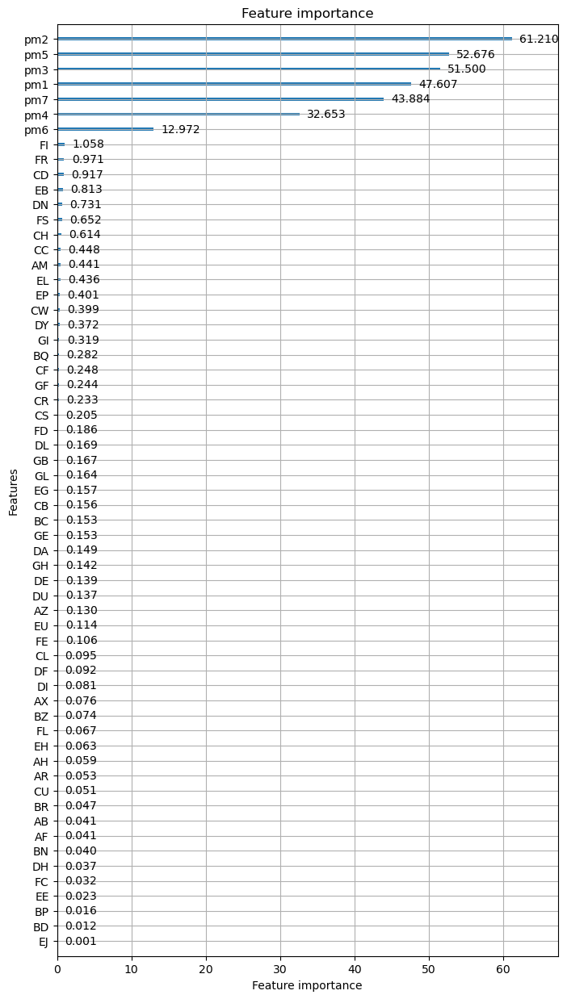

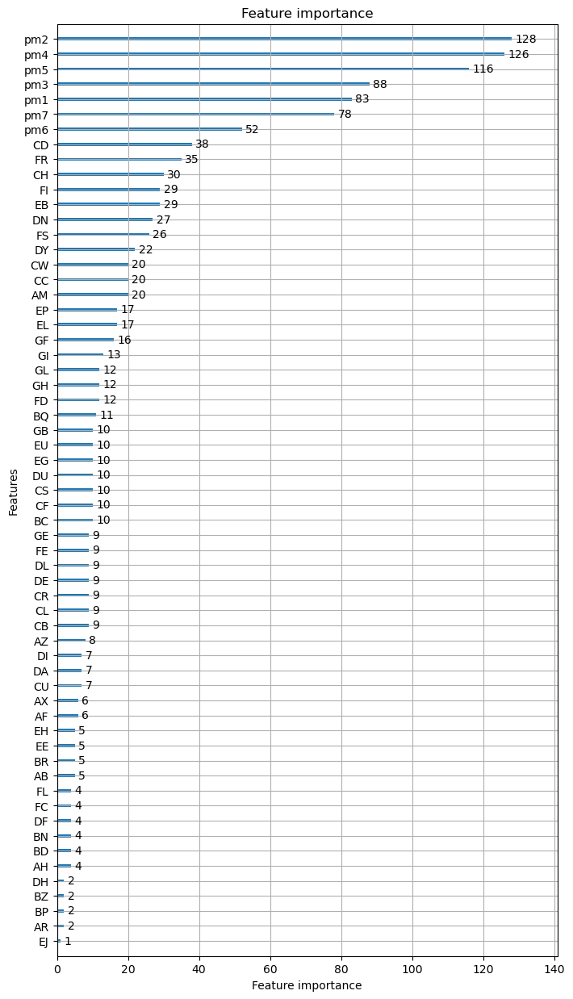

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.531749


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.366066
[300]	valid_0's balanced_logloss: 0.276476
[400]	valid_0's balanced_logloss: 0.21983
[500]	valid_0's balanced_logloss: 0.184682
[600]	valid_0's balanced_logloss: 0.162799
[700]	valid_0's balanced_logloss: 0.148858
[800]	valid_0's balanced_logloss: 0.140859
[900]	valid_0's balanced_logloss: 0.138389


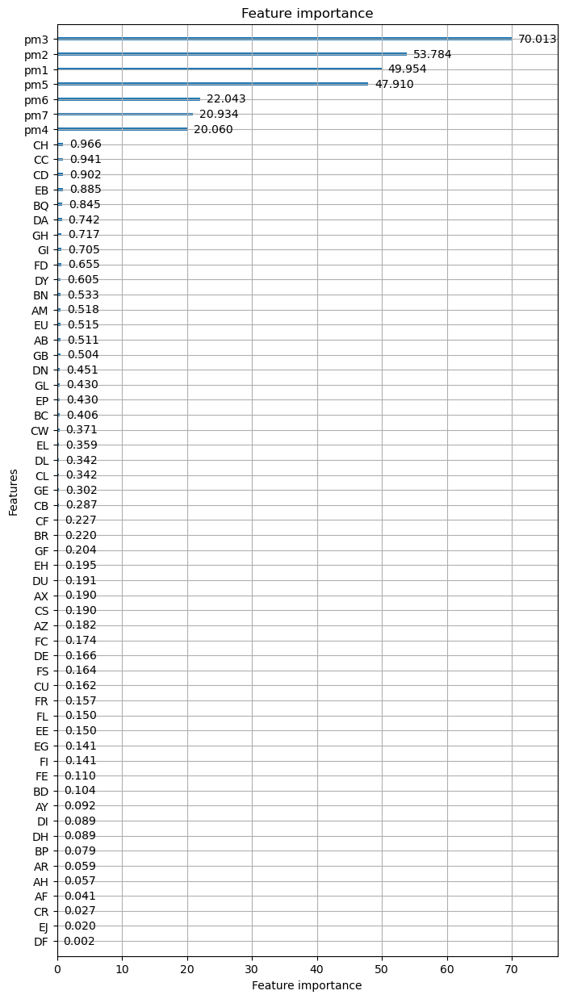

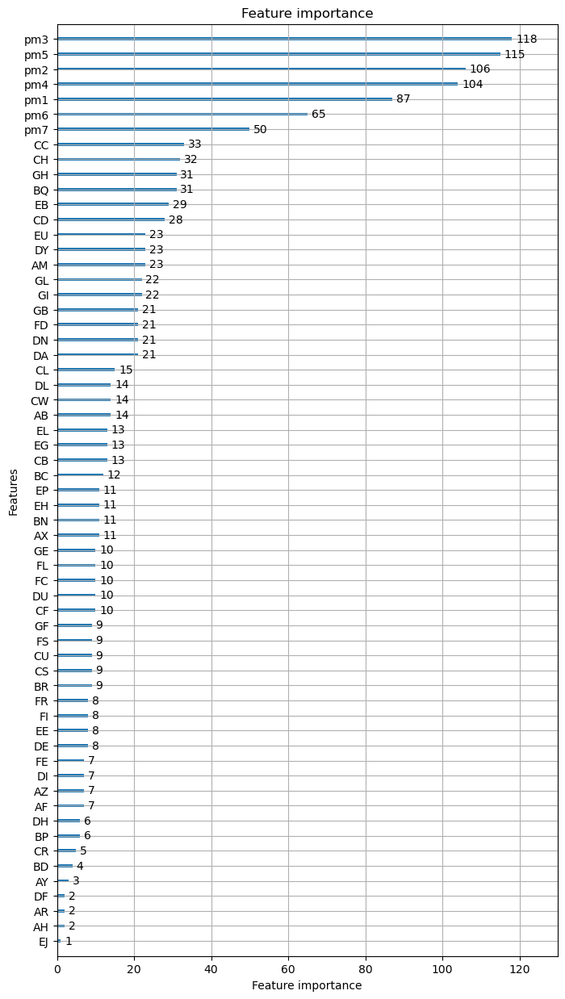

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.519782


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.355862
[300]	valid_0's balanced_logloss: 0.273552
[400]	valid_0's balanced_logloss: 0.223825
[500]	valid_0's balanced_logloss: 0.19692
[600]	valid_0's balanced_logloss: 0.181431
[700]	valid_0's balanced_logloss: 0.172621
[800]	valid_0's balanced_logloss: 0.165784
[900]	valid_0's balanced_logloss: 0.162908


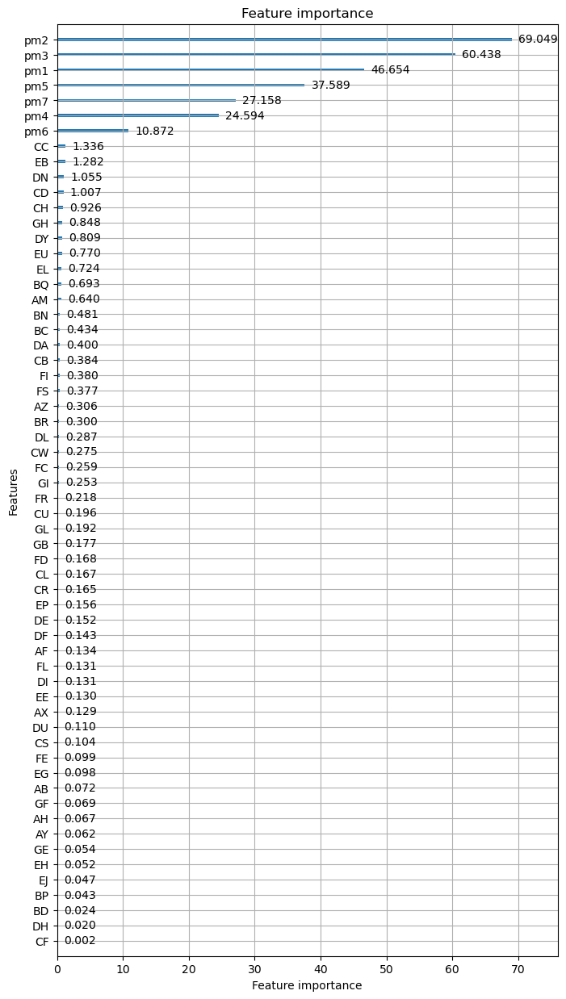

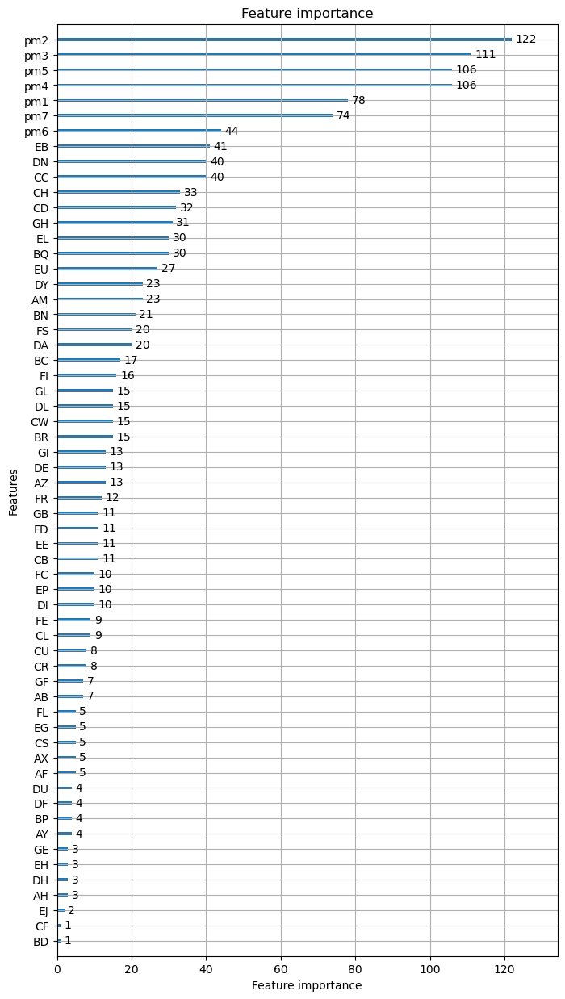

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.542869


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.381995
[300]	valid_0's balanced_logloss: 0.307463
[400]	valid_0's balanced_logloss: 0.262798
[500]	valid_0's balanced_logloss: 0.2385
[600]	valid_0's balanced_logloss: 0.225985
[700]	valid_0's balanced_logloss: 0.219853
[800]	valid_0's balanced_logloss: 0.217333
[900]	valid_0's balanced_logloss: 0.216822


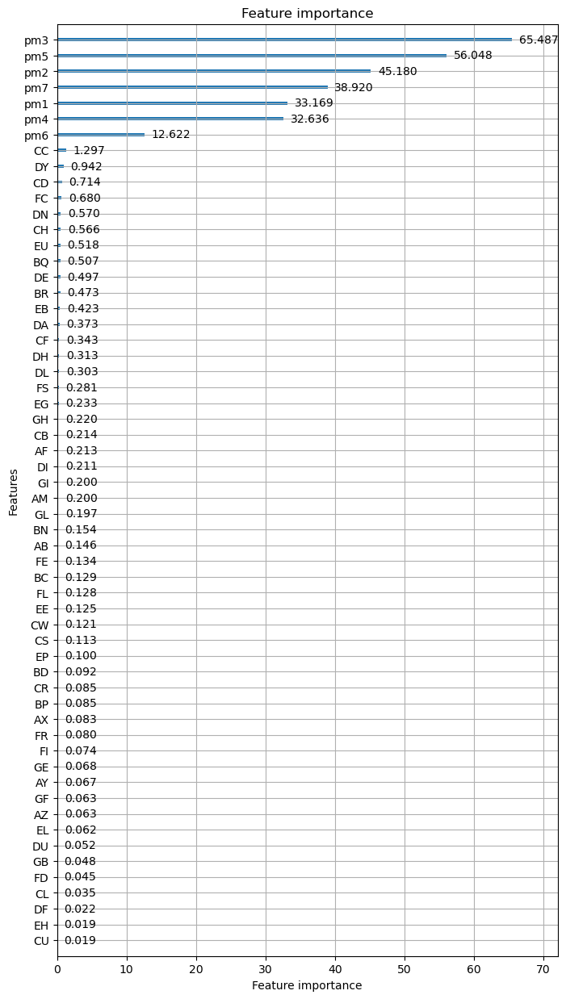

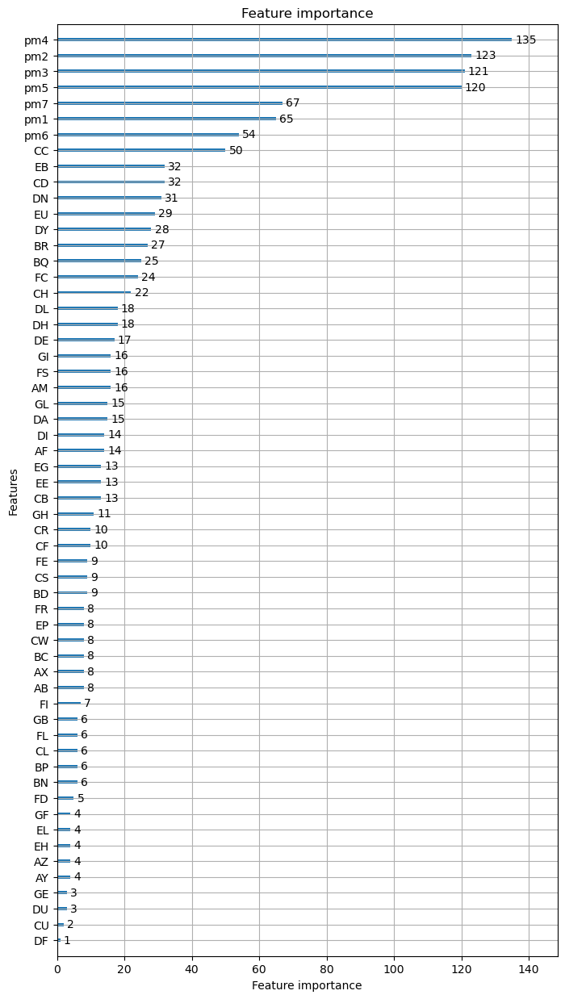

REPEAT NUMBER: 2/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.549291


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.387257
[300]	valid_0's balanced_logloss: 0.306876
[400]	valid_0's balanced_logloss: 0.25643
[500]	valid_0's balanced_logloss: 0.228911
[600]	valid_0's balanced_logloss: 0.214874
[700]	valid_0's balanced_logloss: 0.206847
[800]	valid_0's balanced_logloss: 0.202275
[900]	valid_0's balanced_logloss: 0.19829


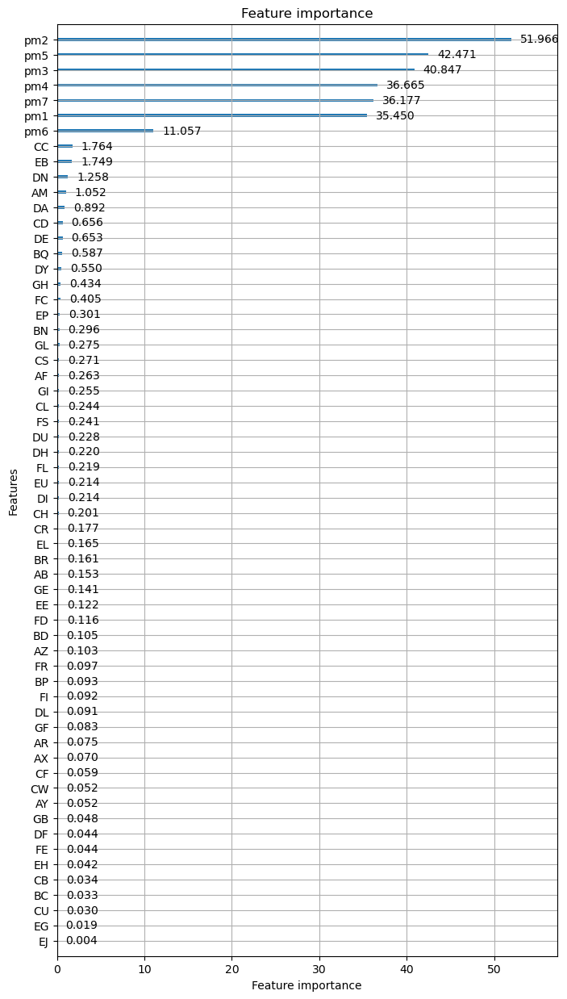

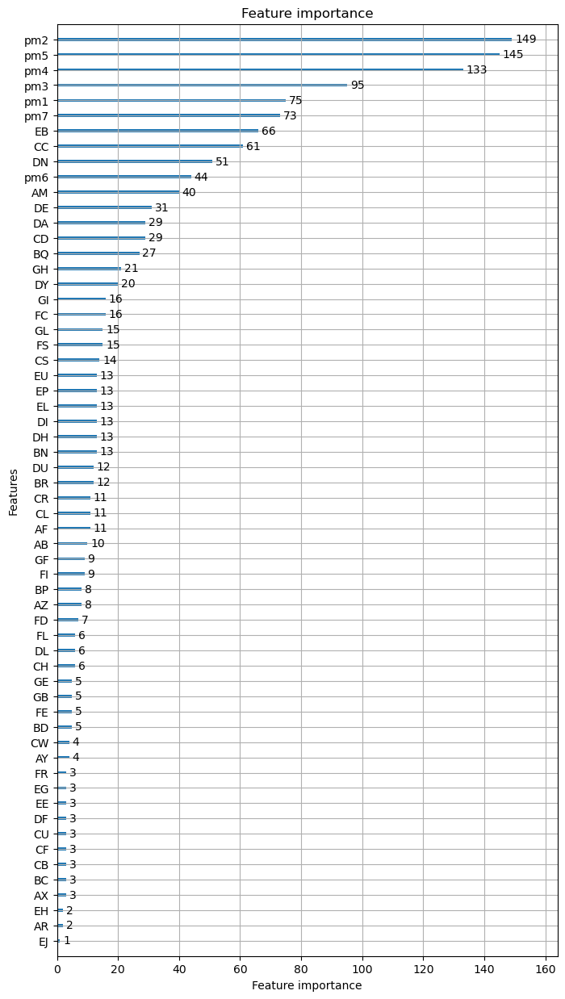

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.550413


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.382661
[300]	valid_0's balanced_logloss: 0.295476
[400]	valid_0's balanced_logloss: 0.238779
[500]	valid_0's balanced_logloss: 0.20774
[600]	valid_0's balanced_logloss: 0.189238
[700]	valid_0's balanced_logloss: 0.178135
[800]	valid_0's balanced_logloss: 0.172612
[900]	valid_0's balanced_logloss: 0.168985


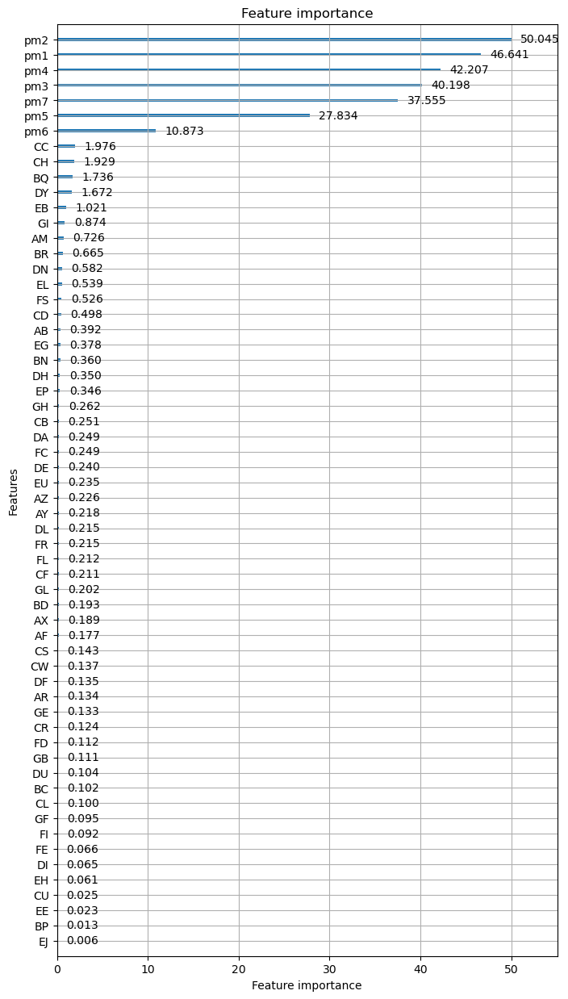

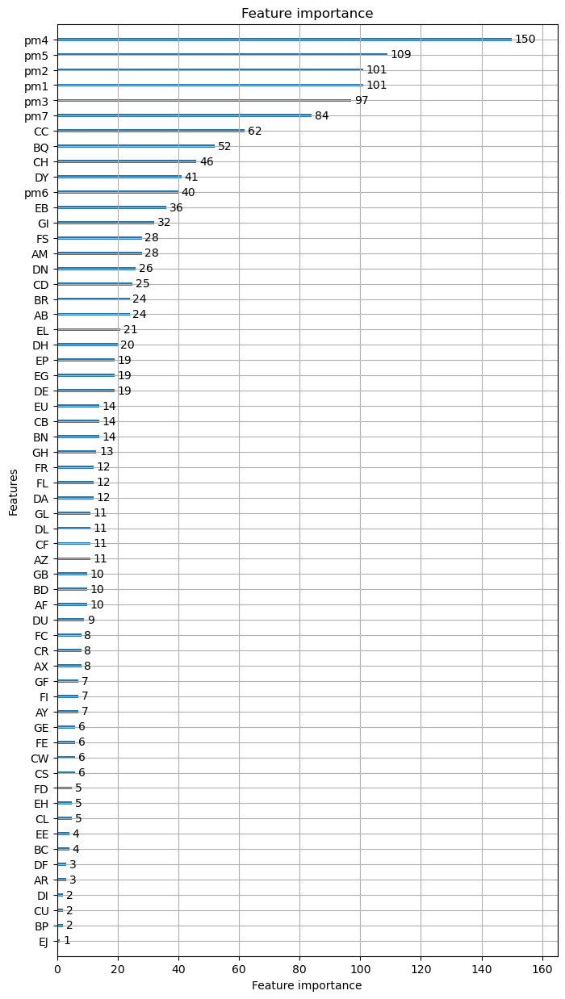

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.556141


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.403611
[300]	valid_0's balanced_logloss: 0.332895
[400]	valid_0's balanced_logloss: 0.289603
[500]	valid_0's balanced_logloss: 0.270707
[600]	valid_0's balanced_logloss: 0.261171
[700]	valid_0's balanced_logloss: 0.258807
[800]	valid_0's balanced_logloss: 0.258022
[900]	valid_0's balanced_logloss: 0.256836


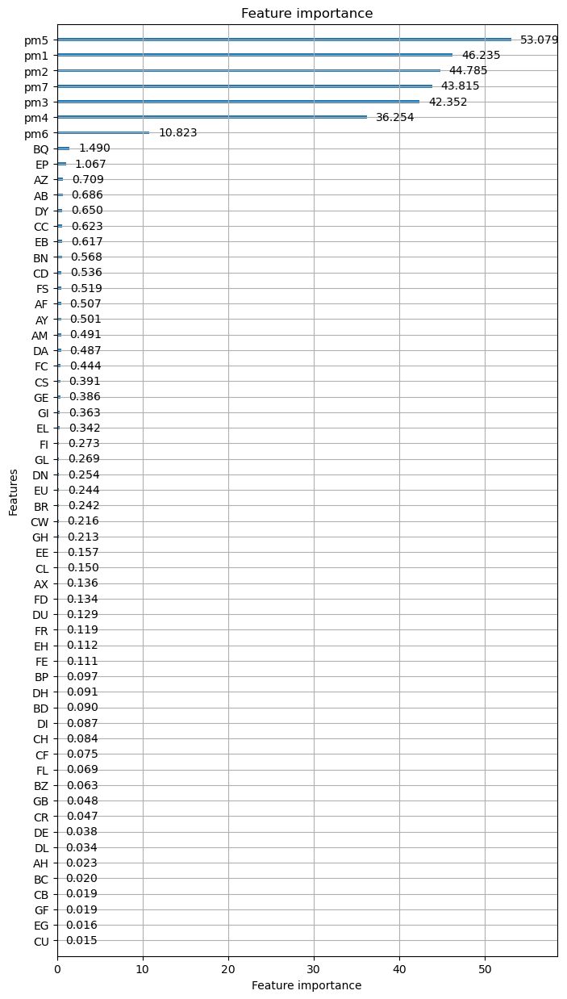

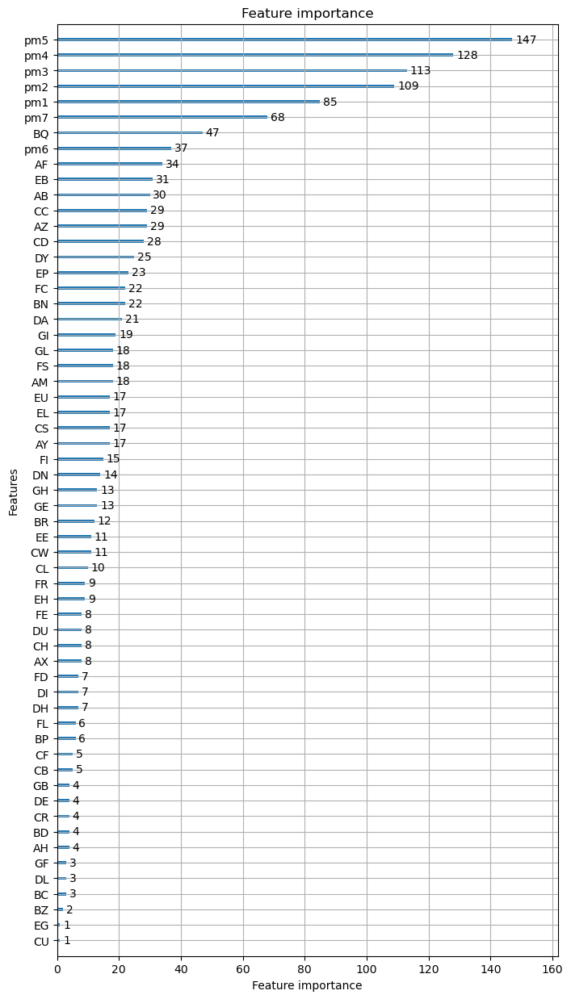

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.524073


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.356381
[300]	valid_0's balanced_logloss: 0.273556
[400]	valid_0's balanced_logloss: 0.224683
[500]	valid_0's balanced_logloss: 0.198245
[600]	valid_0's balanced_logloss: 0.184328
[700]	valid_0's balanced_logloss: 0.177684
[800]	valid_0's balanced_logloss: 0.175403
[900]	valid_0's balanced_logloss: 0.175581


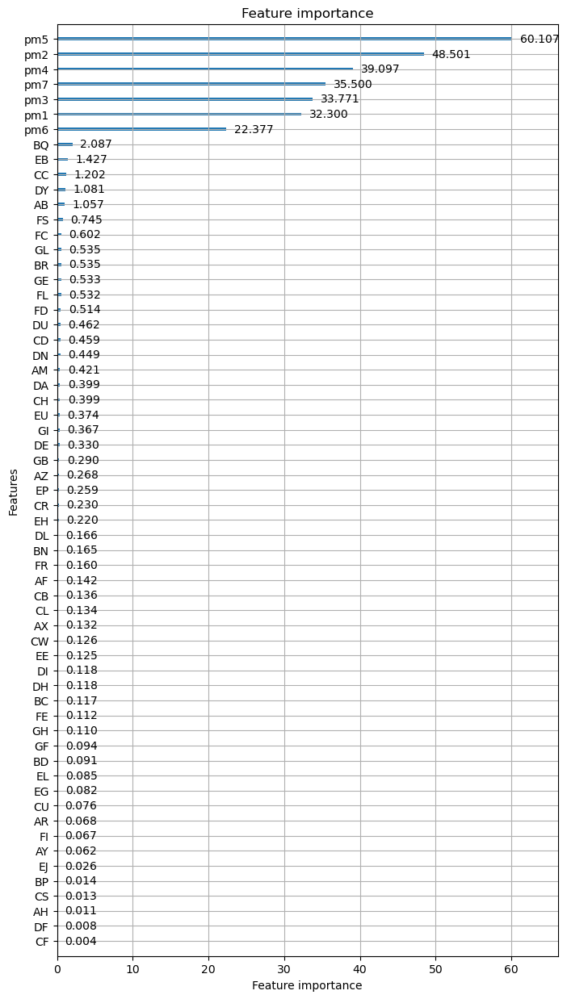

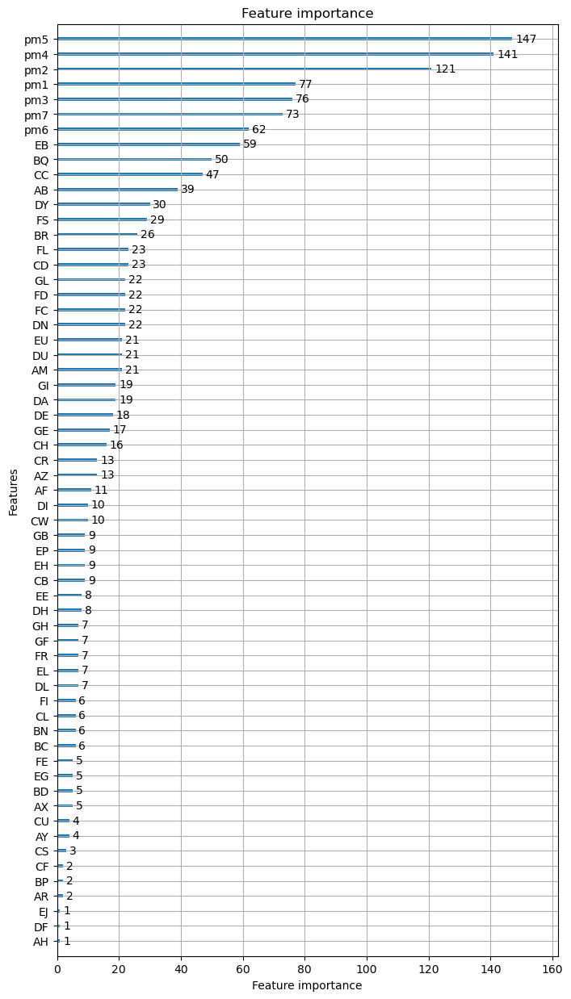

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.567822


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.42782
[300]	valid_0's balanced_logloss: 0.365228
[400]	valid_0's balanced_logloss: 0.332599
[500]	valid_0's balanced_logloss: 0.318595
[600]	valid_0's balanced_logloss: 0.313953
[700]	valid_0's balanced_logloss: 0.314465
[800]	valid_0's balanced_logloss: 0.316855
[900]	valid_0's balanced_logloss: 0.319232


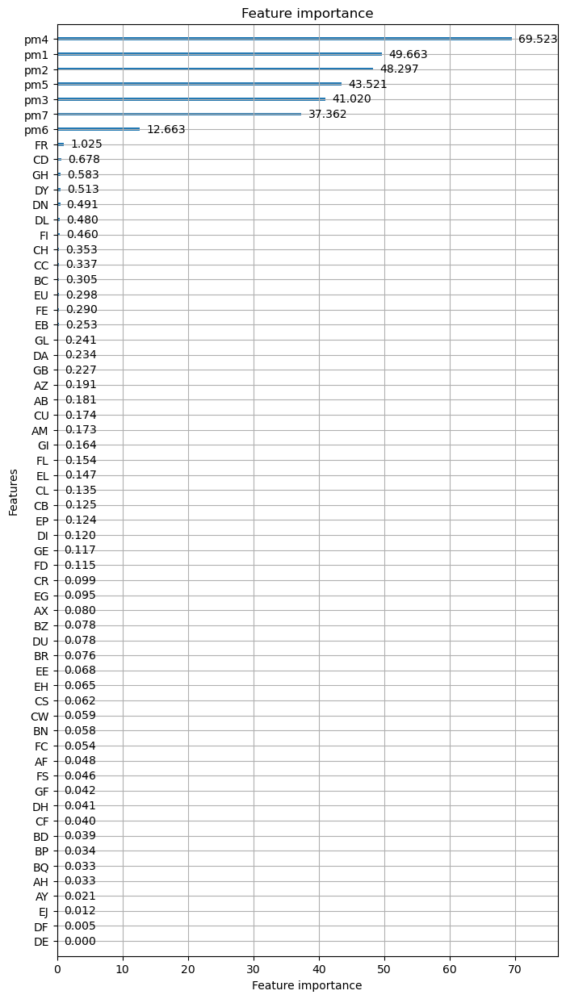

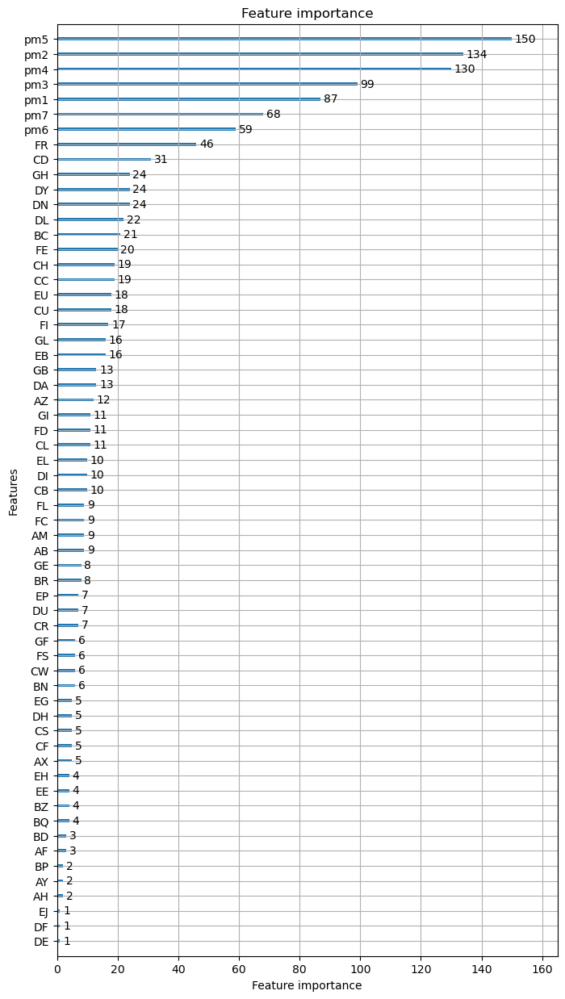

REPEAT NUMBER: 3/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.545186


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.384345
[300]	valid_0's balanced_logloss: 0.306841
[400]	valid_0's balanced_logloss: 0.262634
[500]	valid_0's balanced_logloss: 0.24037
[600]	valid_0's balanced_logloss: 0.229115
[700]	valid_0's balanced_logloss: 0.225201
[800]	valid_0's balanced_logloss: 0.223654
[900]	valid_0's balanced_logloss: 0.222143


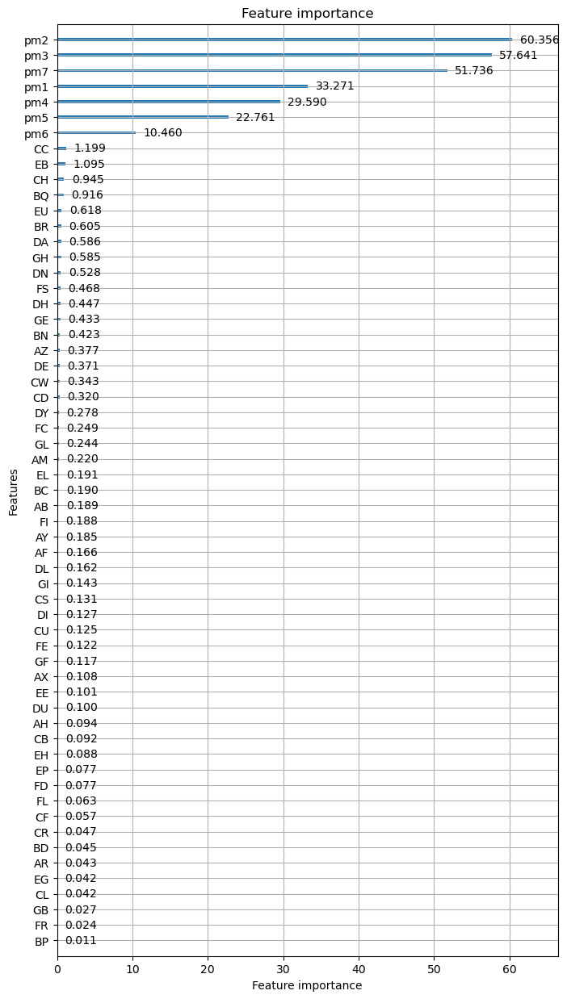

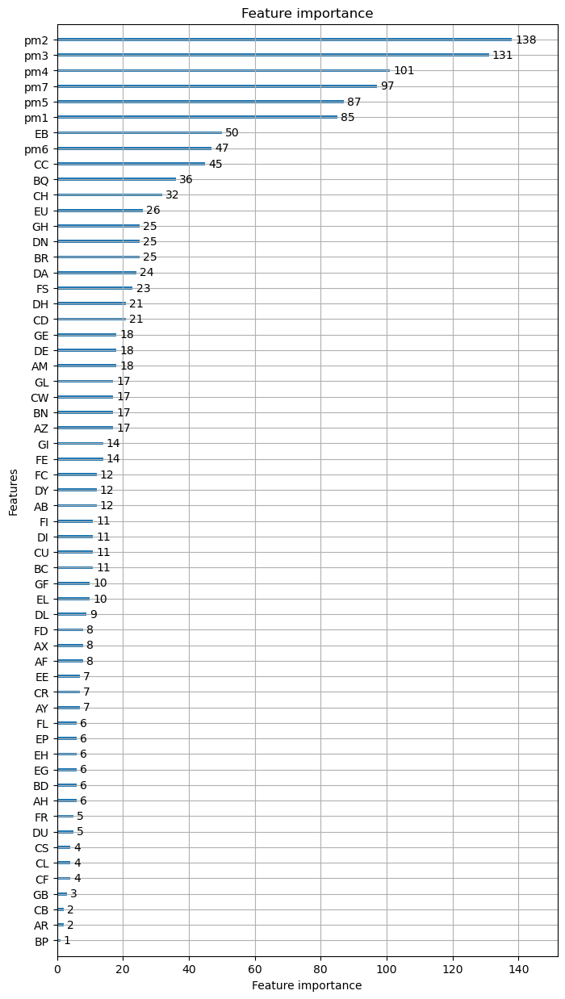

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.572518


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.416317
[300]	valid_0's balanced_logloss: 0.337899
[400]	valid_0's balanced_logloss: 0.291145
[500]	valid_0's balanced_logloss: 0.264743
[600]	valid_0's balanced_logloss: 0.25092
[700]	valid_0's balanced_logloss: 0.244923
[800]	valid_0's balanced_logloss: 0.241252
[900]	valid_0's balanced_logloss: 0.241413


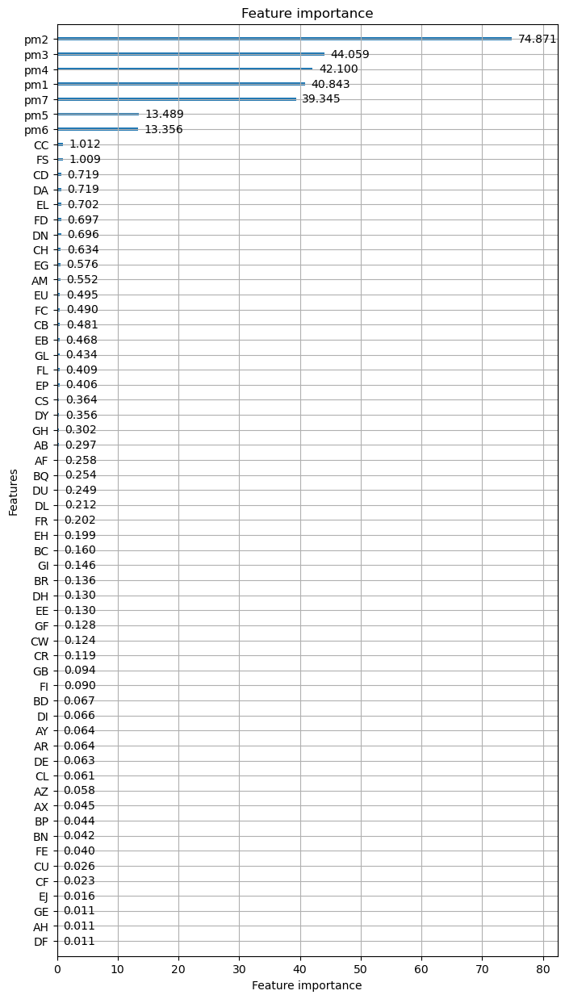

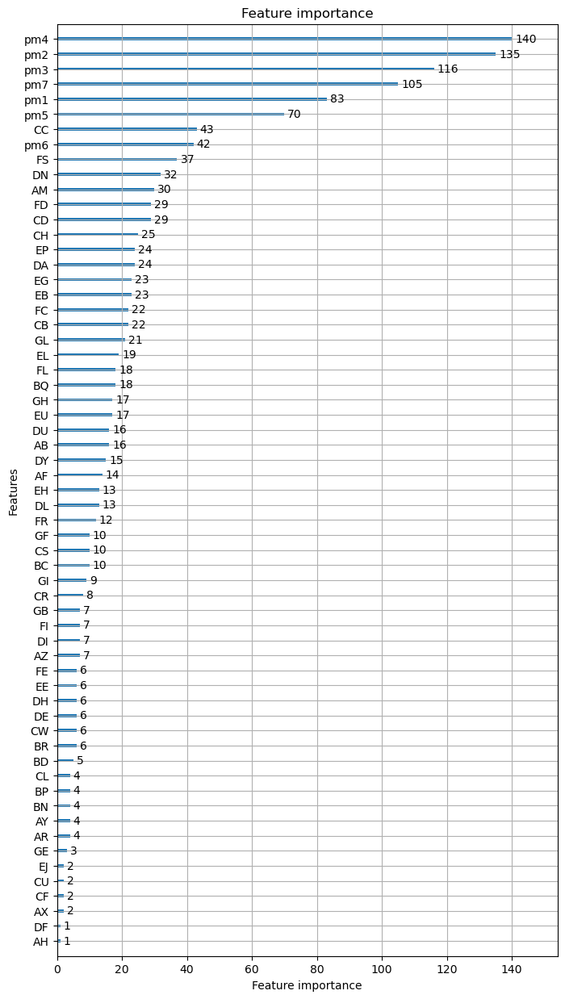

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.536046


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.374037
[300]	valid_0's balanced_logloss: 0.295752
[400]	valid_0's balanced_logloss: 0.247845
[500]	valid_0's balanced_logloss: 0.223281
[600]	valid_0's balanced_logloss: 0.208699
[700]	valid_0's balanced_logloss: 0.200343
[800]	valid_0's balanced_logloss: 0.196253
[900]	valid_0's balanced_logloss: 0.192526


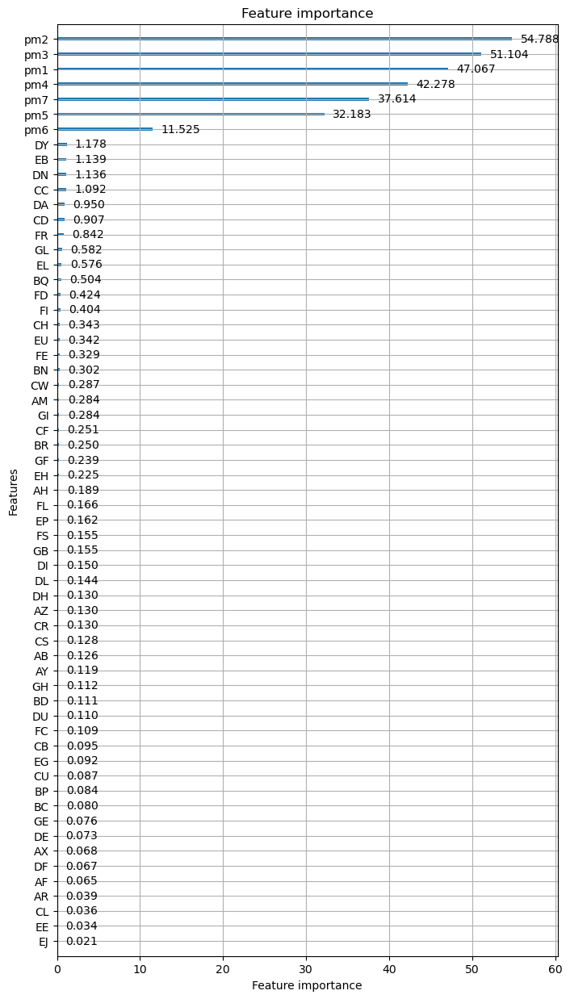

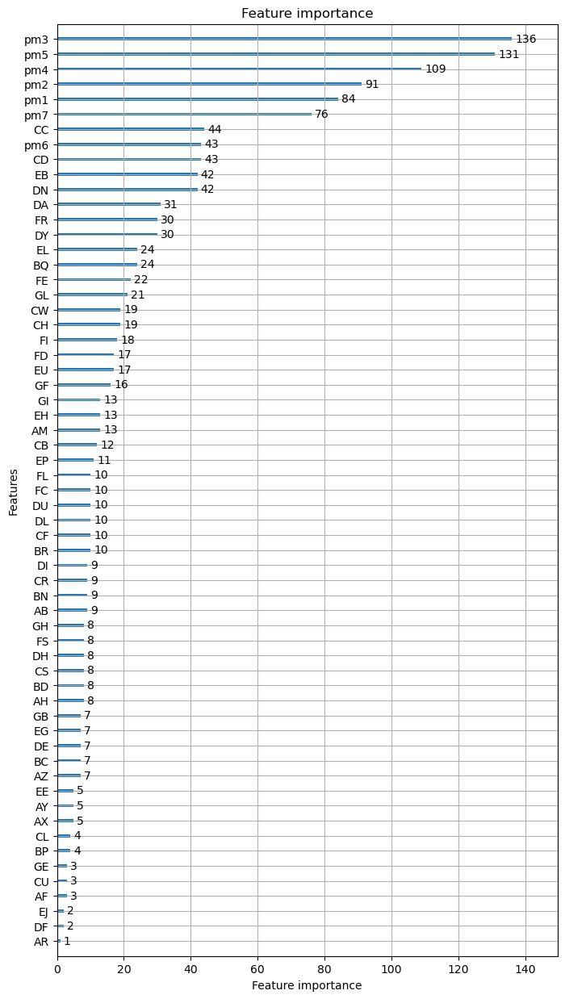

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.537556


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.375897
[300]	valid_0's balanced_logloss: 0.298842
[400]	valid_0's balanced_logloss: 0.249402
[500]	valid_0's balanced_logloss: 0.220062
[600]	valid_0's balanced_logloss: 0.200768
[700]	valid_0's balanced_logloss: 0.187762
[800]	valid_0's balanced_logloss: 0.179413
[900]	valid_0's balanced_logloss: 0.174385


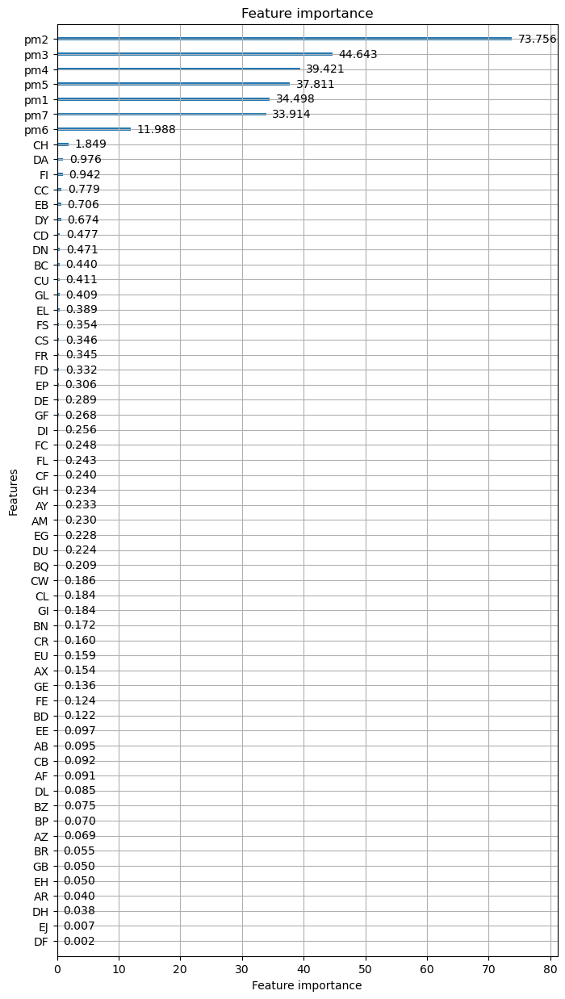

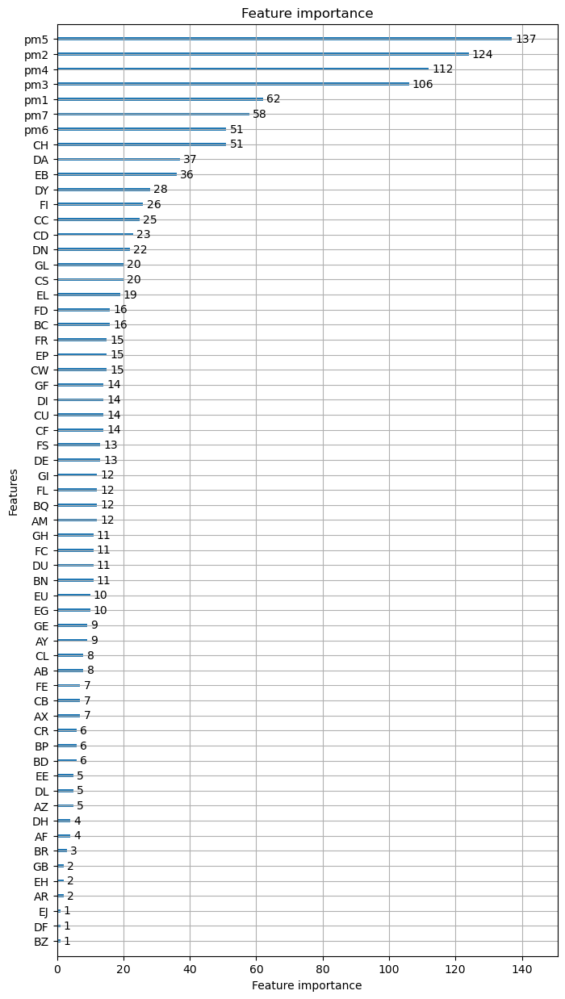

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.545049


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.391922
[300]	valid_0's balanced_logloss: 0.322384
[400]	valid_0's balanced_logloss: 0.282387
[500]	valid_0's balanced_logloss: 0.263627
[600]	valid_0's balanced_logloss: 0.255652
[700]	valid_0's balanced_logloss: 0.251734
[800]	valid_0's balanced_logloss: 0.252737
[900]	valid_0's balanced_logloss: 0.251829


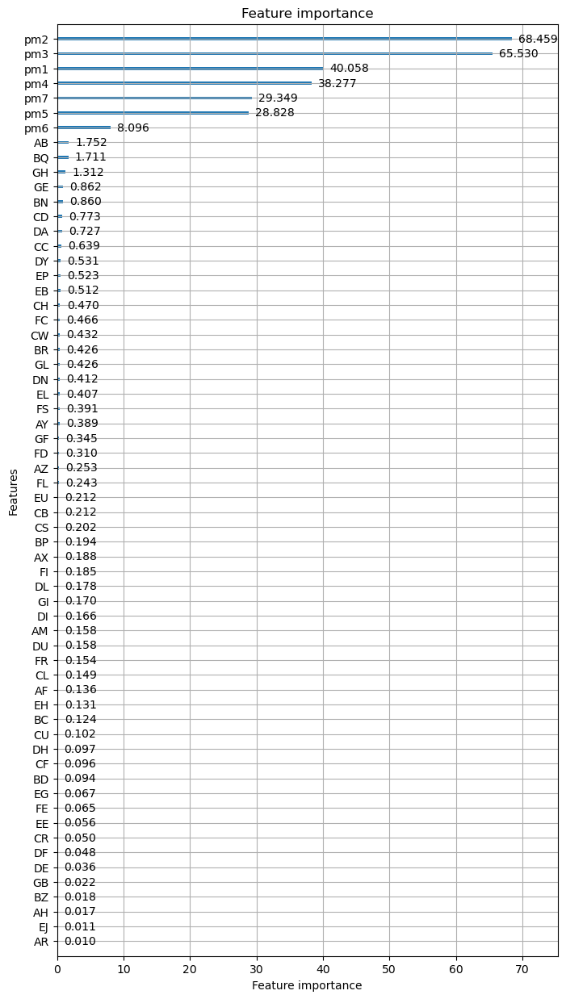

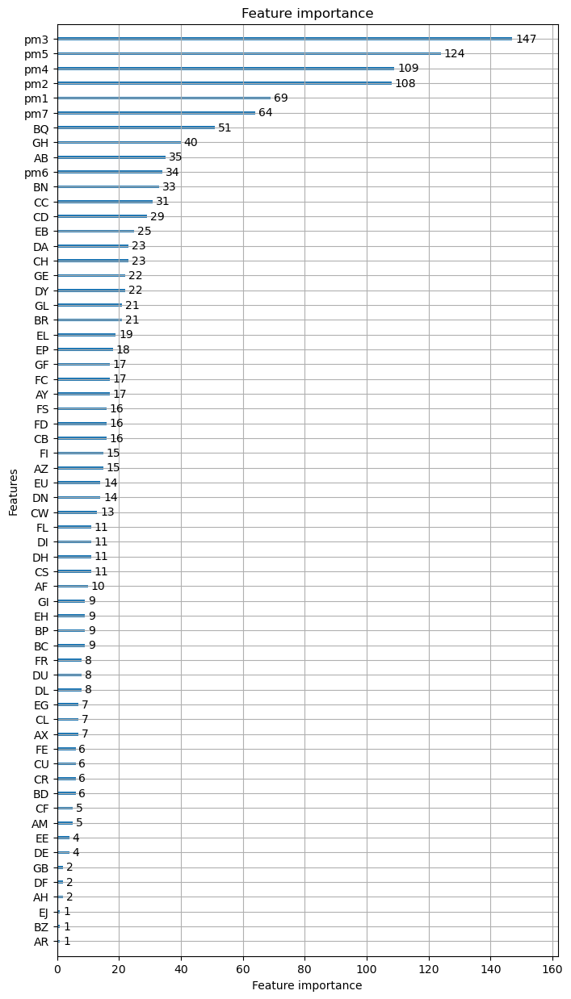

REPEAT NUMBER: 4/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.532737


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.375139
[300]	valid_0's balanced_logloss: 0.300688
[400]	valid_0's balanced_logloss: 0.257702
[500]	valid_0's balanced_logloss: 0.233839
[600]	valid_0's balanced_logloss: 0.219463
[700]	valid_0's balanced_logloss: 0.211276
[800]	valid_0's balanced_logloss: 0.206715
[900]	valid_0's balanced_logloss: 0.202895


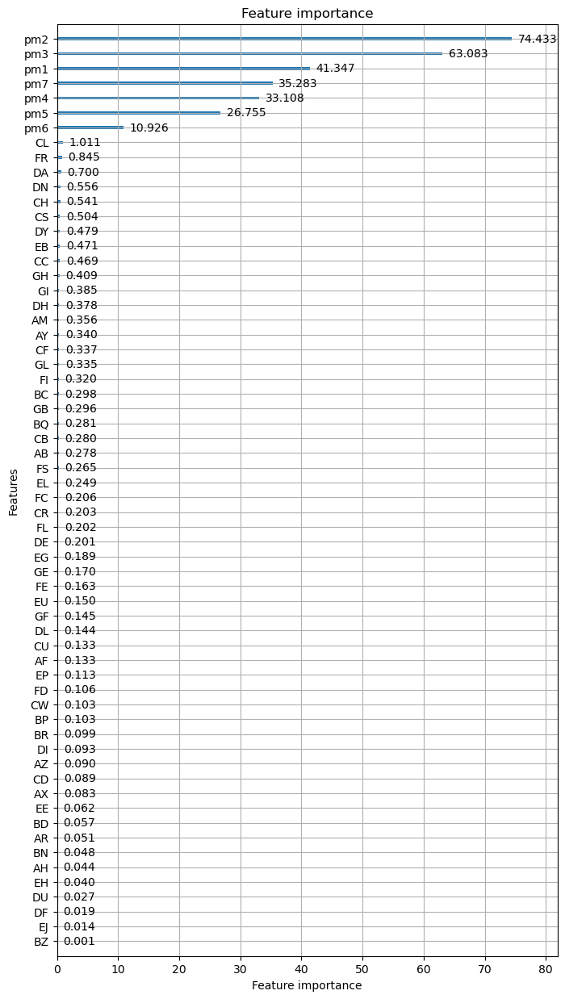

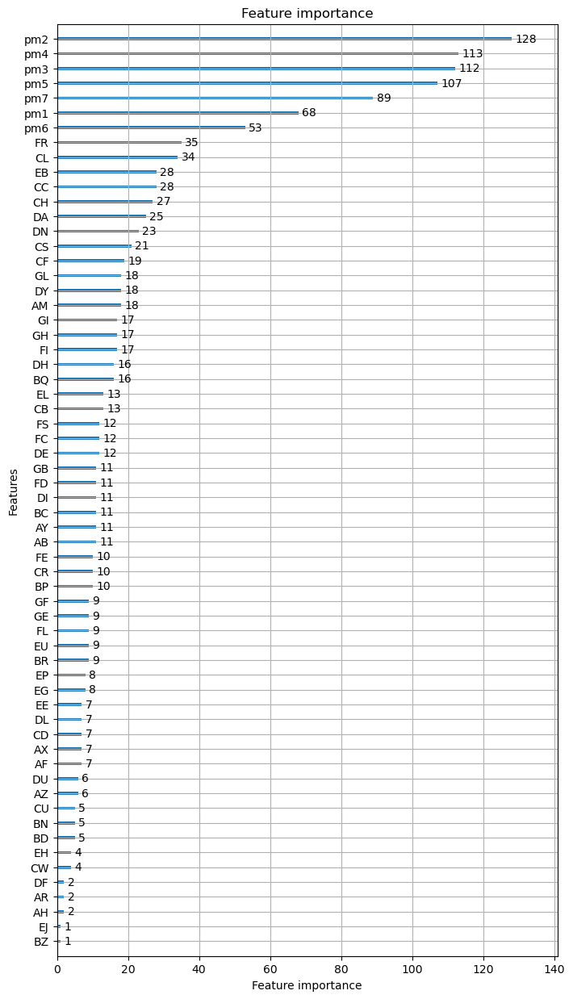

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.590314


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.431082
[300]	valid_0's balanced_logloss: 0.345918
[400]	valid_0's balanced_logloss: 0.287664
[500]	valid_0's balanced_logloss: 0.257433
[600]	valid_0's balanced_logloss: 0.237176
[700]	valid_0's balanced_logloss: 0.225676
[800]	valid_0's balanced_logloss: 0.218696
[900]	valid_0's balanced_logloss: 0.216227


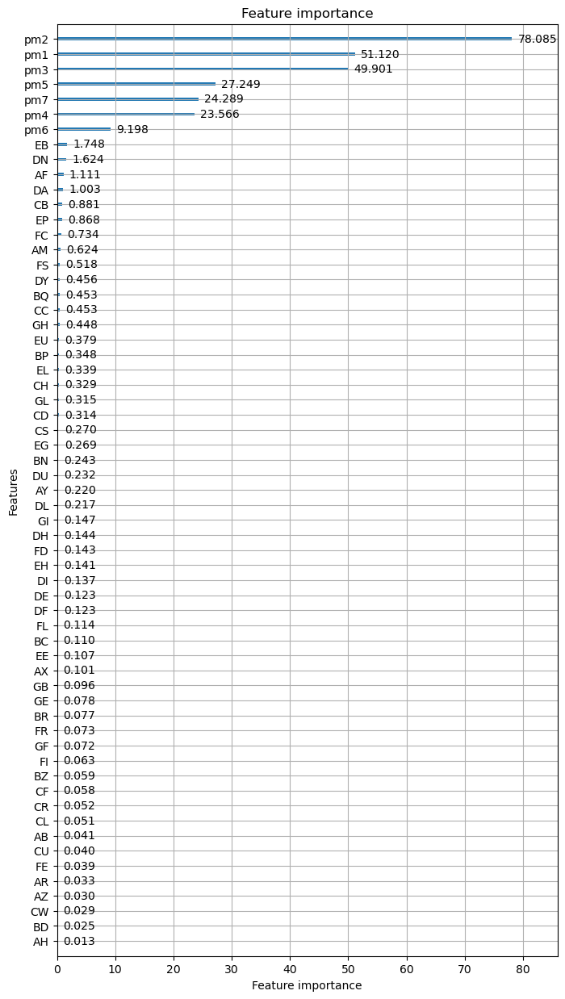

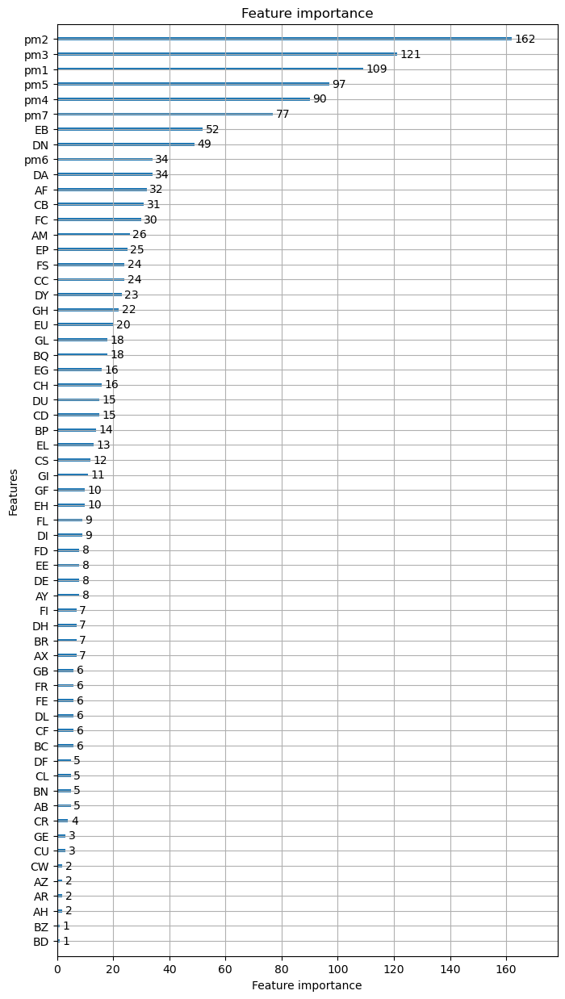

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.558853


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.414155
[300]	valid_0's balanced_logloss: 0.349787
[400]	valid_0's balanced_logloss: 0.315709
[500]	valid_0's balanced_logloss: 0.302272
[600]	valid_0's balanced_logloss: 0.296961
[700]	valid_0's balanced_logloss: 0.296344
[800]	valid_0's balanced_logloss: 0.299309
[900]	valid_0's balanced_logloss: 0.303363


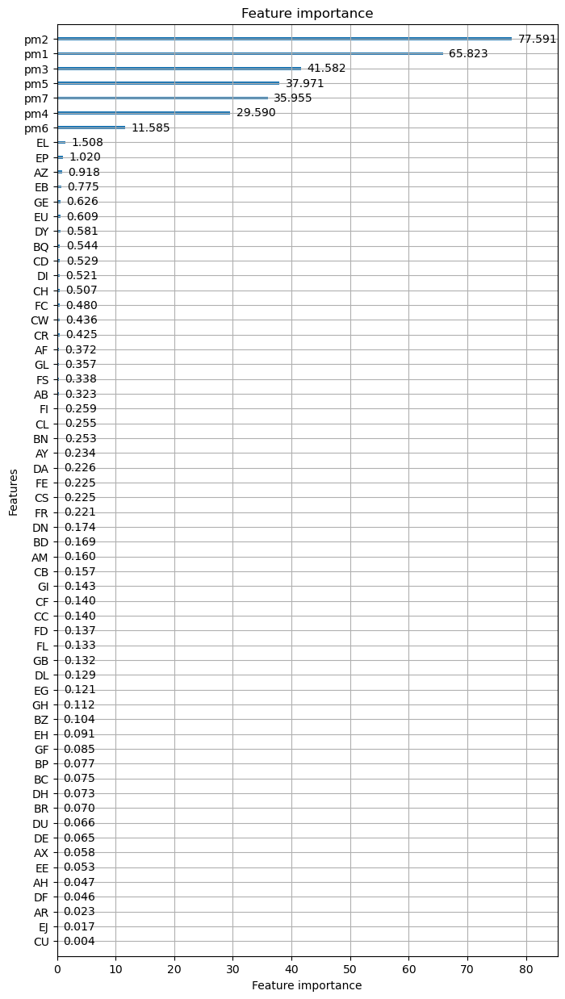

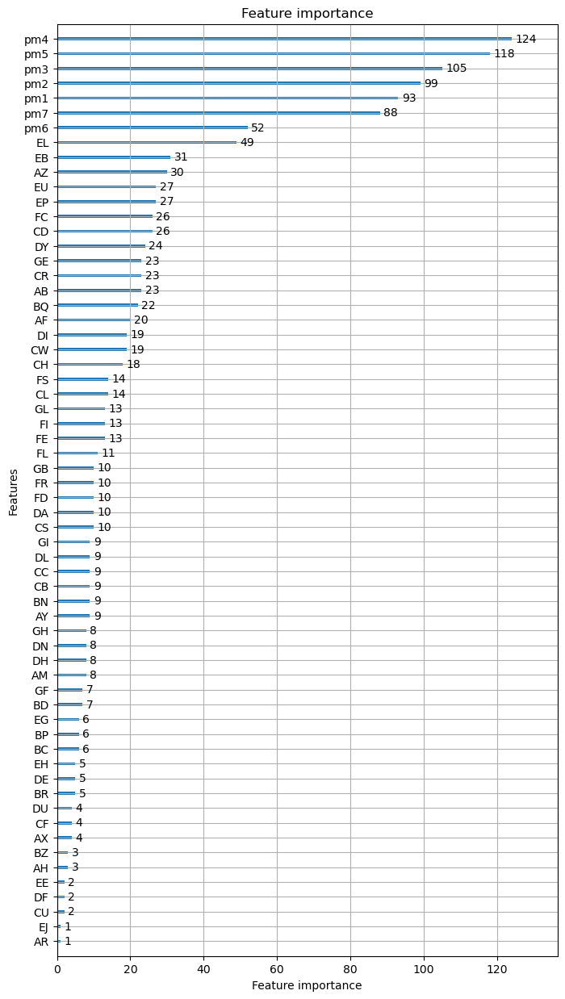

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.522211


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.364517
[300]	valid_0's balanced_logloss: 0.28918
[400]	valid_0's balanced_logloss: 0.249277
[500]	valid_0's balanced_logloss: 0.228852
[600]	valid_0's balanced_logloss: 0.216457
[700]	valid_0's balanced_logloss: 0.208858
[800]	valid_0's balanced_logloss: 0.206011
[900]	valid_0's balanced_logloss: 0.205568


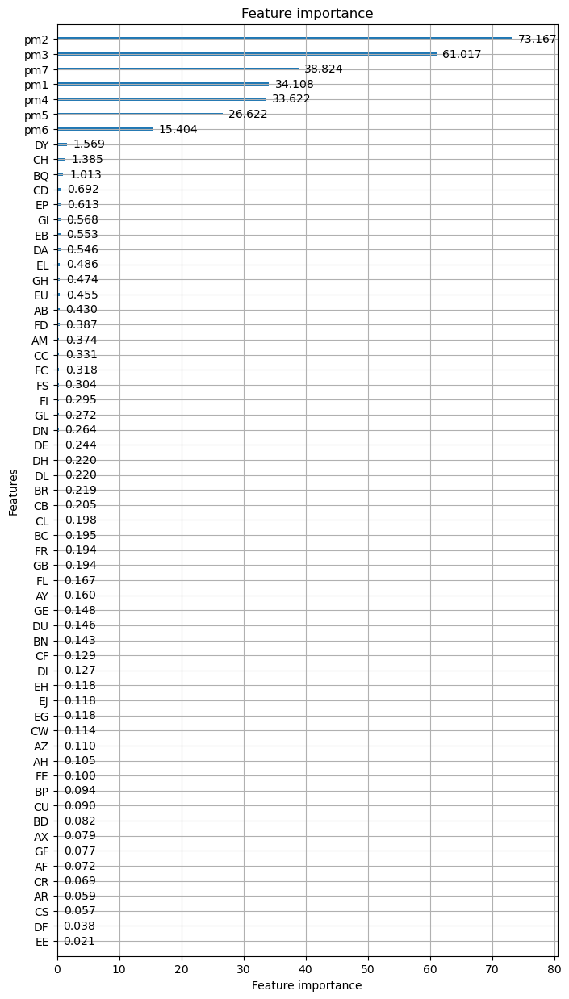

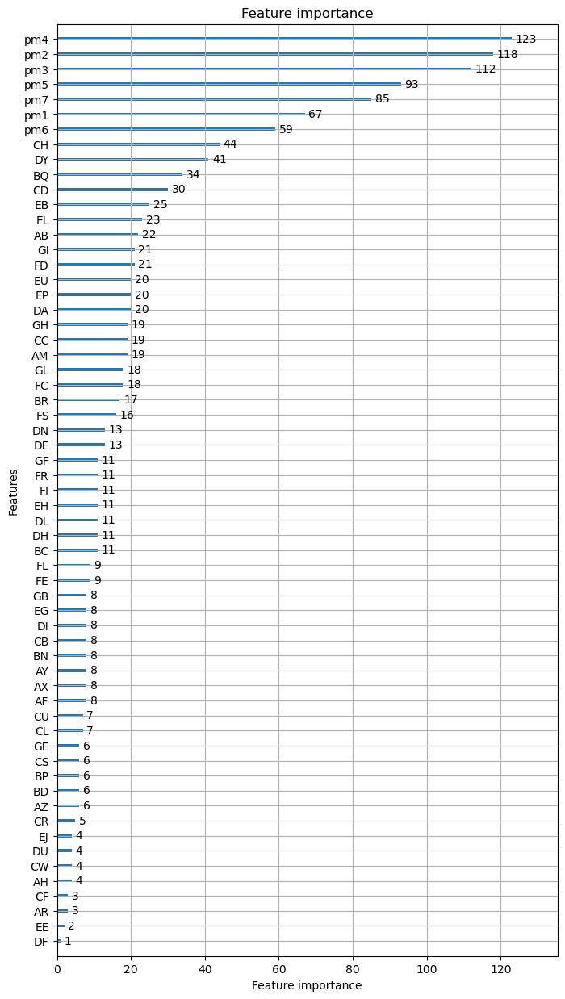

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.538258


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.373945
[300]	valid_0's balanced_logloss: 0.290154
[400]	valid_0's balanced_logloss: 0.238171
[500]	valid_0's balanced_logloss: 0.210592
[600]	valid_0's balanced_logloss: 0.194464
[700]	valid_0's balanced_logloss: 0.185885
[800]	valid_0's balanced_logloss: 0.180172
[900]	valid_0's balanced_logloss: 0.177375


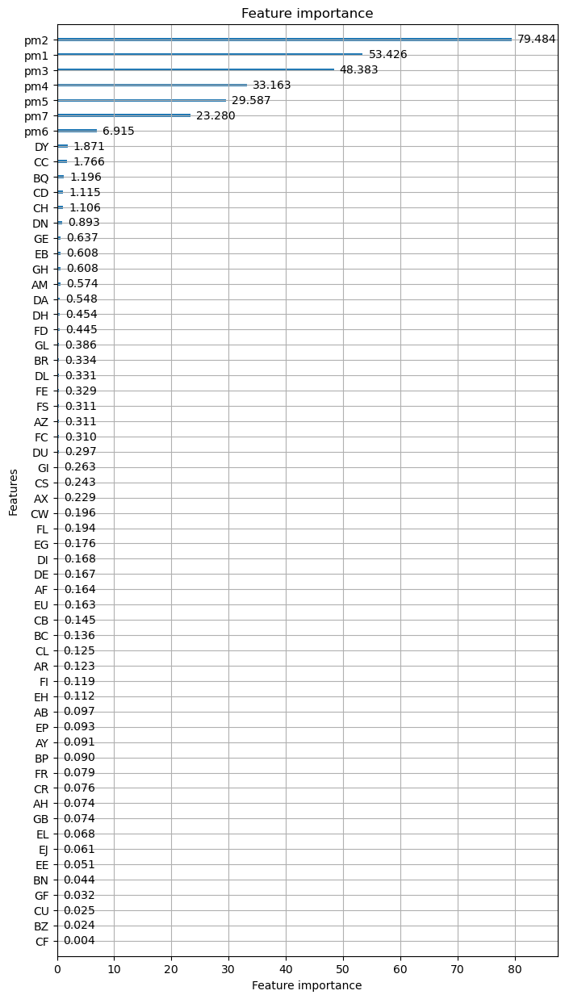

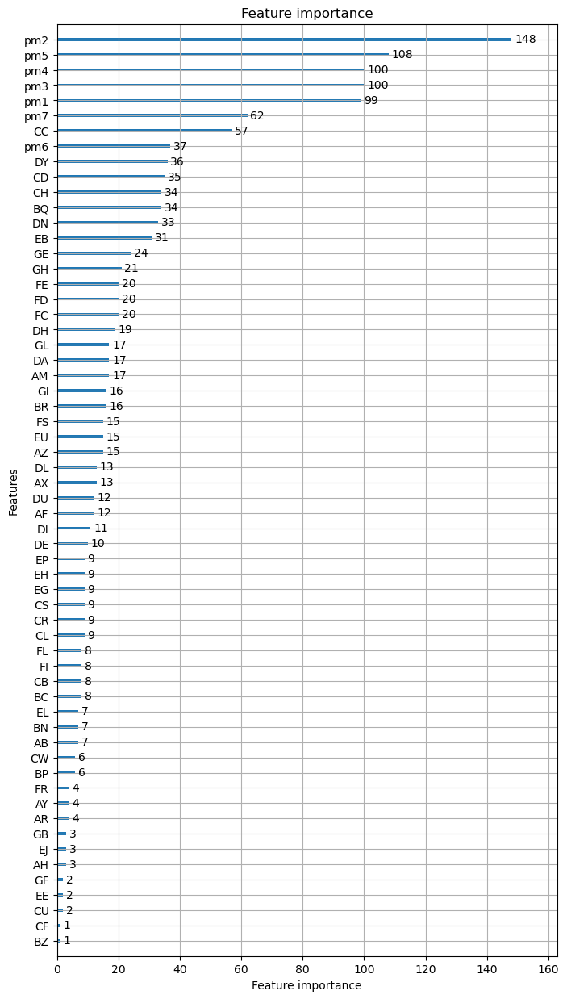

REPEAT NUMBER: 5/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.538673


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.386555
[300]	valid_0's balanced_logloss: 0.313589
[400]	valid_0's balanced_logloss: 0.27314
[500]	valid_0's balanced_logloss: 0.253327
[600]	valid_0's balanced_logloss: 0.24359
[700]	valid_0's balanced_logloss: 0.238196
[800]	valid_0's balanced_logloss: 0.234933
[900]	valid_0's balanced_logloss: 0.234962


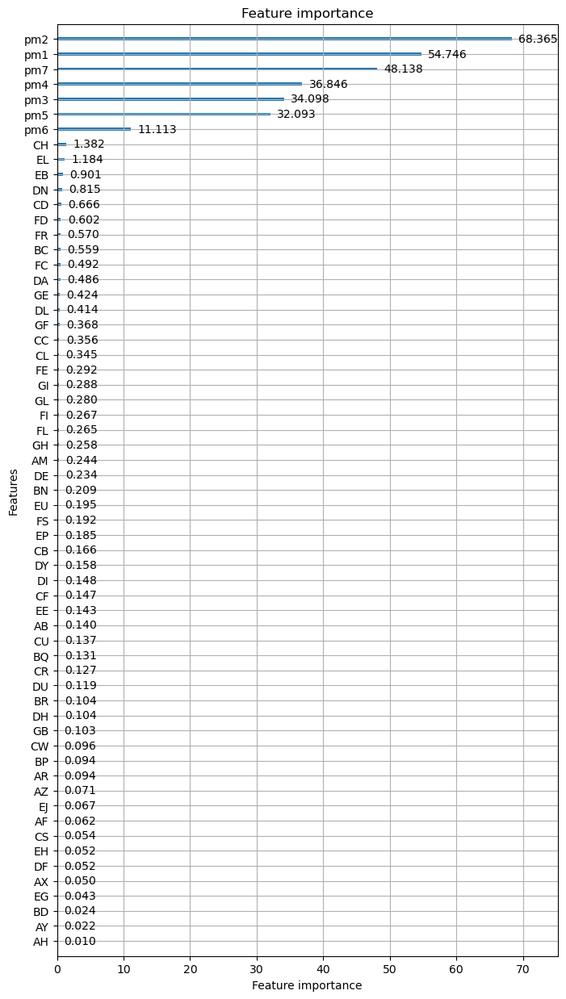

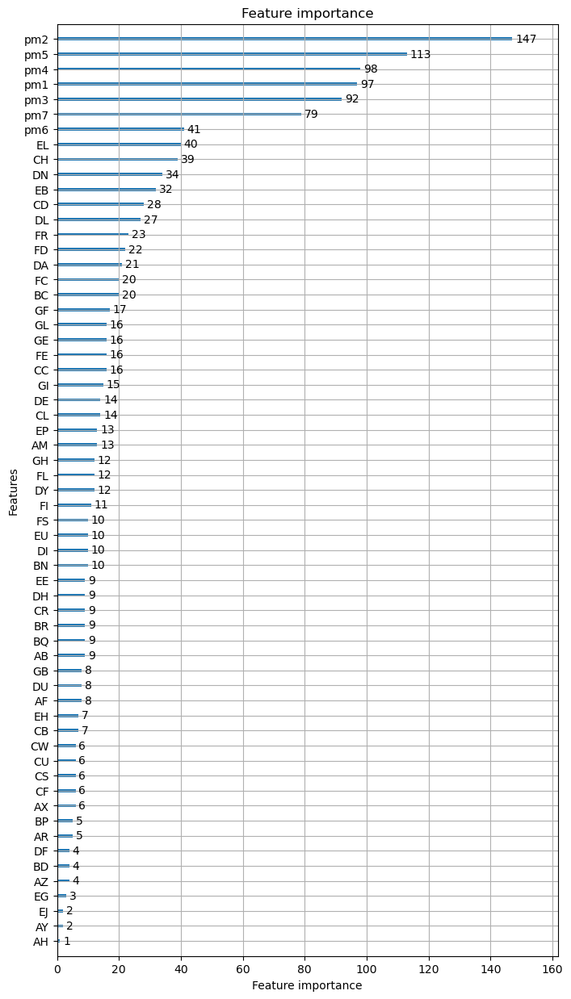

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.525678


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.357989
[300]	valid_0's balanced_logloss: 0.275906
[400]	valid_0's balanced_logloss: 0.225704
[500]	valid_0's balanced_logloss: 0.20047
[600]	valid_0's balanced_logloss: 0.186488
[700]	valid_0's balanced_logloss: 0.17854
[800]	valid_0's balanced_logloss: 0.173163
[900]	valid_0's balanced_logloss: 0.170767


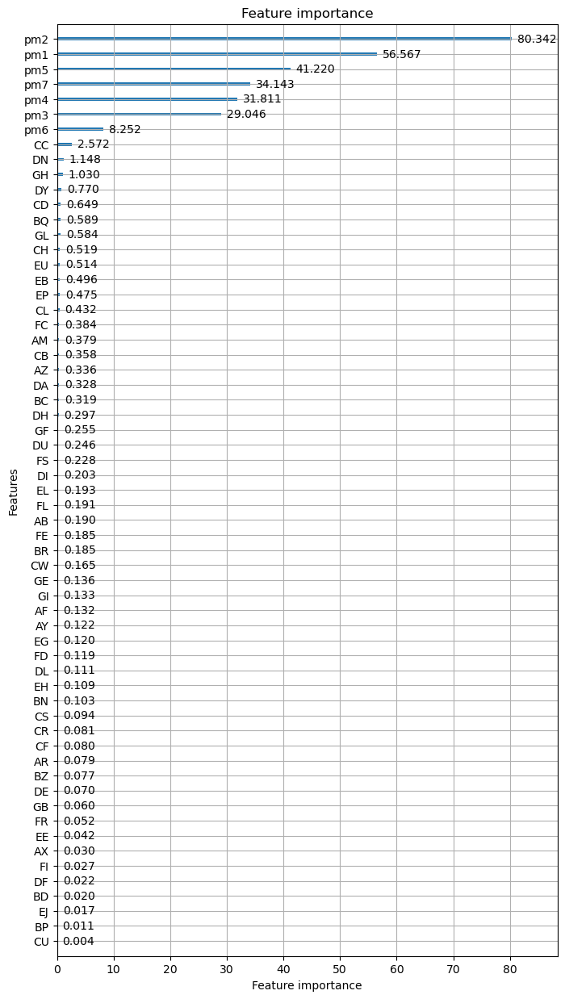

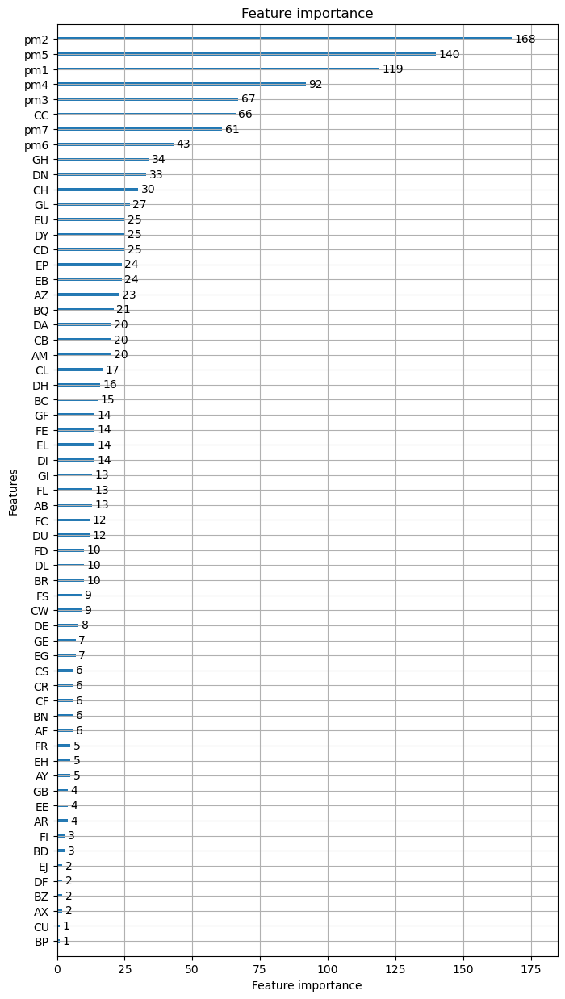

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.54091


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.375704
[300]	valid_0's balanced_logloss: 0.290869
[400]	valid_0's balanced_logloss: 0.242089
[500]	valid_0's balanced_logloss: 0.217055
[600]	valid_0's balanced_logloss: 0.205734
[700]	valid_0's balanced_logloss: 0.199802
[800]	valid_0's balanced_logloss: 0.195112
[900]	valid_0's balanced_logloss: 0.195042


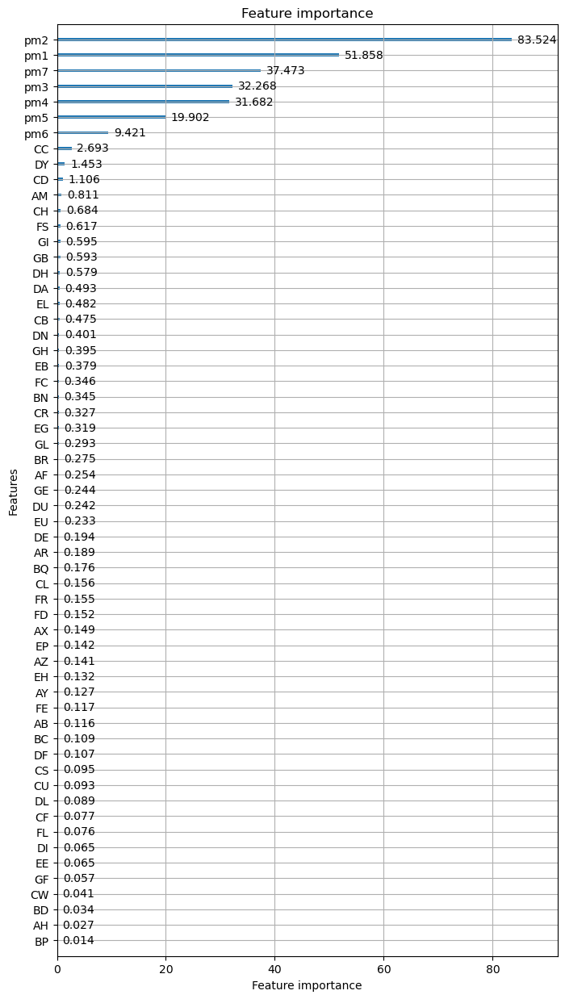

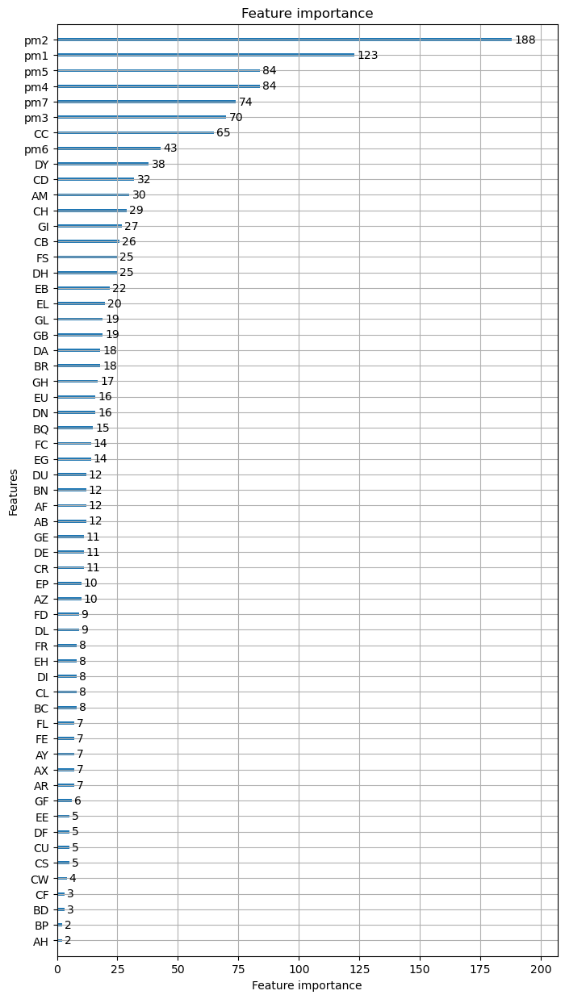

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.517662


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.35423
[300]	valid_0's balanced_logloss: 0.270415
[400]	valid_0's balanced_logloss: 0.218162
[500]	valid_0's balanced_logloss: 0.19075
[600]	valid_0's balanced_logloss: 0.174779
[700]	valid_0's balanced_logloss: 0.166451
[800]	valid_0's balanced_logloss: 0.160048
[900]	valid_0's balanced_logloss: 0.155857


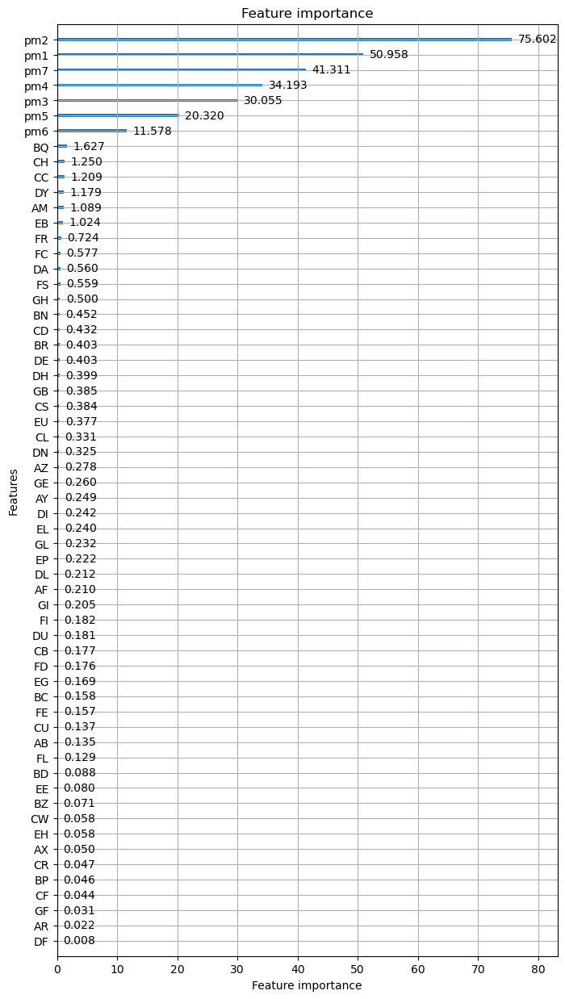

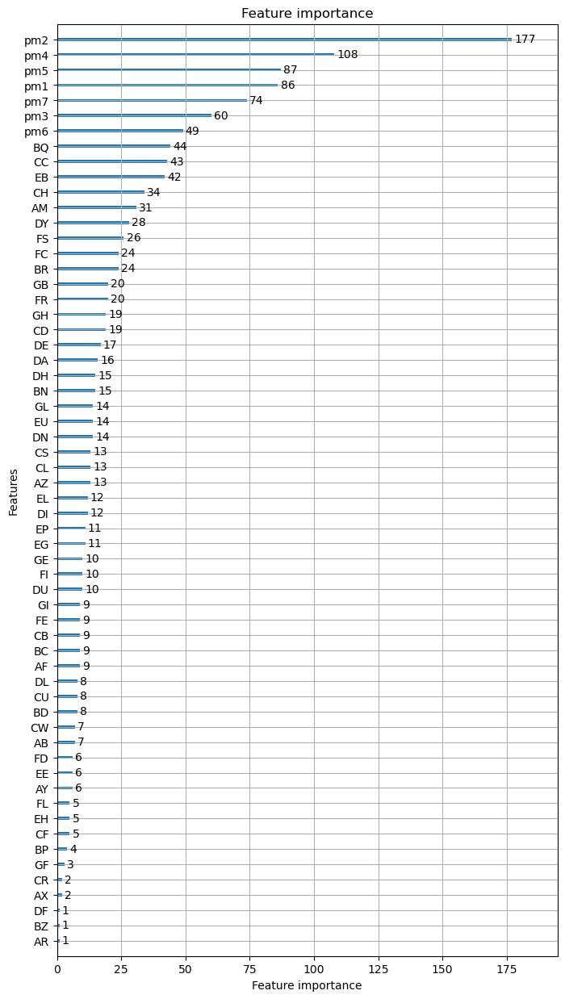

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.619185


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.491913
[300]	valid_0's balanced_logloss: 0.433879
[400]	valid_0's balanced_logloss: 0.40655
[500]	valid_0's balanced_logloss: 0.39726
[600]	valid_0's balanced_logloss: 0.394105
[700]	valid_0's balanced_logloss: 0.397411
[800]	valid_0's balanced_logloss: 0.402023
[900]	valid_0's balanced_logloss: 0.410253


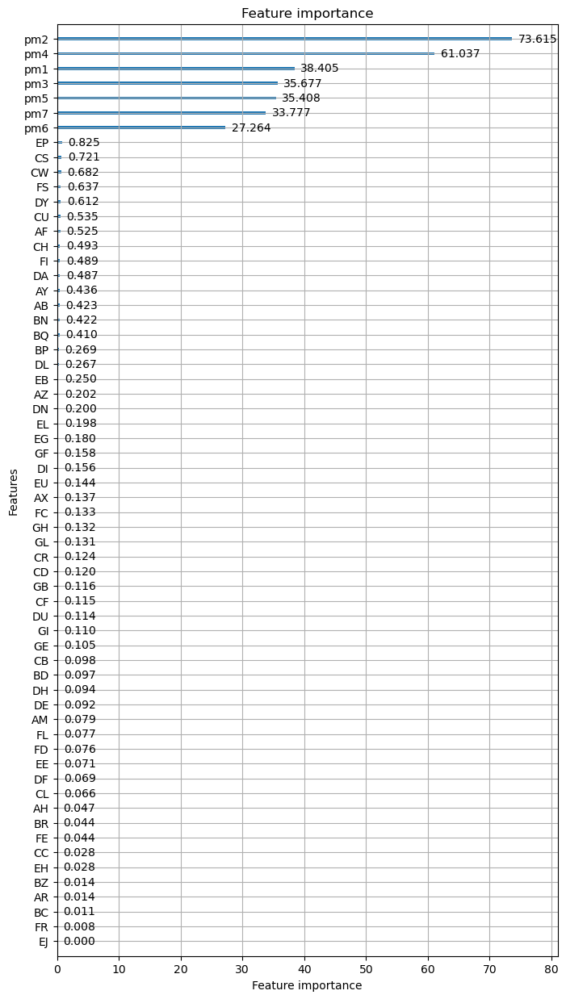

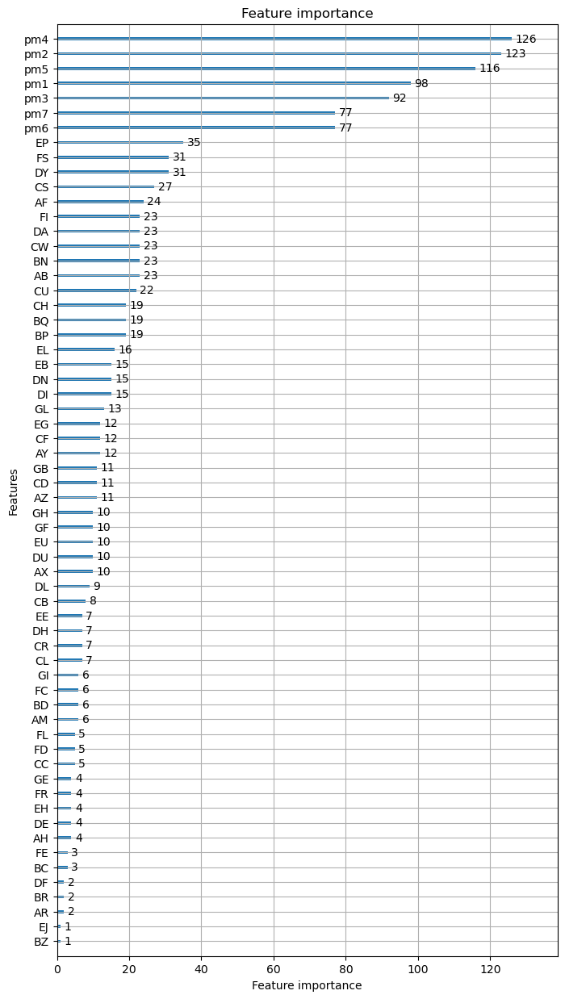

REPEAT NUMBER: 6/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.530478


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.364919
[300]	valid_0's balanced_logloss: 0.280628
[400]	valid_0's balanced_logloss: 0.230453
[500]	valid_0's balanced_logloss: 0.201493
[600]	valid_0's balanced_logloss: 0.185395
[700]	valid_0's balanced_logloss: 0.173873
[800]	valid_0's balanced_logloss: 0.165378
[900]	valid_0's balanced_logloss: 0.160583


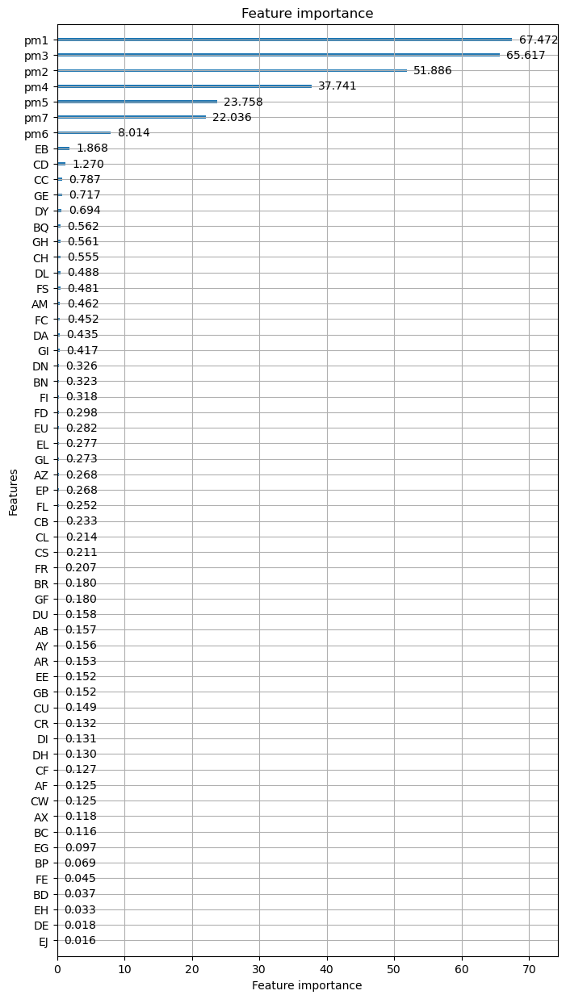

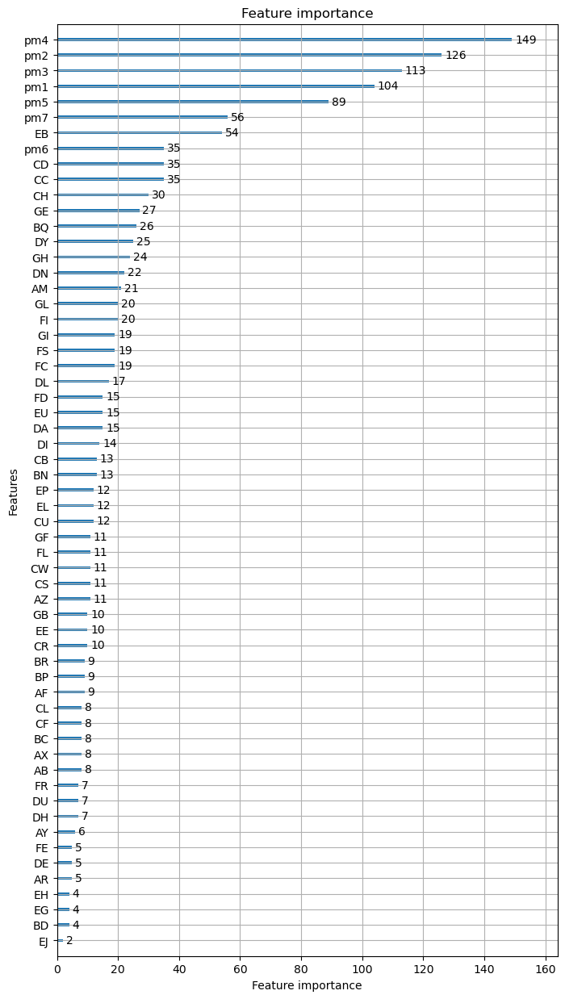

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.537453


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.368556
[300]	valid_0's balanced_logloss: 0.280413
[400]	valid_0's balanced_logloss: 0.228552
[500]	valid_0's balanced_logloss: 0.197982
[600]	valid_0's balanced_logloss: 0.177999
[700]	valid_0's balanced_logloss: 0.167389
[800]	valid_0's balanced_logloss: 0.160047
[900]	valid_0's balanced_logloss: 0.154724


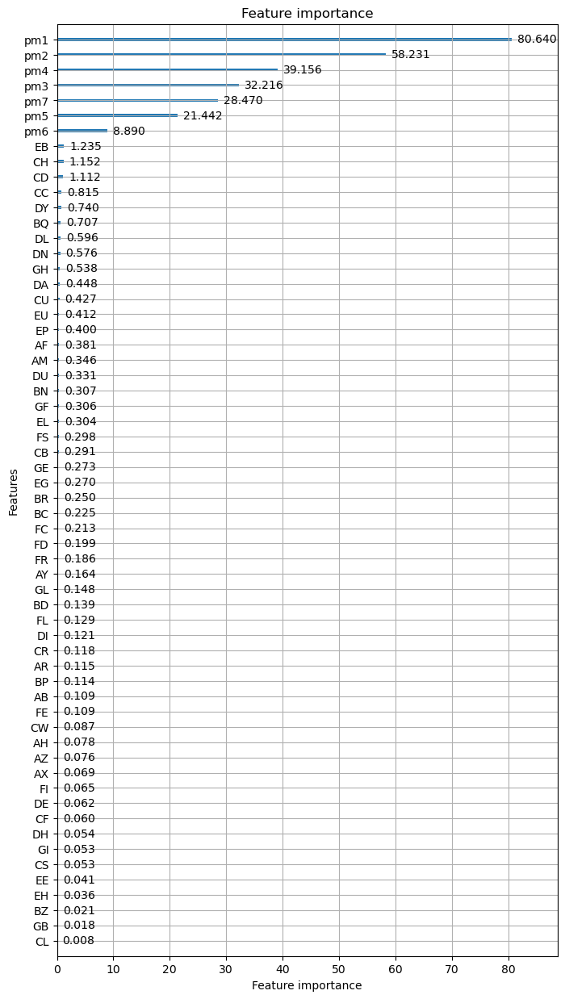

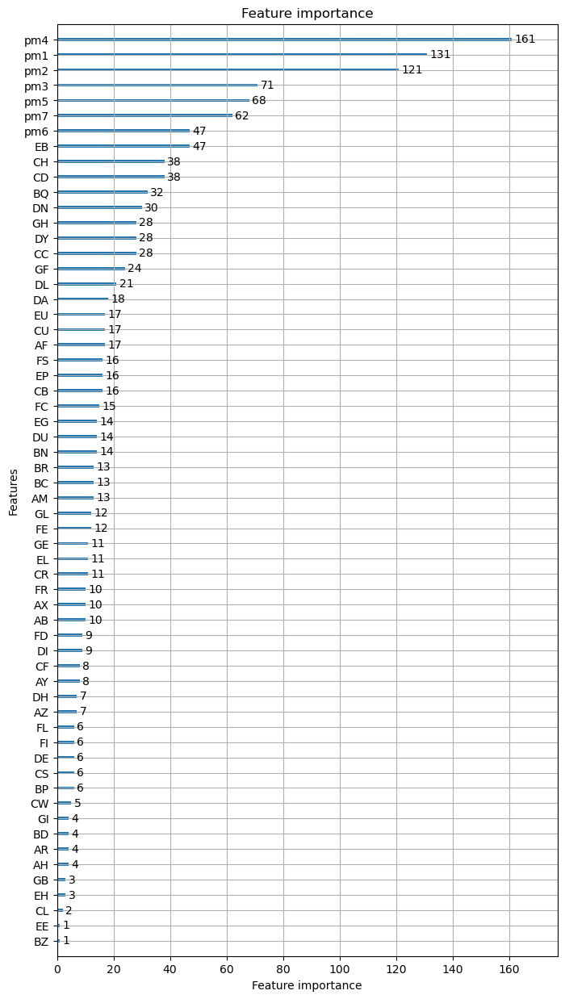

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.54488


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.388421
[300]	valid_0's balanced_logloss: 0.311996
[400]	valid_0's balanced_logloss: 0.267869
[500]	valid_0's balanced_logloss: 0.244205
[600]	valid_0's balanced_logloss: 0.232844
[700]	valid_0's balanced_logloss: 0.228482
[800]	valid_0's balanced_logloss: 0.225047
[900]	valid_0's balanced_logloss: 0.22396


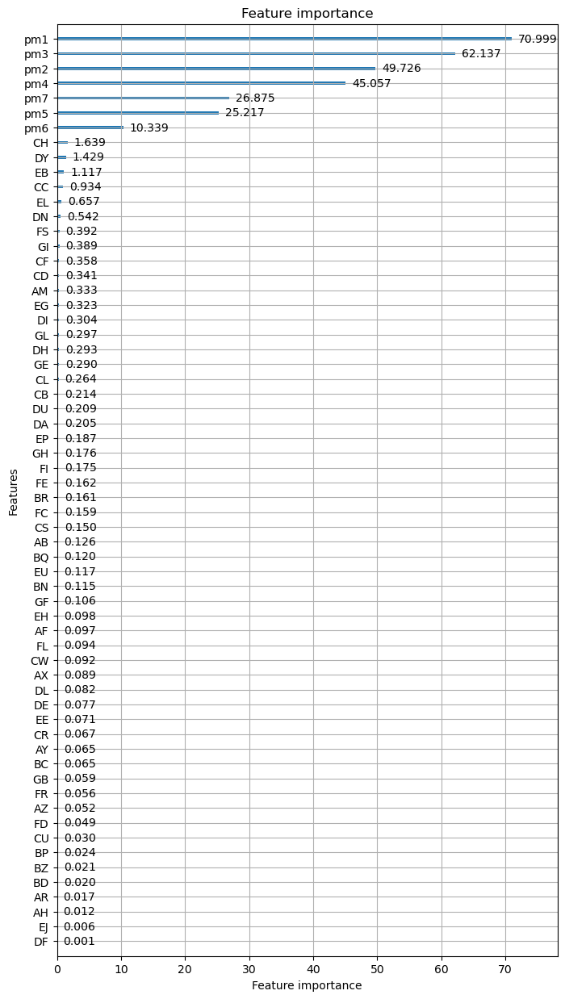

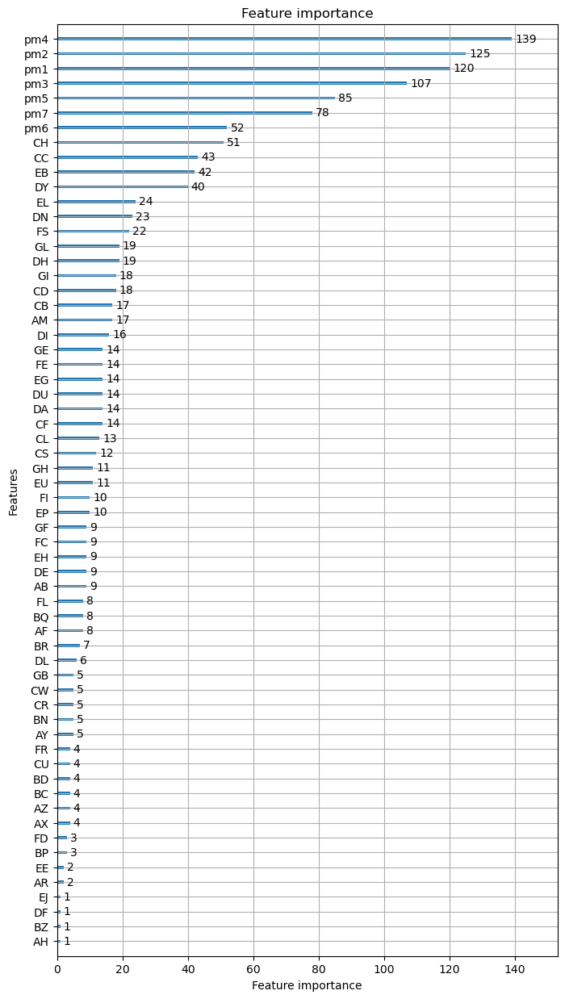

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.568048


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.417653
[300]	valid_0's balanced_logloss: 0.346196
[400]	valid_0's balanced_logloss: 0.307235
[500]	valid_0's balanced_logloss: 0.288908
[600]	valid_0's balanced_logloss: 0.281447
[700]	valid_0's balanced_logloss: 0.280452
[800]	valid_0's balanced_logloss: 0.282584
[900]	valid_0's balanced_logloss: 0.289966


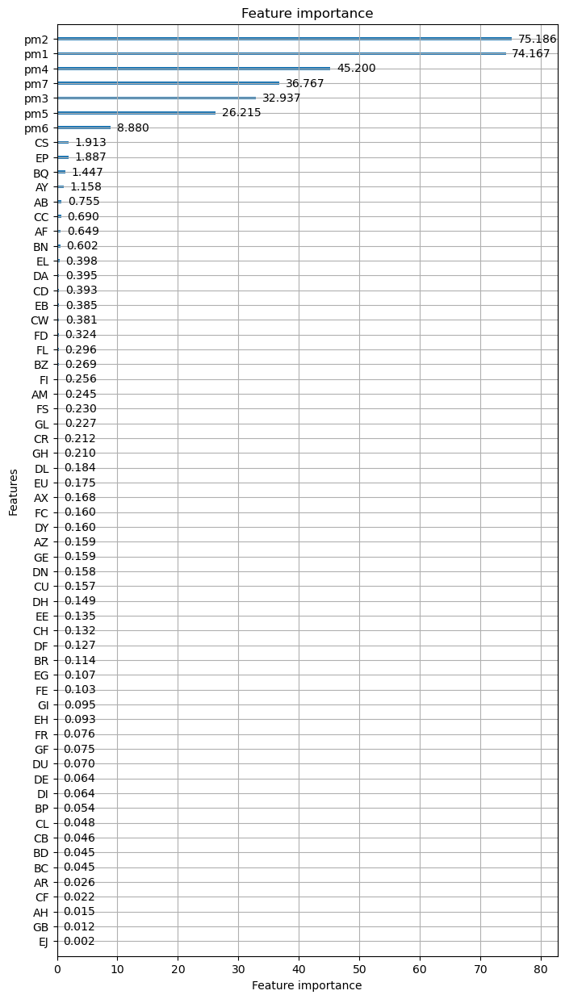

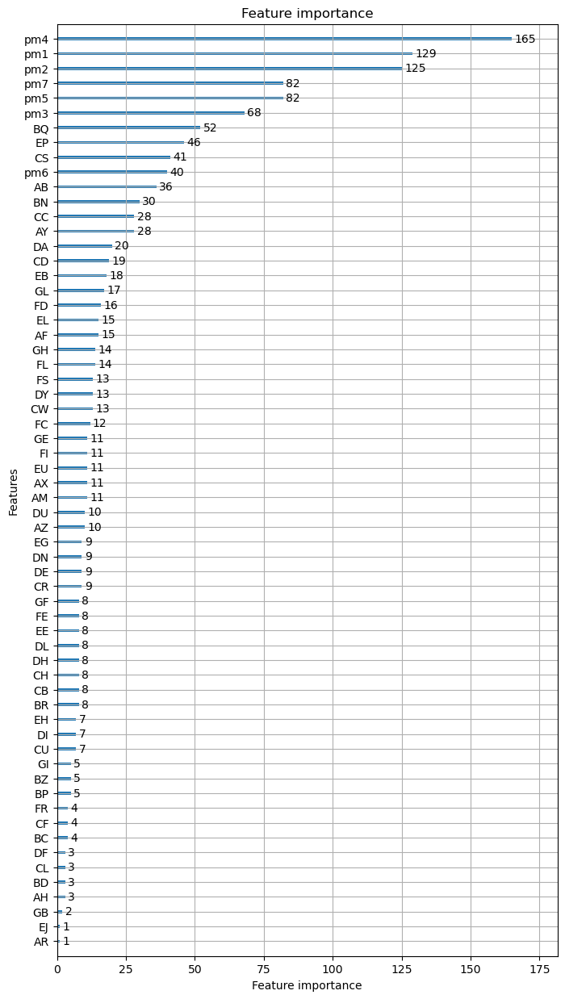

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.539211


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.385024
[300]	valid_0's balanced_logloss: 0.311437
[400]	valid_0's balanced_logloss: 0.26626
[500]	valid_0's balanced_logloss: 0.244875
[600]	valid_0's balanced_logloss: 0.231086
[700]	valid_0's balanced_logloss: 0.223237
[800]	valid_0's balanced_logloss: 0.218688
[900]	valid_0's balanced_logloss: 0.218582


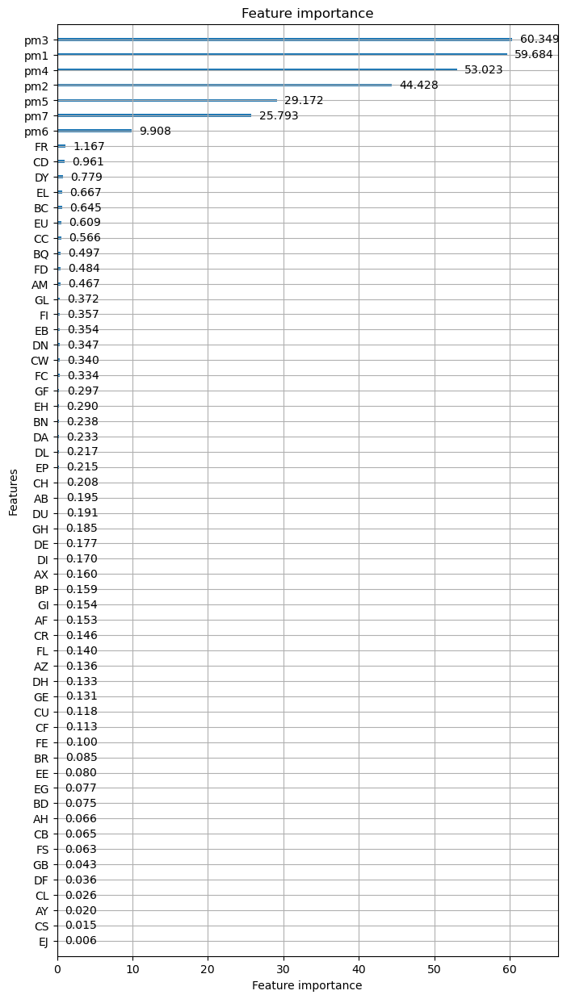

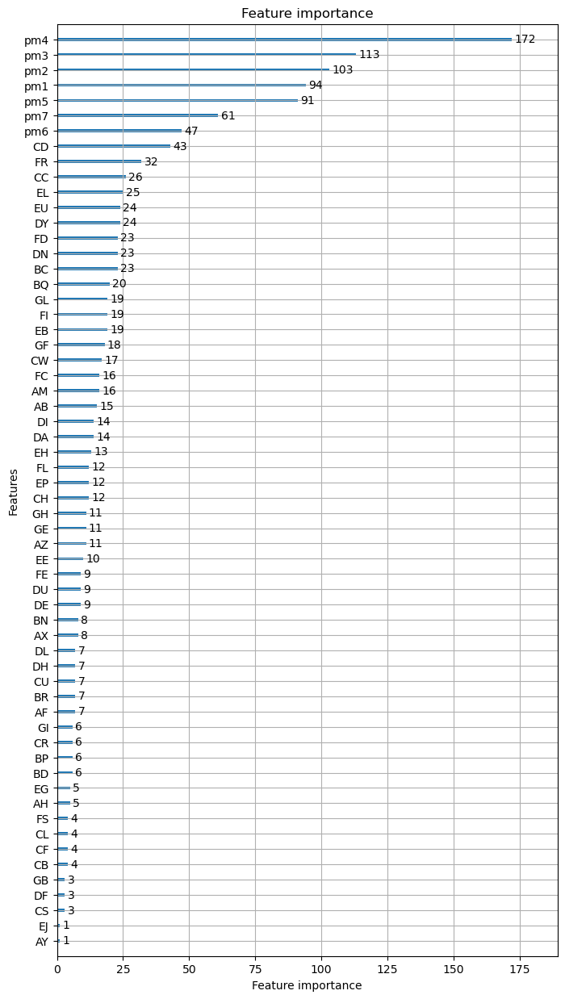

REPEAT NUMBER: 7/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.616523


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.484663
[300]	valid_0's balanced_logloss: 0.420484
[400]	valid_0's balanced_logloss: 0.389795
[500]	valid_0's balanced_logloss: 0.37243
[600]	valid_0's balanced_logloss: 0.366517
[700]	valid_0's balanced_logloss: 0.363509
[800]	valid_0's balanced_logloss: 0.362095
[900]	valid_0's balanced_logloss: 0.363125


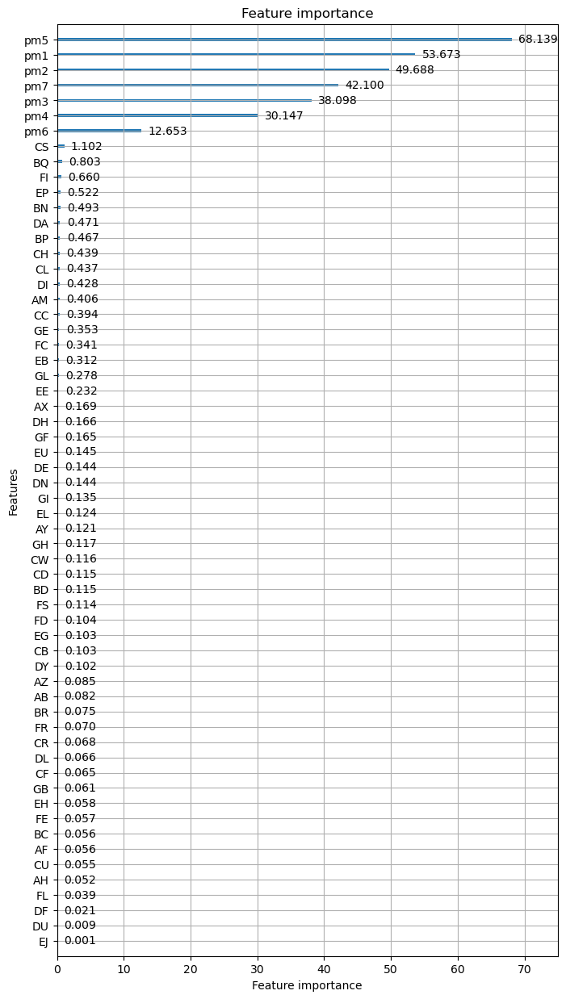

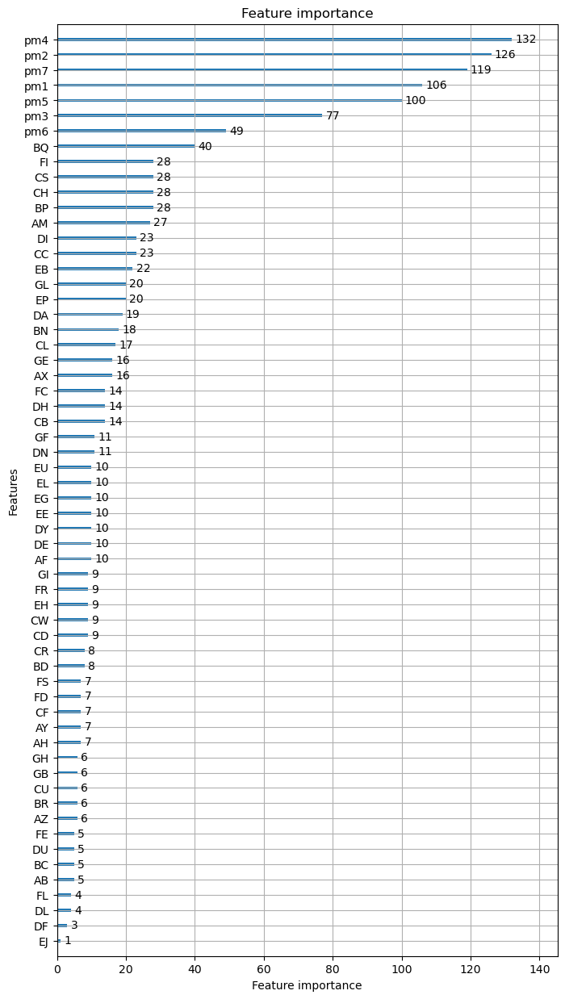

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.542832


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.378358
[300]	valid_0's balanced_logloss: 0.293725
[400]	valid_0's balanced_logloss: 0.243293
[500]	valid_0's balanced_logloss: 0.215605
[600]	valid_0's balanced_logloss: 0.201001
[700]	valid_0's balanced_logloss: 0.193767
[800]	valid_0's balanced_logloss: 0.189185
[900]	valid_0's balanced_logloss: 0.189088


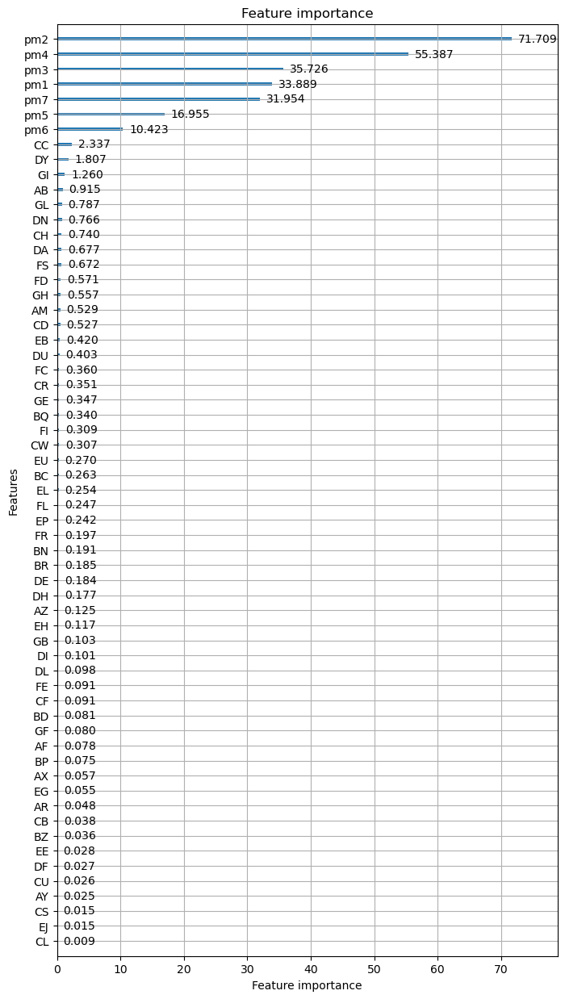

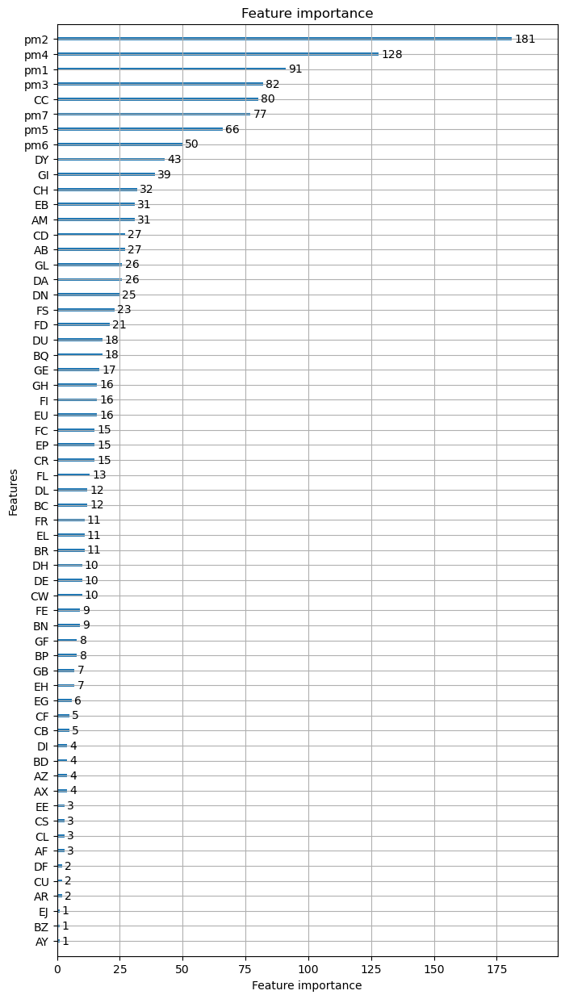

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.515353


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.35147
[300]	valid_0's balanced_logloss: 0.271015
[400]	valid_0's balanced_logloss: 0.223877
[500]	valid_0's balanced_logloss: 0.201486
[600]	valid_0's balanced_logloss: 0.188277
[700]	valid_0's balanced_logloss: 0.181342
[800]	valid_0's balanced_logloss: 0.176378
[900]	valid_0's balanced_logloss: 0.173445


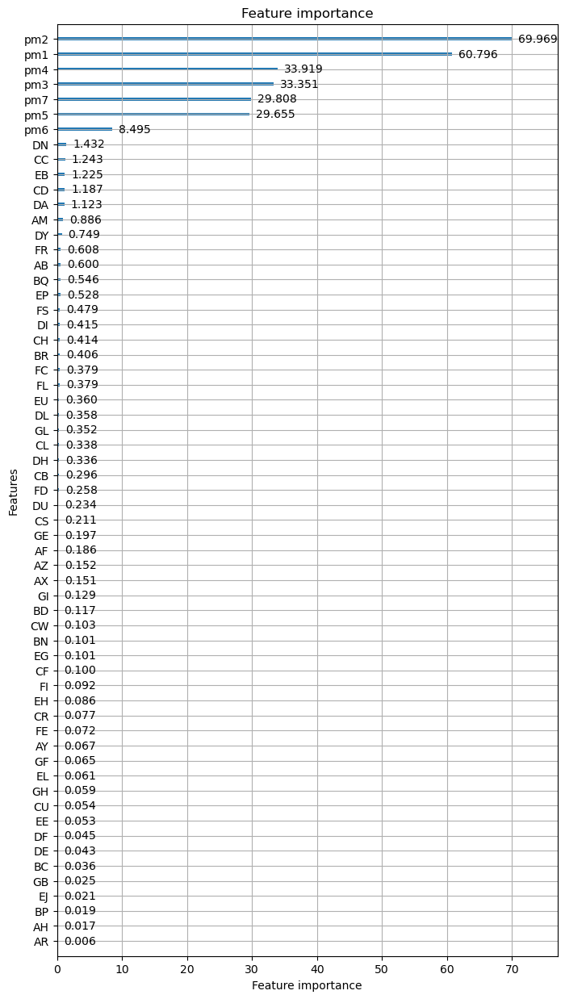

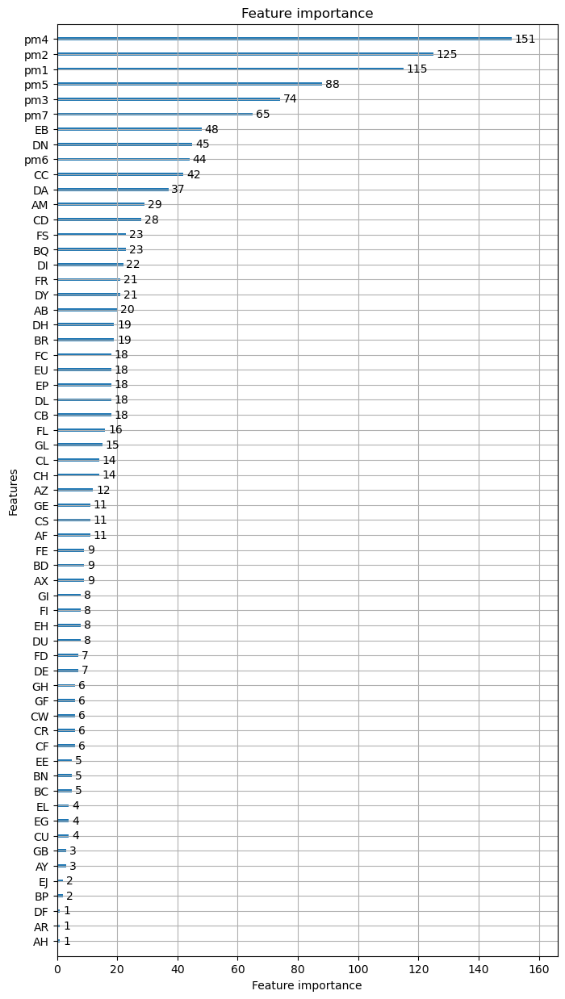

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.560172


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.405203
[300]	valid_0's balanced_logloss: 0.330975
[400]	valid_0's balanced_logloss: 0.286229
[500]	valid_0's balanced_logloss: 0.261613
[600]	valid_0's balanced_logloss: 0.2476
[700]	valid_0's balanced_logloss: 0.240593
[800]	valid_0's balanced_logloss: 0.235154
[900]	valid_0's balanced_logloss: 0.23201


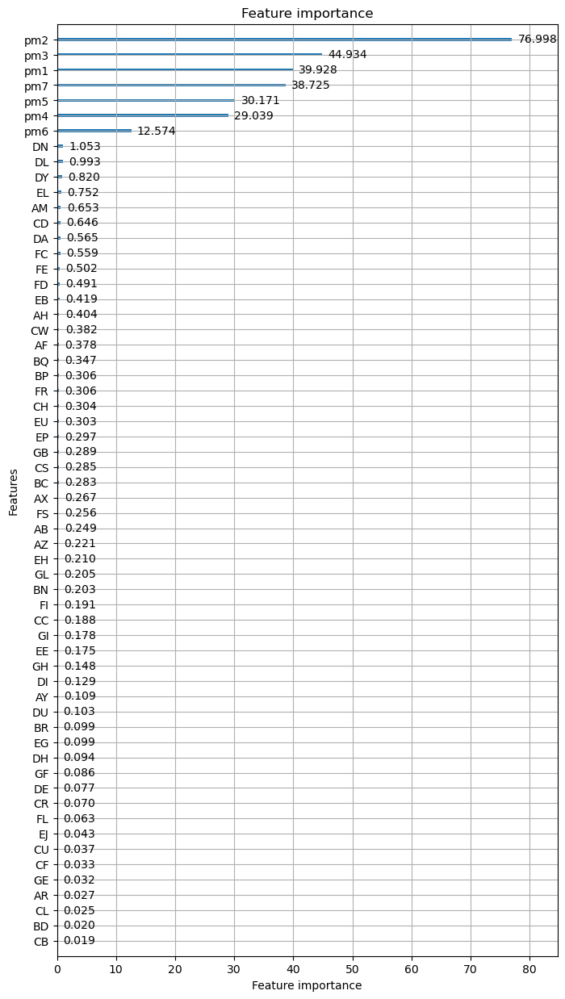

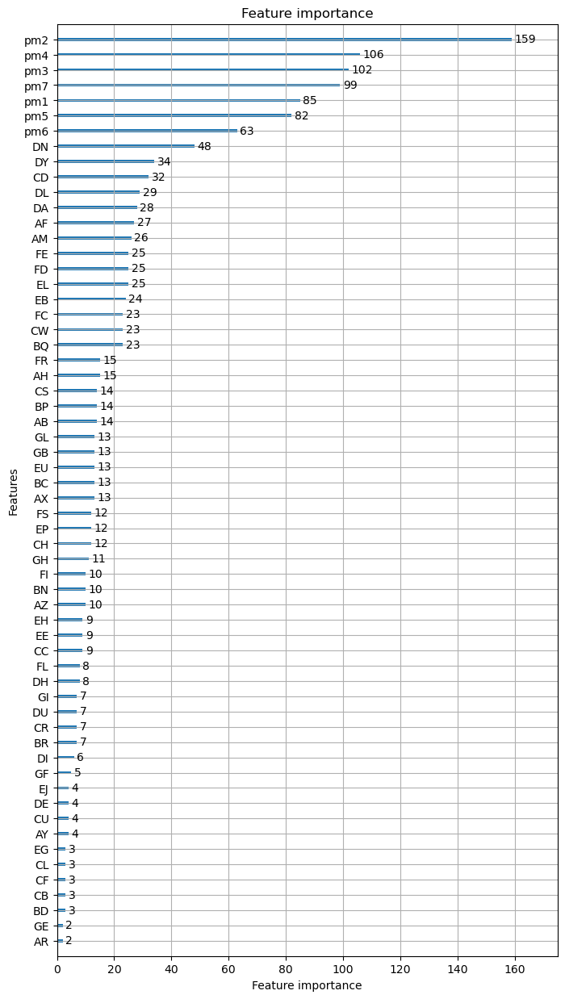

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.517374


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.346269
[300]	valid_0's balanced_logloss: 0.259088
[400]	valid_0's balanced_logloss: 0.207635
[500]	valid_0's balanced_logloss: 0.180413
[600]	valid_0's balanced_logloss: 0.164153
[700]	valid_0's balanced_logloss: 0.156803
[800]	valid_0's balanced_logloss: 0.150737
[900]	valid_0's balanced_logloss: 0.147144


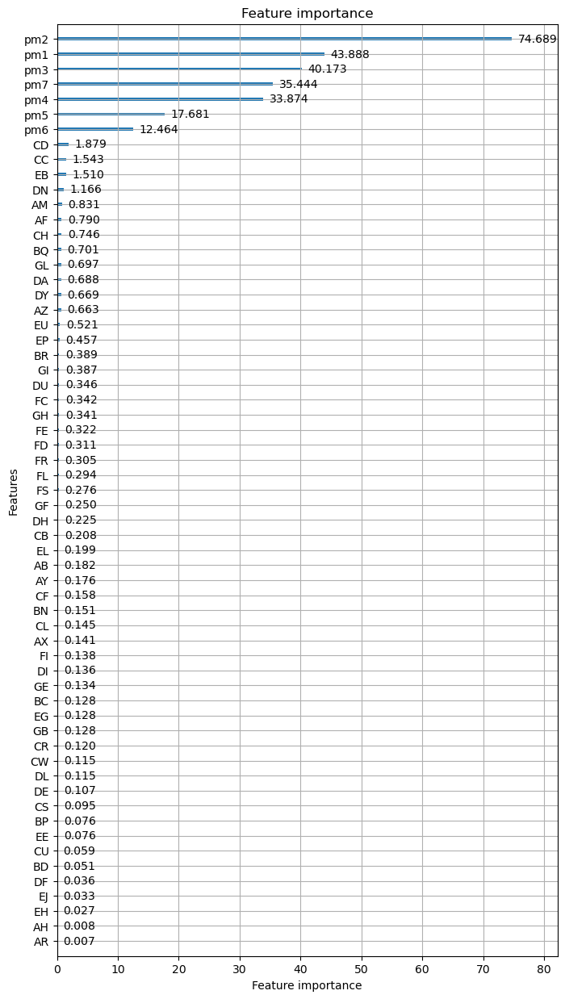

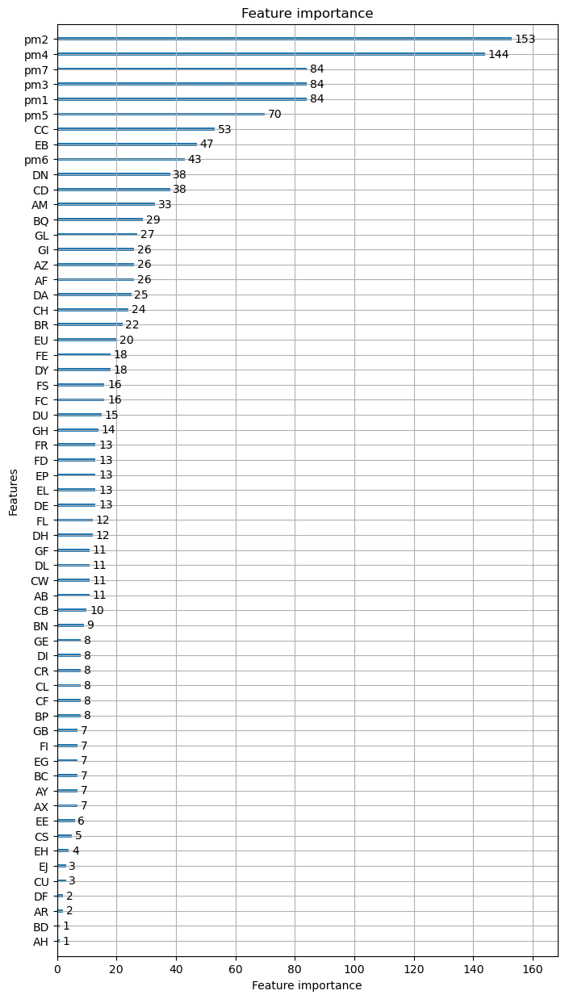

REPEAT NUMBER: 8/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.569034


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.422957
[300]	valid_0's balanced_logloss: 0.354396
[400]	valid_0's balanced_logloss: 0.31421
[500]	valid_0's balanced_logloss: 0.294318
[600]	valid_0's balanced_logloss: 0.286692
[700]	valid_0's balanced_logloss: 0.286252
[800]	valid_0's balanced_logloss: 0.288176
[900]	valid_0's balanced_logloss: 0.2912


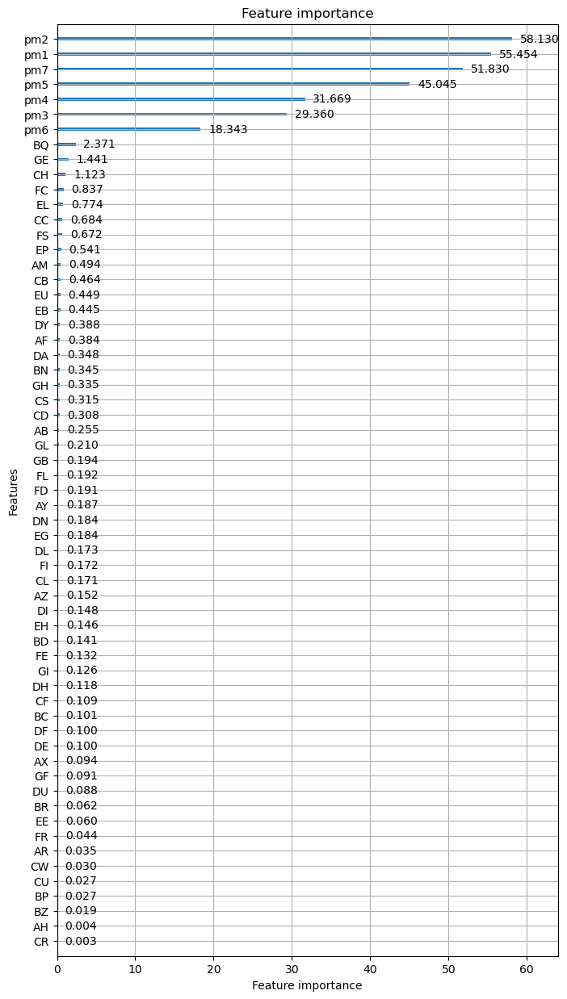

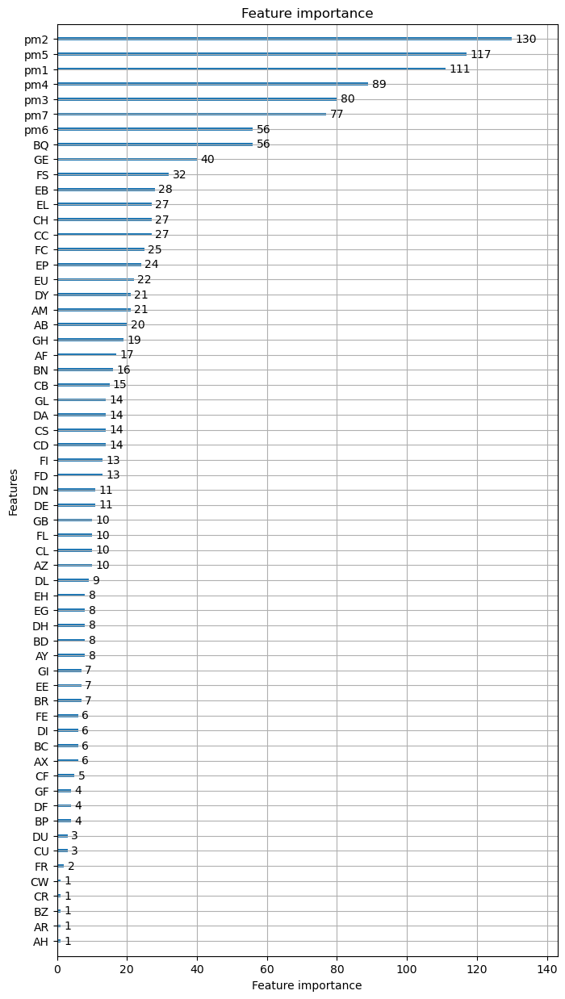

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.533469


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.366113
[300]	valid_0's balanced_logloss: 0.284847
[400]	valid_0's balanced_logloss: 0.234622
[500]	valid_0's balanced_logloss: 0.207368
[600]	valid_0's balanced_logloss: 0.192231
[700]	valid_0's balanced_logloss: 0.184393
[800]	valid_0's balanced_logloss: 0.17983
[900]	valid_0's balanced_logloss: 0.177112


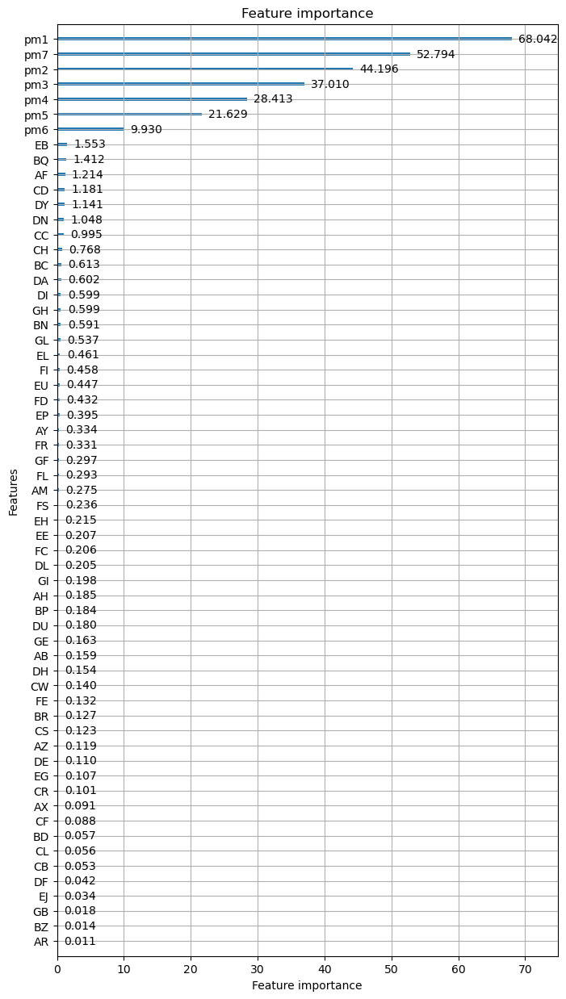

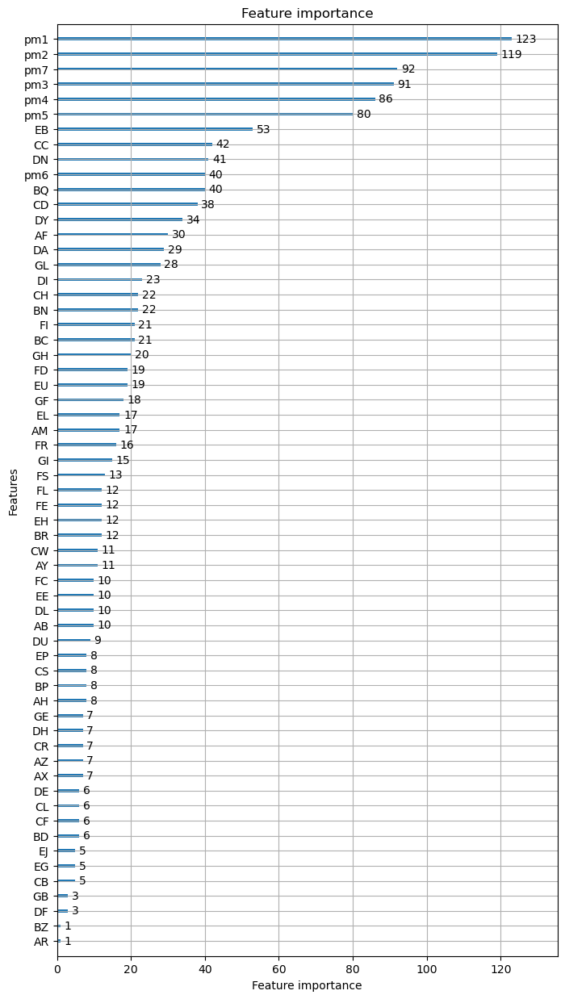

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.557474


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.406014
[300]	valid_0's balanced_logloss: 0.331443
[400]	valid_0's balanced_logloss: 0.292134
[500]	valid_0's balanced_logloss: 0.273531
[600]	valid_0's balanced_logloss: 0.265173
[700]	valid_0's balanced_logloss: 0.263514
[800]	valid_0's balanced_logloss: 0.263069
[900]	valid_0's balanced_logloss: 0.262414


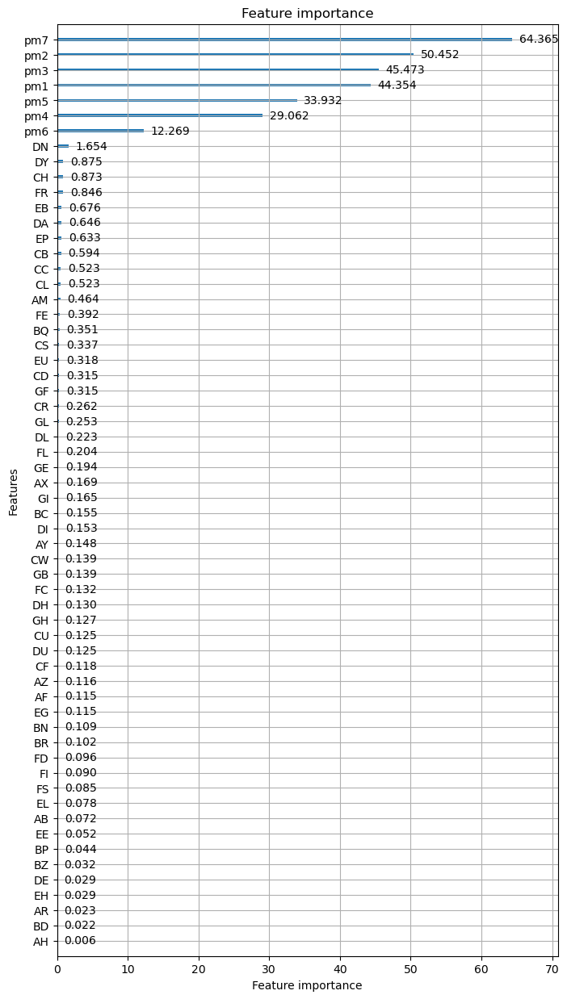

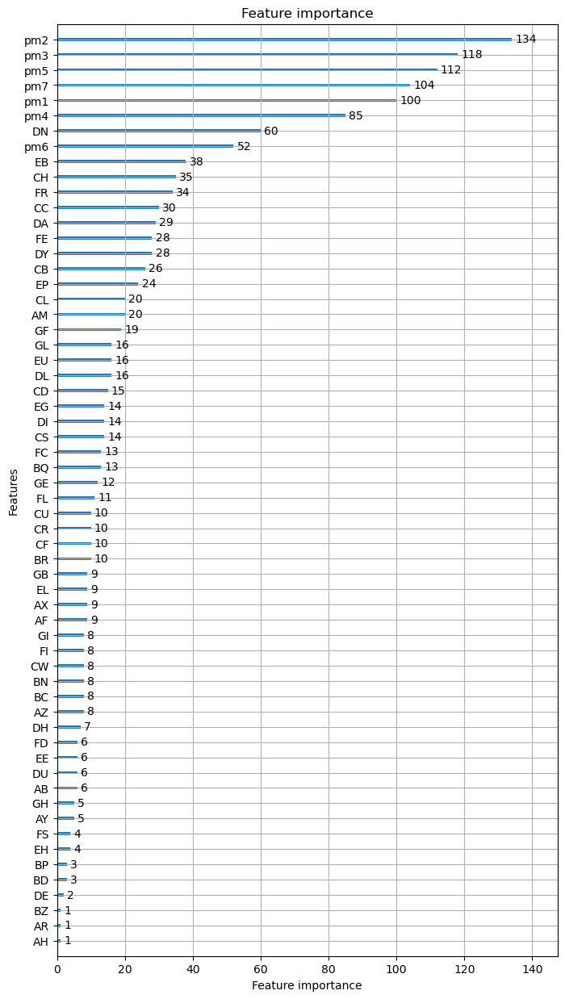

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.537336


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.372842
[300]	valid_0's balanced_logloss: 0.291301
[400]	valid_0's balanced_logloss: 0.242156
[500]	valid_0's balanced_logloss: 0.215279
[600]	valid_0's balanced_logloss: 0.200929
[700]	valid_0's balanced_logloss: 0.193522
[800]	valid_0's balanced_logloss: 0.187366
[900]	valid_0's balanced_logloss: 0.183719


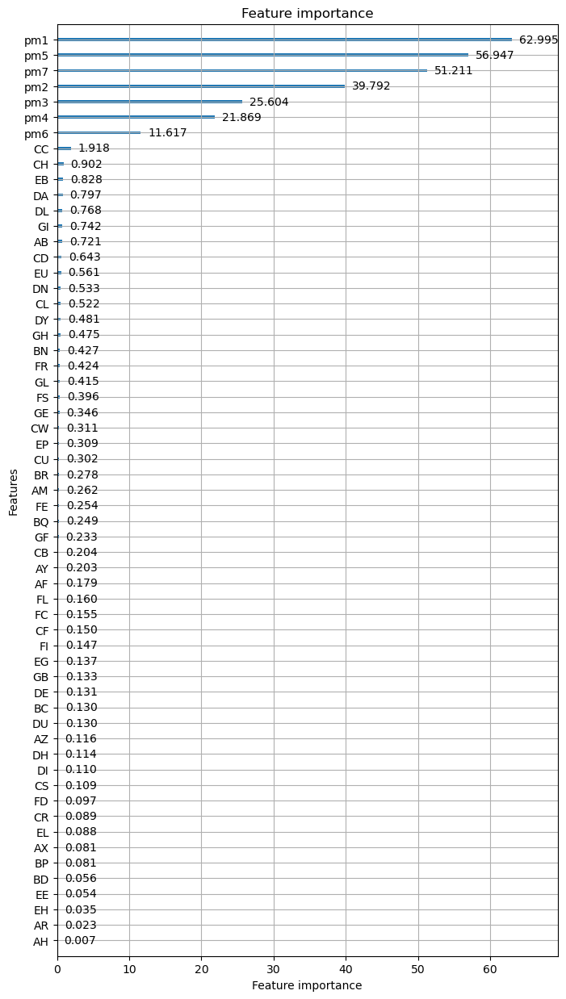

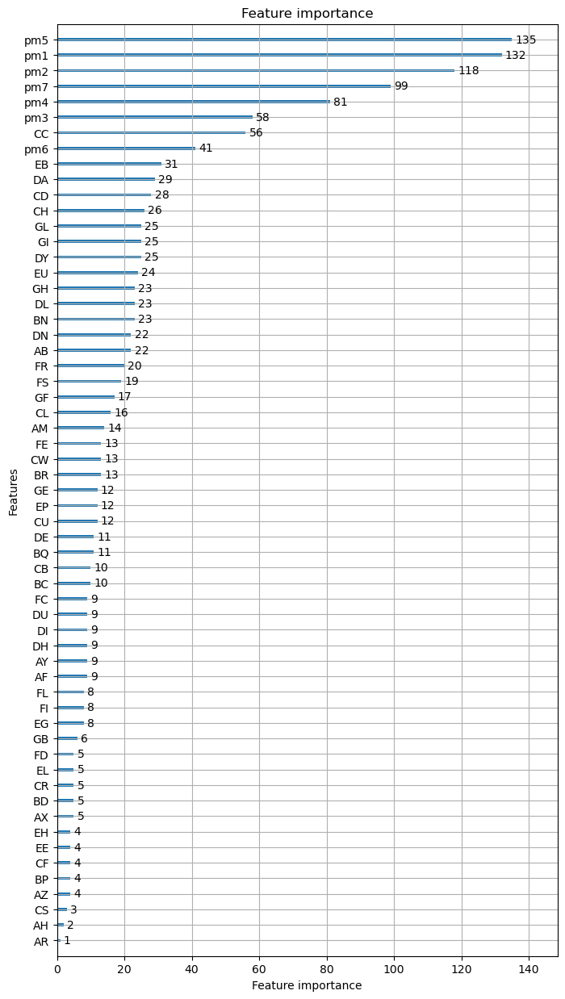

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.542822


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.380426
[300]	valid_0's balanced_logloss: 0.305445
[400]	valid_0's balanced_logloss: 0.259581
[500]	valid_0's balanced_logloss: 0.234478
[600]	valid_0's balanced_logloss: 0.218059
[700]	valid_0's balanced_logloss: 0.209064
[800]	valid_0's balanced_logloss: 0.204972
[900]	valid_0's balanced_logloss: 0.201461


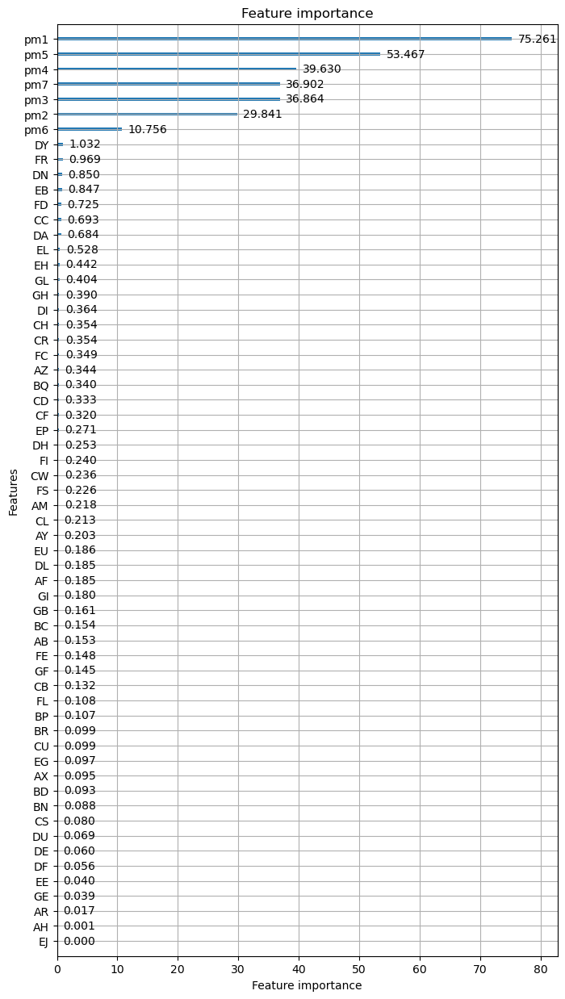

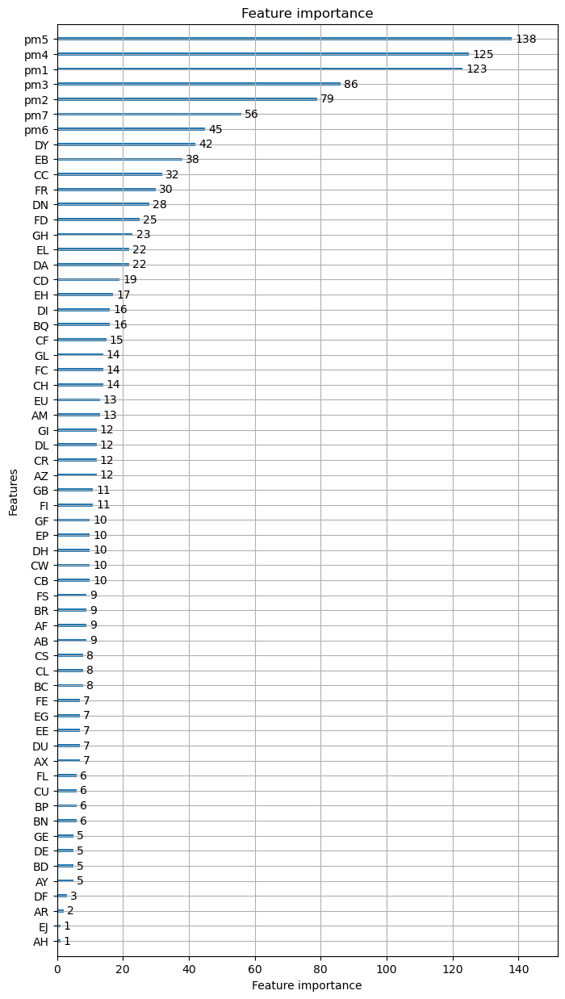

REPEAT NUMBER: 9/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.537243


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.376373
[300]	valid_0's balanced_logloss: 0.29645
[400]	valid_0's balanced_logloss: 0.248183
[500]	valid_0's balanced_logloss: 0.221623
[600]	valid_0's balanced_logloss: 0.20531
[700]	valid_0's balanced_logloss: 0.194824
[800]	valid_0's balanced_logloss: 0.188671
[900]	valid_0's balanced_logloss: 0.183475


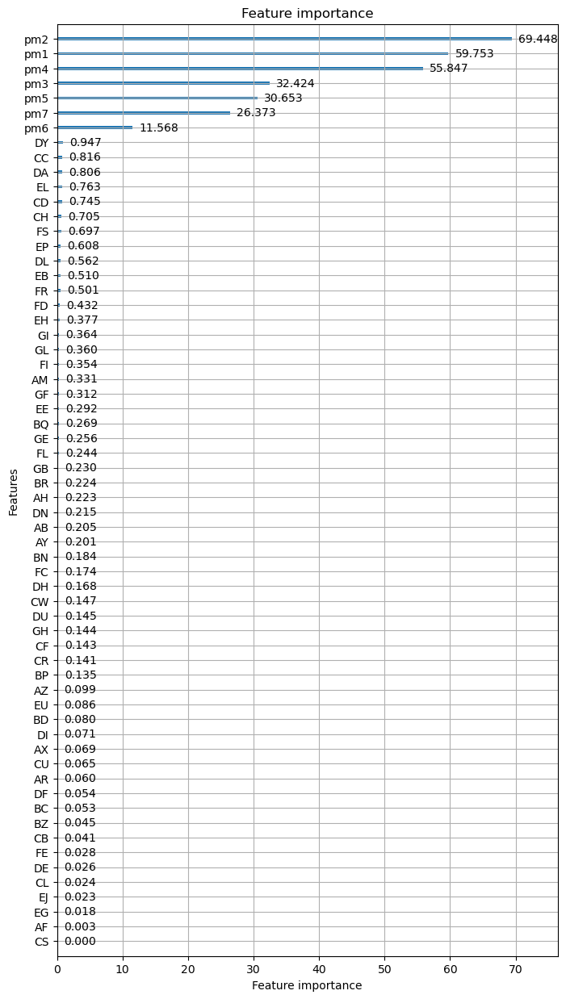

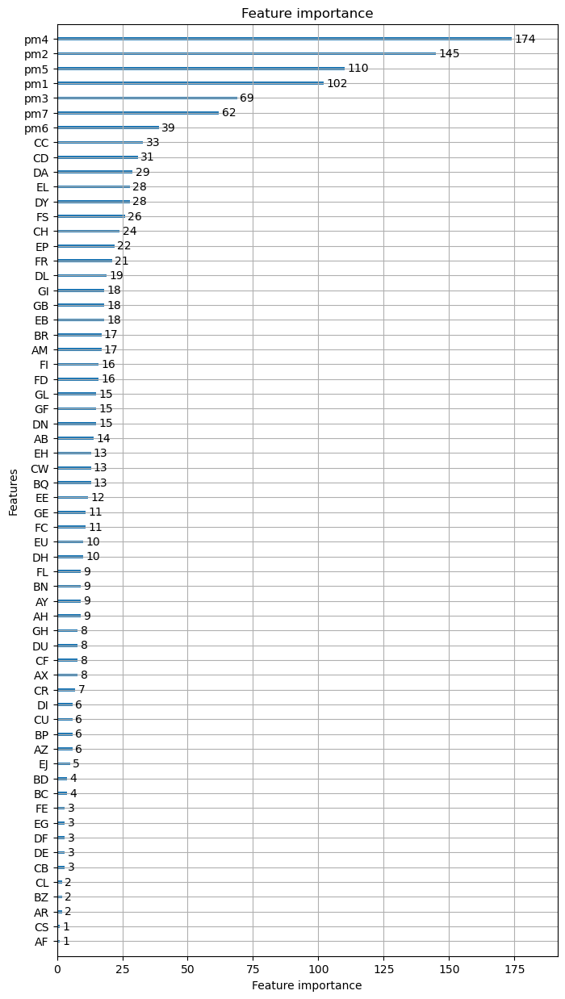

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.512817


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.344835
[300]	valid_0's balanced_logloss: 0.260462
[400]	valid_0's balanced_logloss: 0.211434
[500]	valid_0's balanced_logloss: 0.185229
[600]	valid_0's balanced_logloss: 0.168389
[700]	valid_0's balanced_logloss: 0.157911
[800]	valid_0's balanced_logloss: 0.15116
[900]	valid_0's balanced_logloss: 0.146229


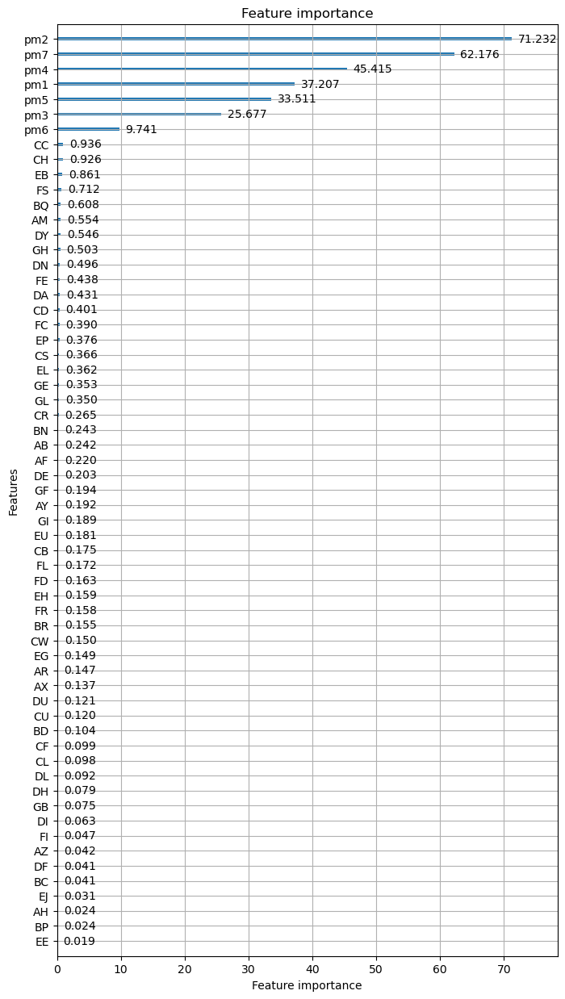

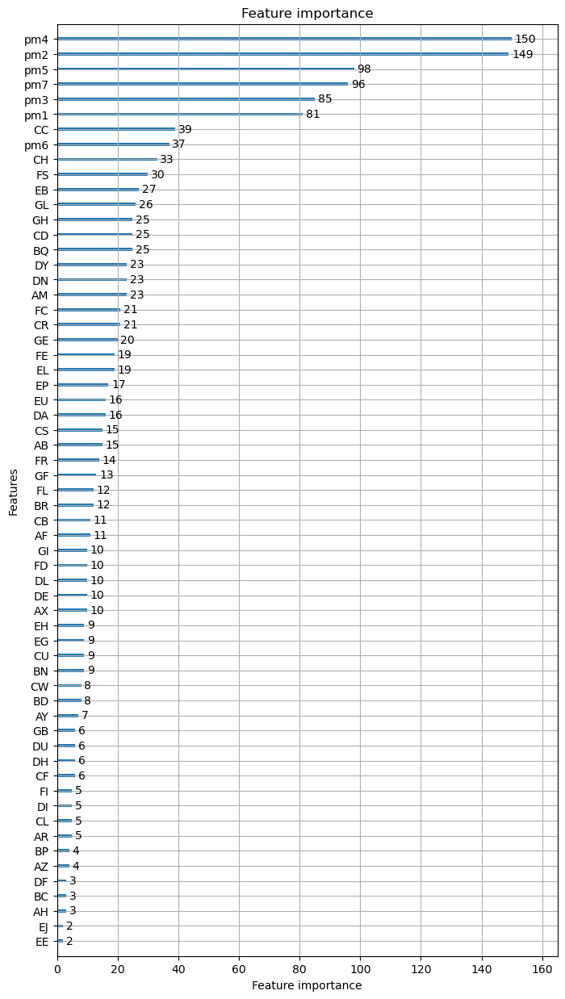

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.580143


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.422448
[300]	valid_0's balanced_logloss: 0.341292
[400]	valid_0's balanced_logloss: 0.291713
[500]	valid_0's balanced_logloss: 0.265259
[600]	valid_0's balanced_logloss: 0.248886
[700]	valid_0's balanced_logloss: 0.236521
[800]	valid_0's balanced_logloss: 0.227422
[900]	valid_0's balanced_logloss: 0.222844


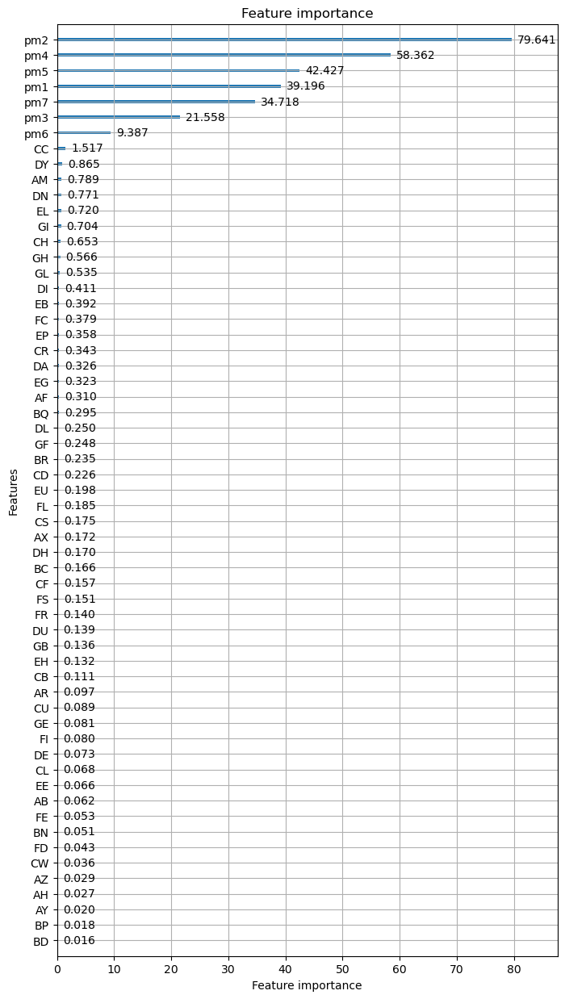

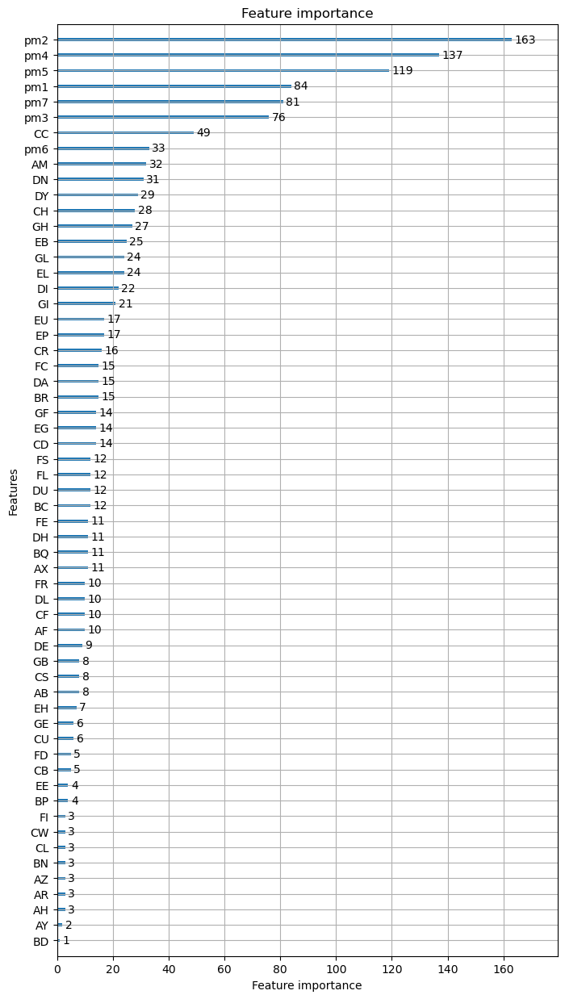

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.550385


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.393932
[300]	valid_0's balanced_logloss: 0.317617
[400]	valid_0's balanced_logloss: 0.272942
[500]	valid_0's balanced_logloss: 0.248471
[600]	valid_0's balanced_logloss: 0.234114
[700]	valid_0's balanced_logloss: 0.227587
[800]	valid_0's balanced_logloss: 0.224448
[900]	valid_0's balanced_logloss: 0.223526


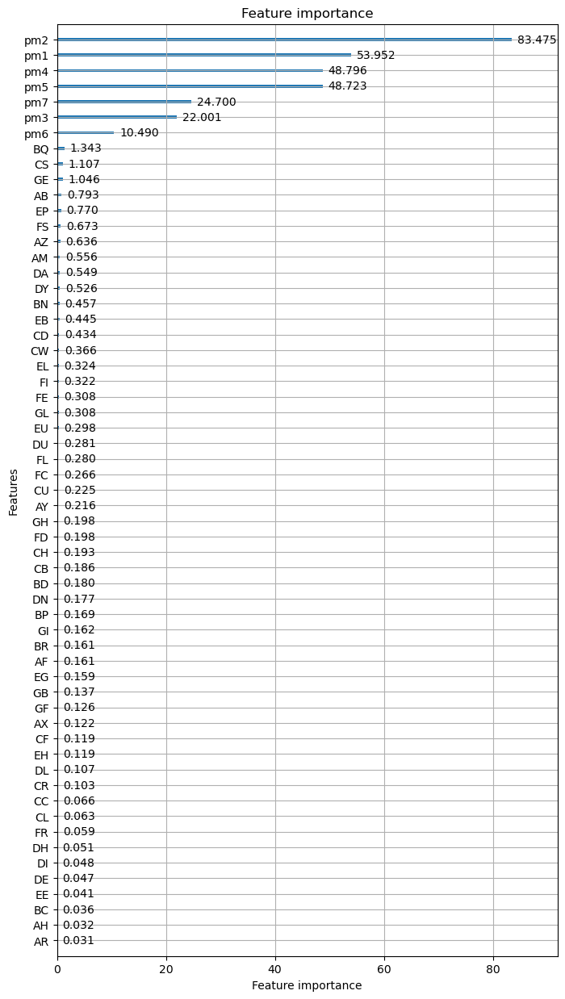

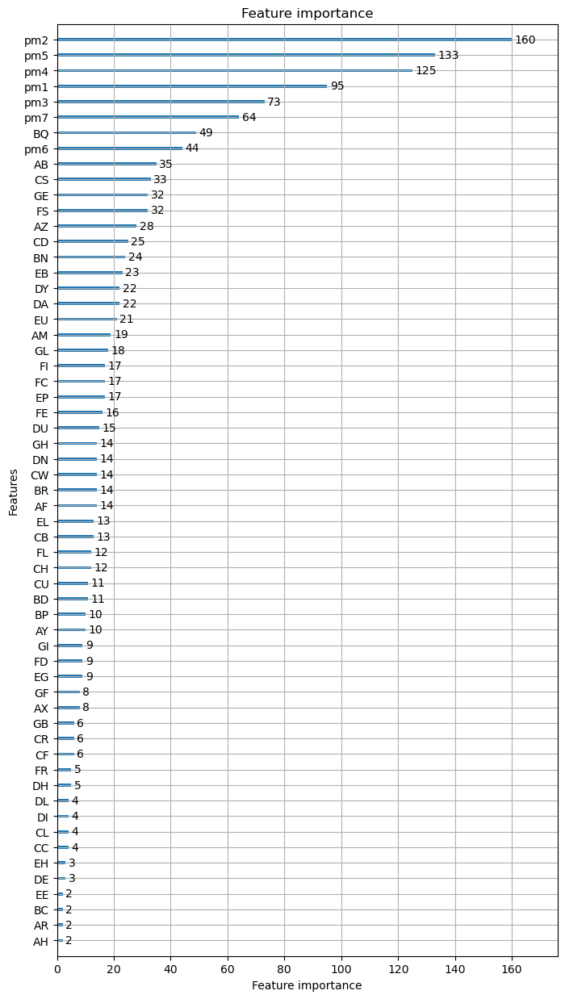

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.531931


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.372893
[300]	valid_0's balanced_logloss: 0.298323
[400]	valid_0's balanced_logloss: 0.256271
[500]	valid_0's balanced_logloss: 0.234871
[600]	valid_0's balanced_logloss: 0.224653
[700]	valid_0's balanced_logloss: 0.220014
[800]	valid_0's balanced_logloss: 0.216959
[900]	valid_0's balanced_logloss: 0.215026


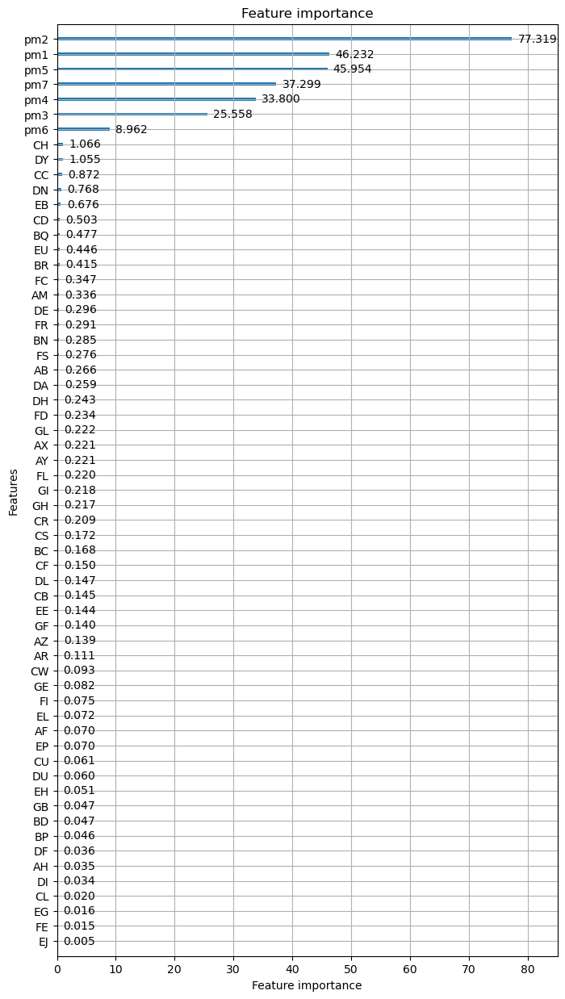

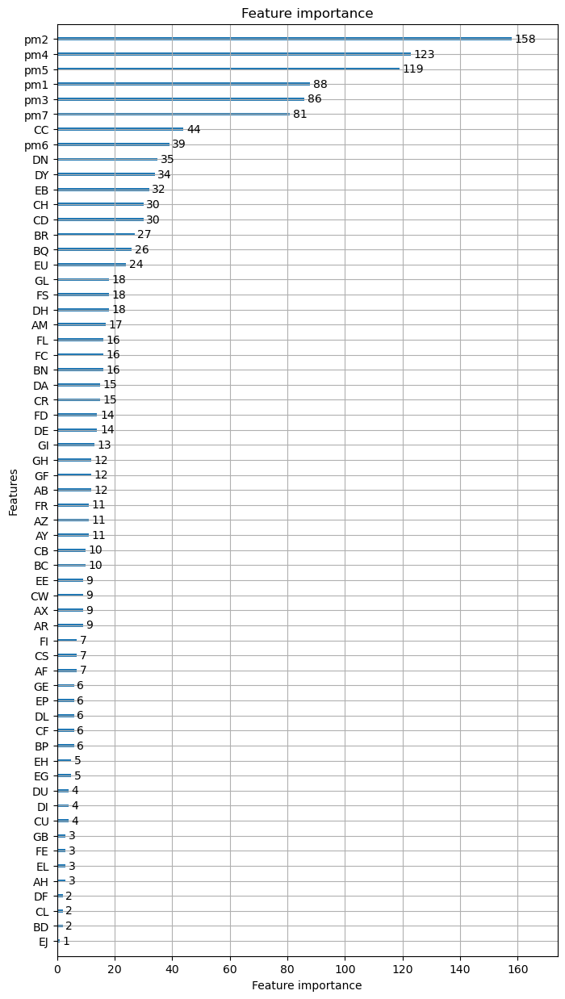

REPEAT NUMBER: 10/10
training model for fold: 1/5
[100]	valid_0's balanced_logloss: 0.514843


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.344876
[300]	valid_0's balanced_logloss: 0.25867
[400]	valid_0's balanced_logloss: 0.206757
[500]	valid_0's balanced_logloss: 0.179506
[600]	valid_0's balanced_logloss: 0.164975
[700]	valid_0's balanced_logloss: 0.155841
[800]	valid_0's balanced_logloss: 0.150278
[900]	valid_0's balanced_logloss: 0.14627


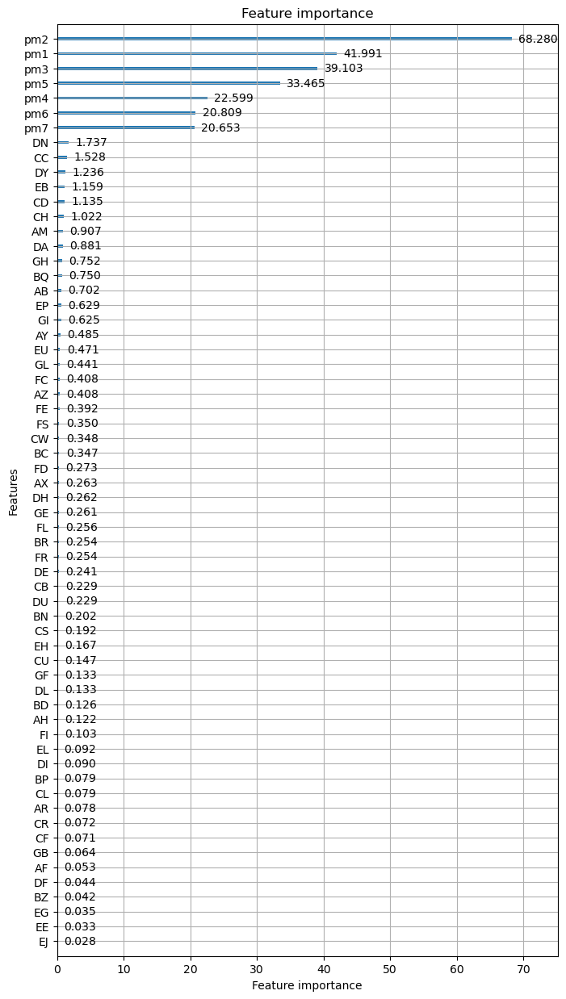

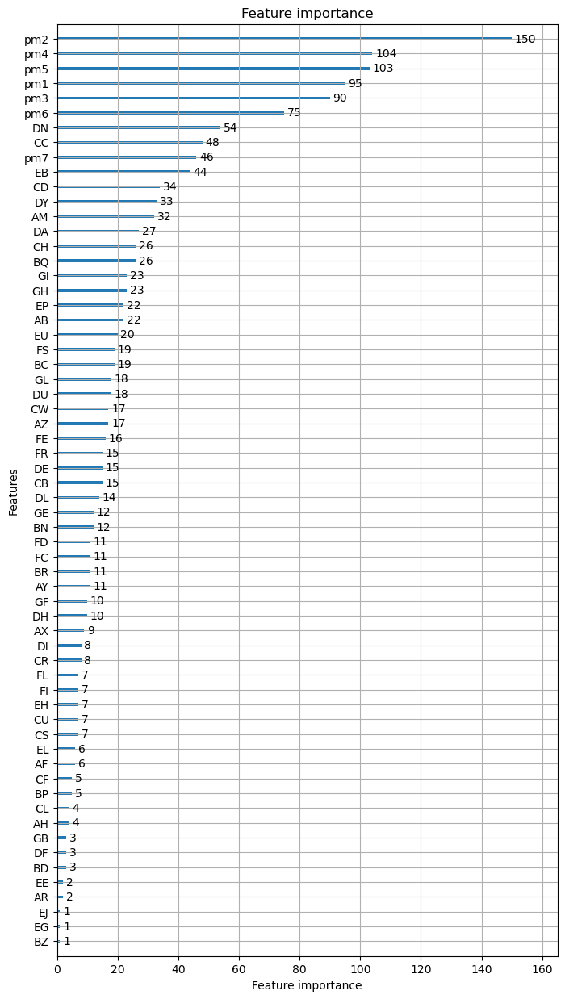

training model for fold: 2/5
[100]	valid_0's balanced_logloss: 0.60064


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.455567
[300]	valid_0's balanced_logloss: 0.384182
[400]	valid_0's balanced_logloss: 0.342865
[500]	valid_0's balanced_logloss: 0.322182
[600]	valid_0's balanced_logloss: 0.313585
[700]	valid_0's balanced_logloss: 0.311177
[800]	valid_0's balanced_logloss: 0.31483
[900]	valid_0's balanced_logloss: 0.32496


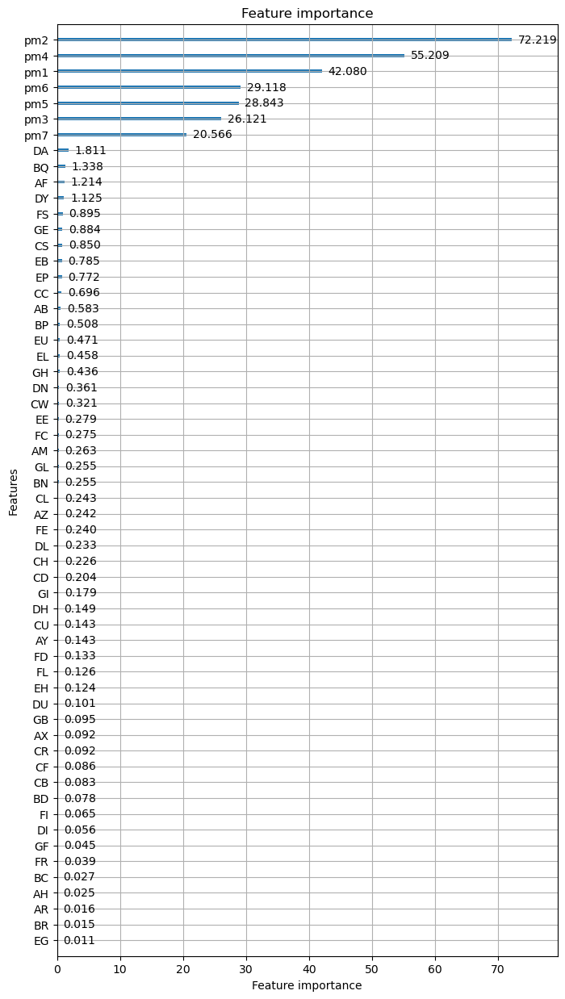

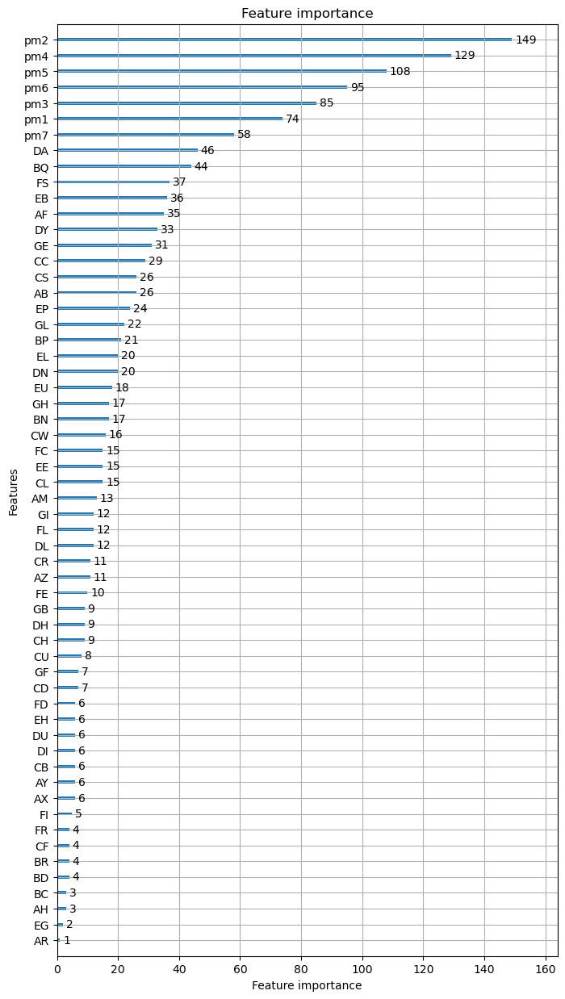

training model for fold: 3/5
[100]	valid_0's balanced_logloss: 0.561384


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.400144
[300]	valid_0's balanced_logloss: 0.316108
[400]	valid_0's balanced_logloss: 0.265027
[500]	valid_0's balanced_logloss: 0.237272
[600]	valid_0's balanced_logloss: 0.221211
[700]	valid_0's balanced_logloss: 0.214811
[800]	valid_0's balanced_logloss: 0.2104
[900]	valid_0's balanced_logloss: 0.209408


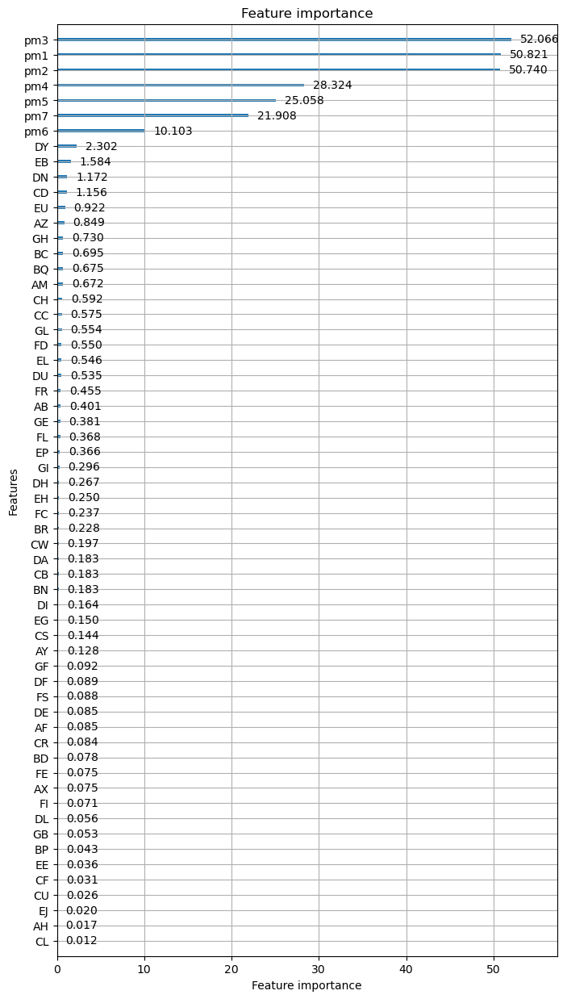

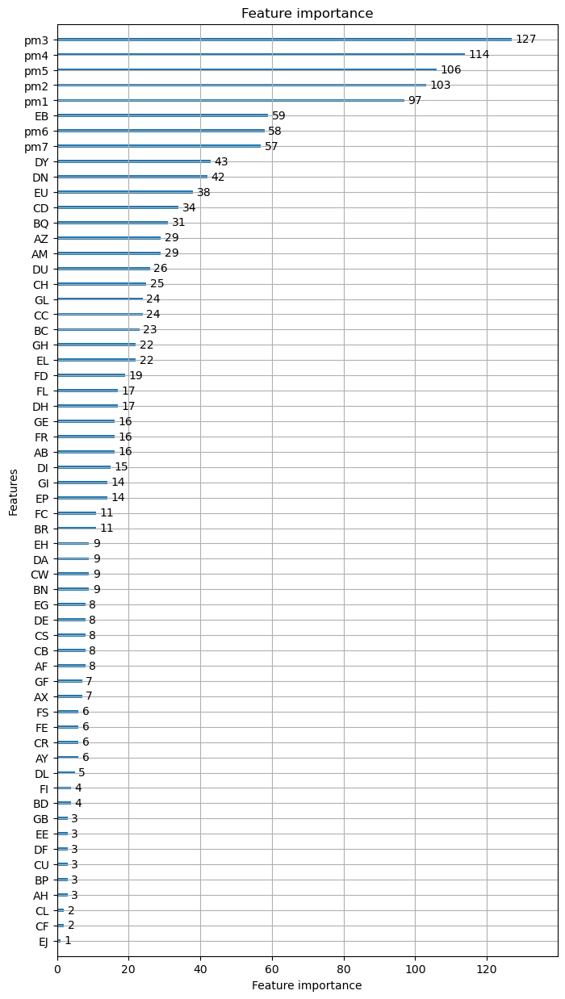

training model for fold: 4/5
[100]	valid_0's balanced_logloss: 0.562751


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.405545
[300]	valid_0's balanced_logloss: 0.328155
[400]	valid_0's balanced_logloss: 0.284549
[500]	valid_0's balanced_logloss: 0.263355
[600]	valid_0's balanced_logloss: 0.252332
[700]	valid_0's balanced_logloss: 0.247292
[800]	valid_0's balanced_logloss: 0.246095
[900]	valid_0's balanced_logloss: 0.245813


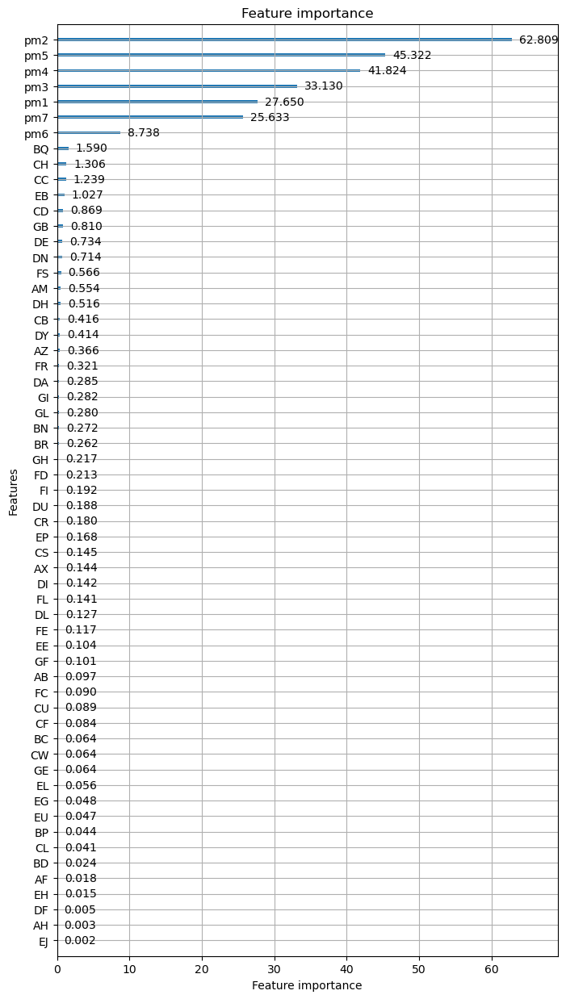

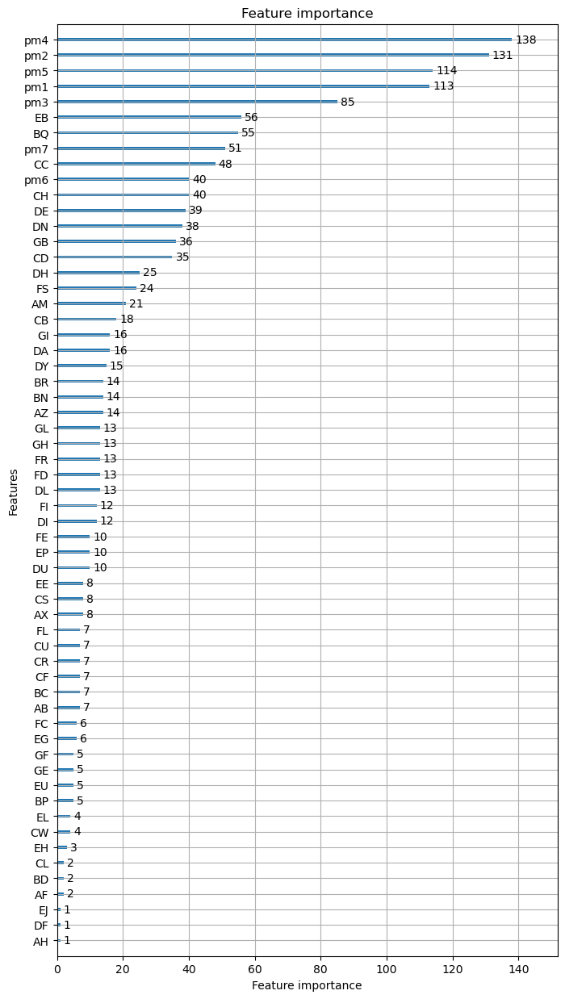

training model for fold: 5/5
[100]	valid_0's balanced_logloss: 0.556038


/opt/conda/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[200]	valid_0's balanced_logloss: 0.416532
[300]	valid_0's balanced_logloss: 0.355927
[400]	valid_0's balanced_logloss: 0.327005
[500]	valid_0's balanced_logloss: 0.312867
[600]	valid_0's balanced_logloss: 0.307959
[700]	valid_0's balanced_logloss: 0.306098
[800]	valid_0's balanced_logloss: 0.30675
[900]	valid_0's balanced_logloss: 0.308355


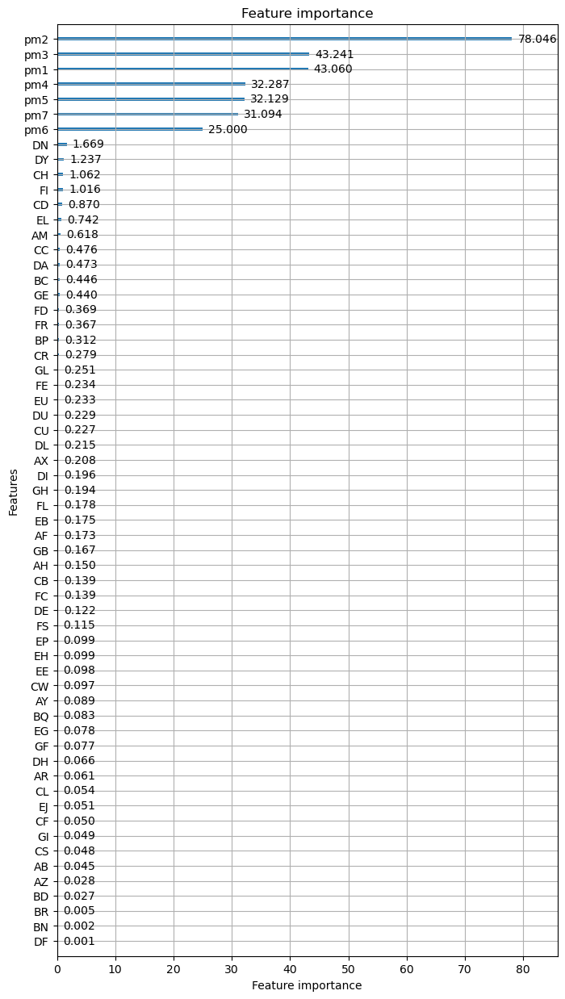

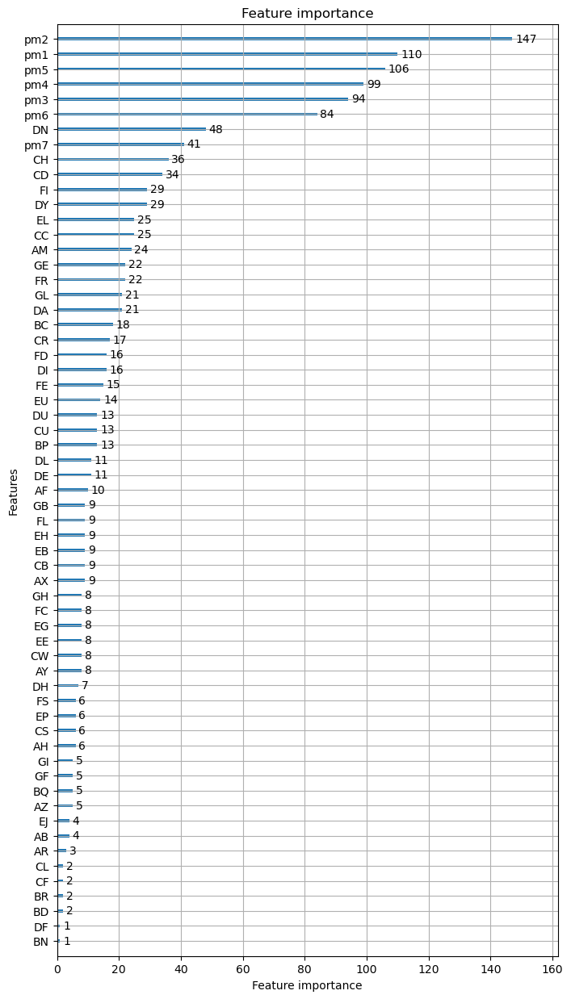

In [40]:
VERBOSE = True

models = list()
metrics = list()
oof_dfs = list()

for repeat in range(REPETITIONS):
    print(f"REPEAT NUMBER: {repeat+1}/{REPETITIONS}")
    cv_split = repeated_cv_split[f"repeat_{repeat}"]
    n_folds = len(cv_split)
    
    oof = train[["Id","Class"]].copy()
    oof["pred_proba"] = np.nan
    
    for split in cv_split:
        fold = split["fold"]
        train_idx = split["train_idx"]
        valid_idx = split["valid_idx"]
        print(f"training model for fold: {fold+1}/{n_folds}")
        
        _train,_input_cols = include_oof_preds(train, input_cols, oof_all, repeat)
    
        train_df = _train.loc[train_idx,:].reset_index(drop=True)
        valid_df = _train.loc[valid_idx,:].reset_index(drop=True)

        train_dset = lgb.Dataset(
            data=train_df.loc[:,_input_cols],
            label=train_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        valid_dset = lgb.Dataset(
            data=valid_df.loc[:,_input_cols],
            label=valid_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        model = lgb.train(
            params=model_params,
            train_set=train_dset,
            valid_sets=[valid_dset,],
            feval=[balanced_logloss],
            callbacks=[lgb.log_evaluation(period=100),],
        )
        
        if VERBOSE:
            lgb.plot_importance(model, importance_type="gain", figsize=(8,15))
            plt.show()
            lgb.plot_importance(model, importance_type="split", figsize=(8,15))
            plt.show()
            
        y_pred = model.predict(valid_df.loc[:,_input_cols])
        valid_loss = balanced_logloss_(y_pred, valid_df.loc[:,"Class"].values)
        oof.loc[valid_idx, "pred_proba"] = y_pred
        
        models.append(model)
        metrics.append(valid_loss)
                
    oof_dfs.append(oof)

***
## OOF analysis and calibration


In [41]:
compute_overall_metric(oof_dfs)

0.22092388343199362

In [42]:
oof_scores = oof_dfs[0].copy()
oof_scores.rename({"pred_proba":"pred_proba0"}, axis=1, inplace=True)

for i in range(1, len(oof_dfs)):
    _df = oof_dfs[i].copy()
    _df.rename({"pred_proba":f"pred_proba{i}"}, axis=1, inplace=True)
    oof_scores = oof_scores.merge(_df, on=["Id","Class"])
    
oof_scores["avg_proba"] = oof_scores.iloc[:,2:].mean(axis=1)
oof_scores

,Id,Class,pred_proba0,pred_proba1,pred_proba2,pred_proba3,pred_proba4,pred_proba5,pred_proba6,pred_proba7,pred_proba8,pred_proba9,avg_proba
0,000ff2bfdfe9,1,0.919751,0.958837,0.944391,0.947526,0.941431,0.946465,0.948300,0.935621,0.959714,0.950053,0.945209
1,007255e47698,0,0.020257,0.028688,0.029845,0.028817,0.030663,0.019097,0.040422,0.025817,0.030748,0.023687,0.027804
2,013f2bd269f5,0,0.456208,0.418191,0.217541,0.572895,0.223693,0.241435,0.371496,0.059727,0.419733,0.245363,0.322628
3,043ac50845d5,0,0.141455,0.067220,0.043285,0.213696,0.111742,0.149656,0.129971,0.035801,0.070725,0.092953,0.105651
4,044fb8a146ec,1,0.791173,0.920616,0.821424,0.758350,0.919451,0.800260,0.797900,0.834718,0.718819,0.806962,0.816967
...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,fd3dafe738fd,0,0.029133,0.018807,0.040412,0.029256,0.026618,0.035158,0.038019,0.031942,0.031180,0.020903,0.030143
613,fd895603f071,0,0.154163,0.021165,0.332439,0.136667,0.160631,0.041240,0.035995,0.192559,0.071040,0.075395,0.122129
614,fd8ef6377f76,0,0.024527,0.044056,0.027793,0.031424,0.022210,0.032280,0.035828,0.026330,0.028605,0.054513,0.032757
615,fe1942975e40,0,0.021777,0.040291,0.030720,0.079130,0.030886,0.019446,0.053798,0.053404,0.035167,0.048164,0.041278


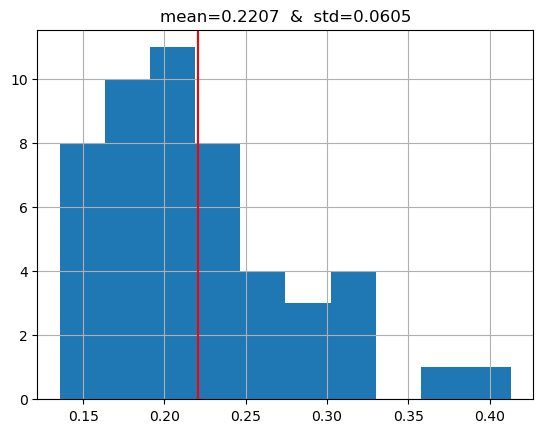

In [43]:
_metrics = metrics[:50]

metric_mean = np.mean(_metrics)
metric_median = np.median(_metrics)
metric_std = np.std(_metrics)

plt.hist(_metrics, bins=10)
plt.axvline(metric_mean, c="r")
plt.title(f"mean={metric_mean:0.4f}  &  std={metric_std:0.4f}")
plt.grid()
plt.show()

In [44]:
calib_params = optimize_calibration(oof_dfs)

best_value: 0.2178685562752794
best_params: {'alpha': 1.5707120323664105, 'beta': 1.0098800221750273, 'gamma': 0.7596277618959824}


####################################################################################################
CV repeat nbr: 1 - metric: 0.2165


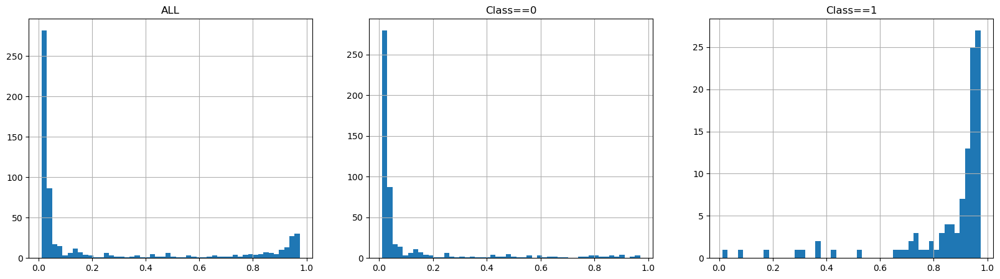

CV repeat nbr: 1 - metric: 0.2147


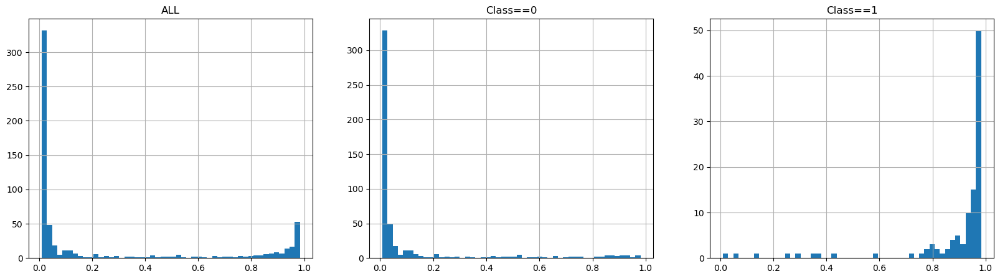

####################################################################################################
CV repeat nbr: 2 - metric: 0.2248


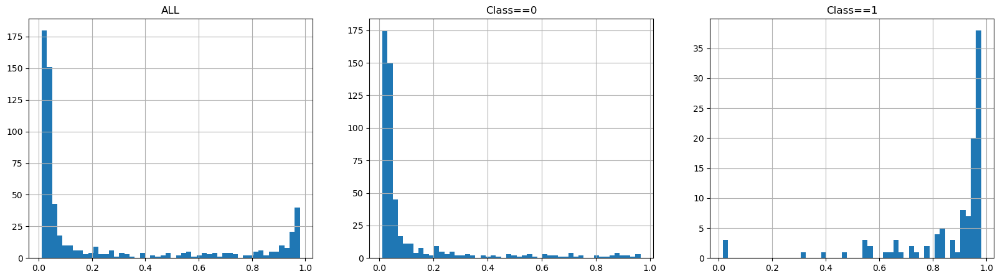

CV repeat nbr: 2 - metric: 0.2191


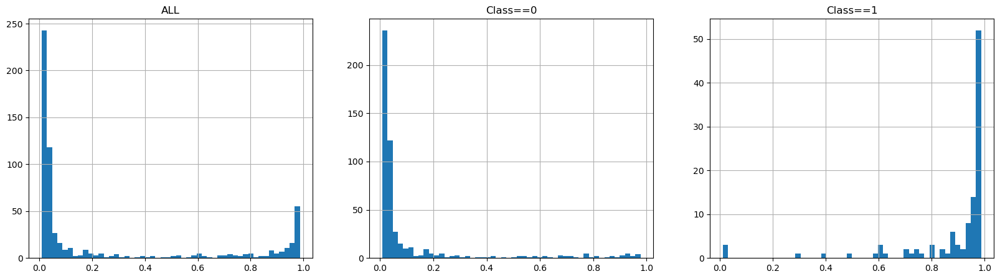

####################################################################################################
CV repeat nbr: 3 - metric: 0.2173


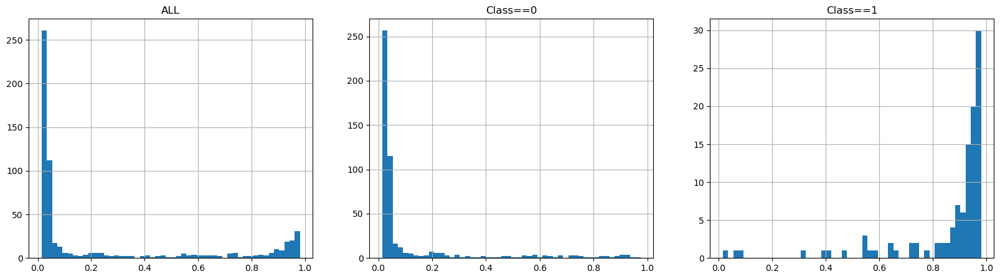

CV repeat nbr: 3 - metric: 0.2149


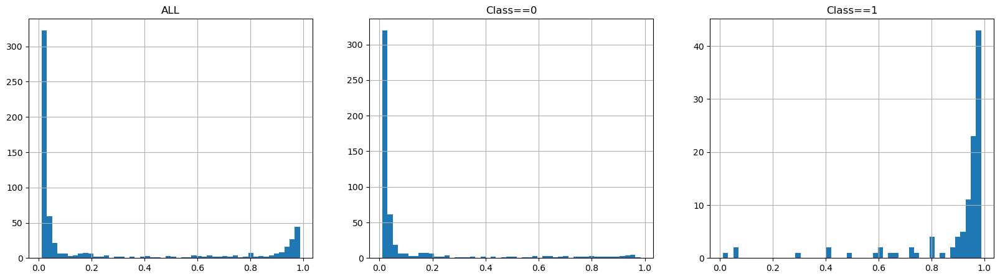

####################################################################################################
CV repeat nbr: 4 - metric: 0.2218


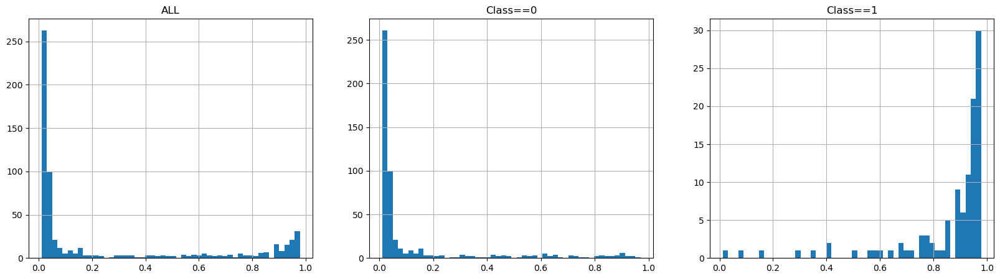

CV repeat nbr: 4 - metric: 0.2204


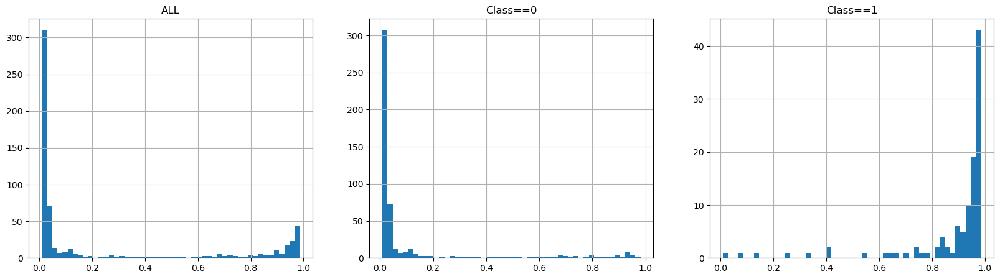

####################################################################################################
CV repeat nbr: 5 - metric: 0.2318


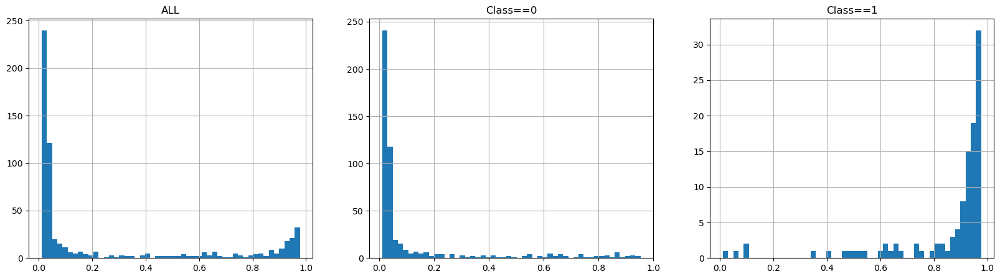

CV repeat nbr: 5 - metric: 0.2312


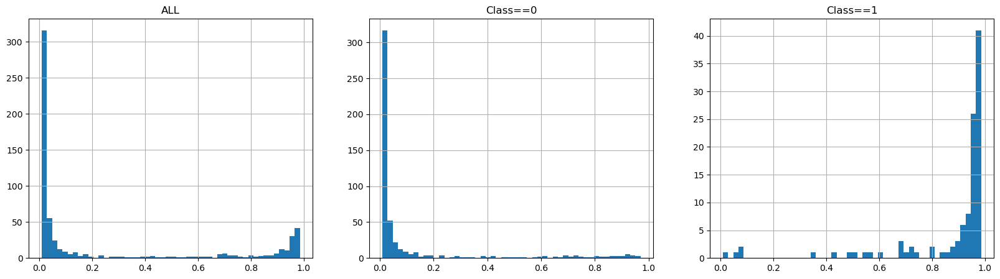

####################################################################################################
CV repeat nbr: 6 - metric: 0.2084


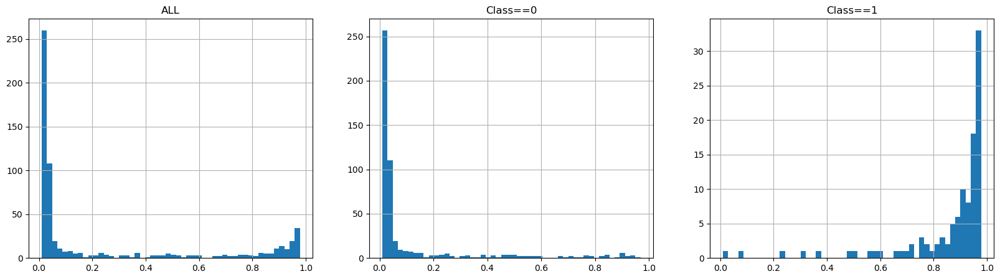

CV repeat nbr: 6 - metric: 0.2046


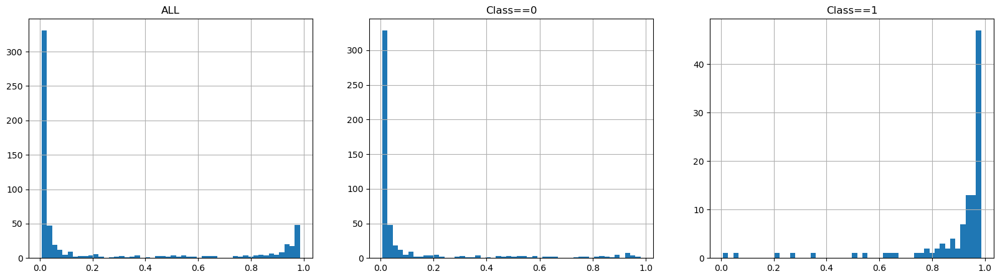

####################################################################################################
CV repeat nbr: 7 - metric: 0.2216


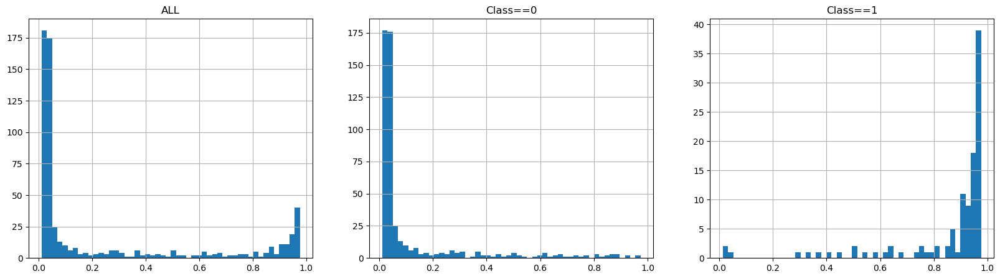

CV repeat nbr: 7 - metric: 0.2181


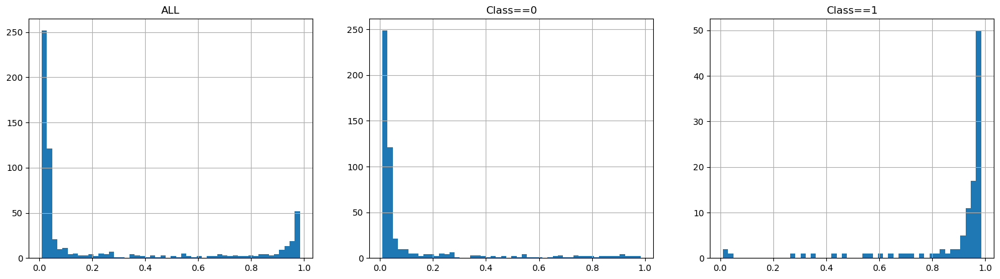

####################################################################################################
CV repeat nbr: 8 - metric: 0.2225


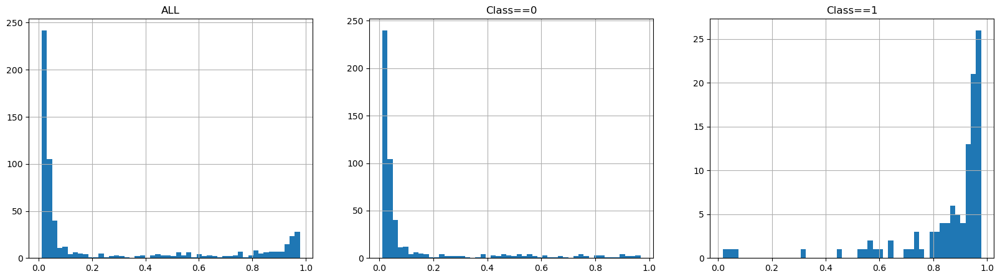

CV repeat nbr: 8 - metric: 0.2184


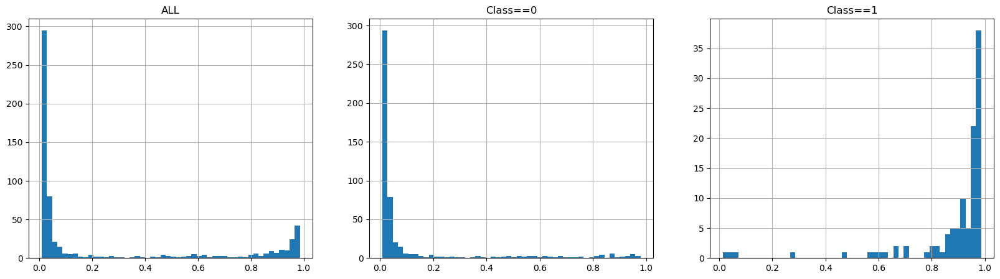

####################################################################################################
CV repeat nbr: 9 - metric: 0.1977


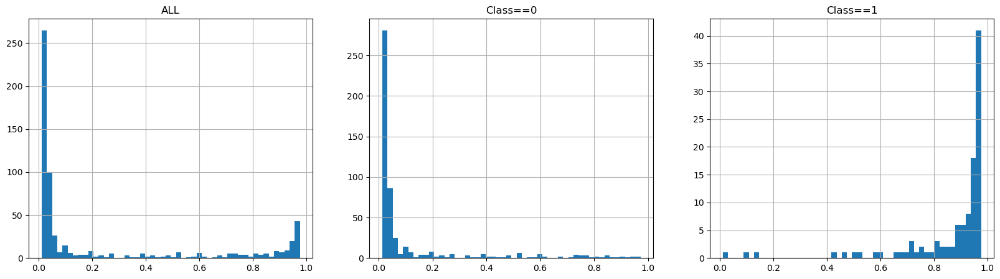

CV repeat nbr: 9 - metric: 0.1932


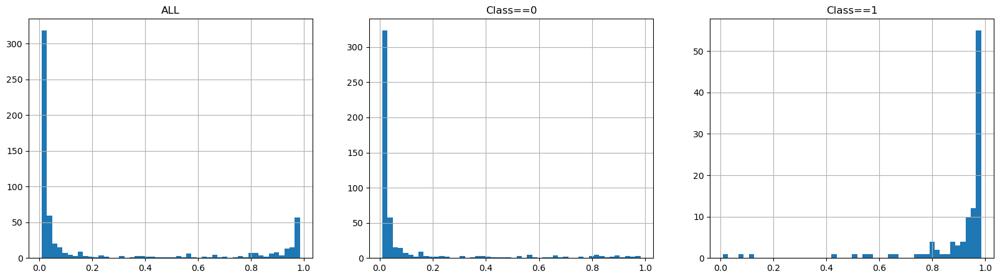

####################################################################################################
CV repeat nbr: 10 - metric: 0.2467


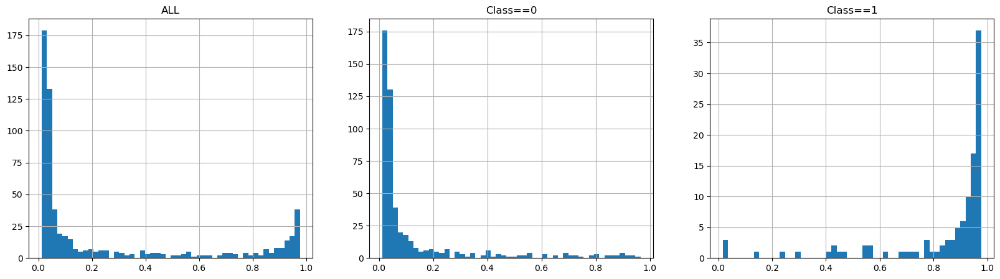

CV repeat nbr: 10 - metric: 0.2440


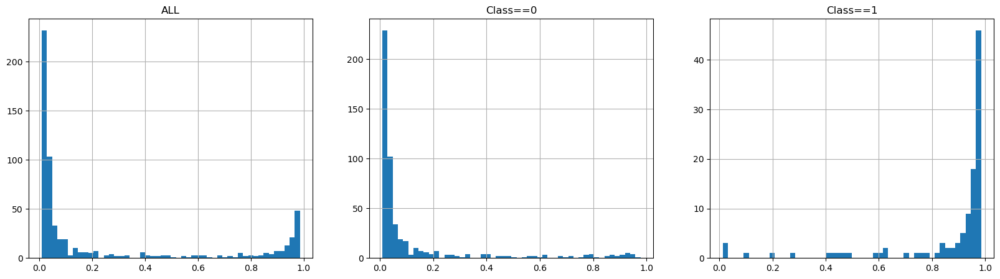

In [45]:
for i,oof in enumerate(oof_dfs):
    print("#"*100)
    oof = oof.copy()
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()
    
    calib_p1 = calibrate_probs(
        oof.pred_proba.values,
        **calib_params
    )
    oof["pred_proba"] = calib_p1
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()


***
# stacking predictions

In [46]:
input_cols = input_cols.tolist().copy()

predicted_probs_all = [
    predicted_probs_m01,
    predicted_probs_m02,
    predicted_probs_m03,
    predicted_probs_m04,
    predicted_probs_m05,
    predicted_probs_m06,
    predicted_probs_m07,
]

for i,proba in enumerate(predicted_probs_all):
    test[f"pm{i+1}"] = proba
    input_cols.append(f"pm{i+1}")

In [47]:
predicted_probs = [model.predict(test[input_cols]) for model in models]
predicted_probs = np.mean(predicted_probs, axis=0)
predicted_probs

array([0.68057873, 0.68057873, 0.68057873, 0.68057873, 0.68057873])

In [48]:
#predicted_probs = calibrate_probs(predicted_probs, **calib_params)
#predicted_probs = np.clip(predicted_probs, a_min=1e-7, a_max=1-1e-7)
#predicted_probs

In [49]:
sub = pd.read_csv("/kaggle/input/icr-identify-age-related-conditions/sample_submission.csv")
sub["class_0"] = 1-predicted_probs
sub["class_1"] = predicted_probs
sub.to_csv("submission.csv", index=False)
sub.describe()

,class_0,class_1
count,5.000000e+00,5.000000e+00
mean,3.194213e-01,6.805787e-01
std,3.225831e-09,3.225831e-09
min,3.194213e-01,6.805787e-01
25%,3.194213e-01,6.805787e-01
50%,3.194213e-01,6.805787e-01
75%,3.194213e-01,6.805787e-01
max,3.194213e-01,6.805787e-01


***